# 👥 **The Group**

> Biagio Fabio Schilirò - 10933149  
  Luca Olivieri - 10723789  
  Filippo Cinfrignini - 10935909  
  Tommaso Giordano - 10723193


# Import Libraries

In [ ]:
import numpy as np
import pandas as pd
from tabulate import tabulate
import seaborn as sns
from collections import Counter
from tqdm import tqdm

import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D

from scipy import stats
from scipy import optimize

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C
from sklearn.preprocessing import StandardScaler
from sklearn.exceptions import ConvergenceWarning
import warnings

In [ ]:
plt.rcParams['axes.grid'] = True
plt.rcParams['lines.markersize'] = 3

# Requirement 1: stochastic environment

In [ ]:
simulation_params = {
    'n_pricing_trials': 2,
    'n_auction_trials': 5,
    'seed': 42
}

## Pricing

In [ ]:
class Environment:
  """
  Environment blueprint class.
  """
  def __init__(self):
    raise NotImplementedError

  def round(self, a_t):
    raise NotImplementedError

In [ ]:
class PricingEnvironment(Environment):
  def __init__(self, conversion_probability, cost):
    """
    Binomial pricing environment. At each round, item can be sold or not
    depending on the conversion probability and item cost.

    Parameters:
    - conversion_probability: sale probability function.
    - cost: cost incurred when selling an item.
    """
    self.conversion_probability = conversion_probability
    self.cost = cost

  def round(self, p_t, n_t):
    """
    Simulates one round.

    Parameters:
    - p_t: price of sold item at time t.
    - n_t: number of customers at current time t.

    Returns:
    - d_t: number of items sold.
    - r_t: total profit.
    """
    d_t = np.random.binomial(n_t, self.conversion_probability(p_t))
    r_t = (p_t - self.cost)*d_t
    return d_t, r_t

In [ ]:
class Agent:
  """
  Agent blueprint class.
  """
  def __init__(self):
    raise NotImplementedError

  def pull_arm(self):
    raise NotImplementedError

  def update(self, r_t):
    raise NotImplementedError

### GP-UCB Agent

In [ ]:
class RBFGaussianProcess:
  """
  Radial Basis Function (RBF) Gaussian Process.
  """
  def __init__(self, scale=1, reg=1e-2):
    self.scale = scale
    self.reg = reg
    self.k_xx_inv = None

  def rbf_kernel_incr_inv(self, B, C, D):
    temp = np.linalg.inv(D - C @ self.k_xx_inv @ B)
    block1 = self.k_xx_inv + self.k_xx_inv @ B @ temp @ C @ self.k_xx_inv
    block2 = - self.k_xx_inv @ B @ temp
    block3 = - temp @ C @ self.k_xx_inv
    block4 = temp
    res1 = np.concatenate((block1, block2), axis=1)
    res2 = np.concatenate((block3, block4), axis=1)
    res = np.concatenate((res1, res2), axis=0)
    return res

  def rbf_kernel(self, a, b):
    a_ = a.reshape(-1, 1)
    b_ = b.reshape(-1, 1)
    output = -1 * np.ones((a_.shape[0], b_.shape[0]))
    for i in range(a_.shape[0]):
        output[i, :] = np.power(a_[i] - b_, 2).ravel()
    return np.exp(-self.scale * output)

  def fit(self, x=np.array([]), y=np.array([])):
    x,y = np.array(x),np.array(y)
    if self.k_xx_inv is None:
        self.y = y.reshape(-1,1)
        self.x = x.reshape(-1,1)
        k_xx = self.rbf_kernel(self.x, self.x) + self.reg * np.eye(self.x.shape[0])
        self.k_xx_inv = np.linalg.inv(k_xx)
    else:
      B = self.rbf_kernel(self.x, x)
      self.x = np.vstack((self.x, x))
      self.y = np.vstack((self.y, y))
      self.k_xx_inv = self.rbf_kernel_incr_inv(B, B.T, np.array([1 + self.reg]))

    return self

  def predict(self, x_predict):
    k = self.rbf_kernel(x_predict, self.x)

    mu_hat = k @ self.k_xx_inv @ self.y
    sigma_hat = 1 - np.diag(k @ self.k_xx_inv @ k.T)

    return mu_hat.ravel(), sigma_hat.ravel()

In [ ]:
class GPUCBAgent(Agent):
  """
  UCB agent operating by means of a Gaussian process.
  """
  def __init__(self, T, discretization=100):
    self.T = T
    self.arms = np.linspace(0, 1, discretization)
    self.gp = RBFGaussianProcess(scale=2).fit()
    self.a_t = None
    self.action_hist = np.array([])
    self.reward_hist = np.array([])
    self.mu_t = np.zeros(discretization)
    self.sigma_t = np.zeros(discretization)
    self.gamma = lambda t: np.log(t+1)**2
    self.beta = lambda t: 1 + 0.5*np.sqrt(2 * (self.gamma(t) + 1 + np.log(T)))
    self.N_pulls = np.zeros(discretization)
    self.t = 0

  def pull_arm(self):
    self.mu_t, self.sigma_t = self.gp.predict(self.arms)
    ucbs = self.mu_t + self.beta(t) * self.sigma_t
    self.a_t = np.argmax(ucbs)
    return self.arms[self.a_t]

  def update(self, r_t):
    self.N_pulls[self.a_t] += 1
    self.action_hist = np.append(self.action_hist, self.arms[self.a_t])
    self.reward_hist = np.append(self.reward_hist, r_t)
    self.gp = self.gp.fit(self.arms[self.a_t], r_t)
    self.t += 1

#### Environment Parameters

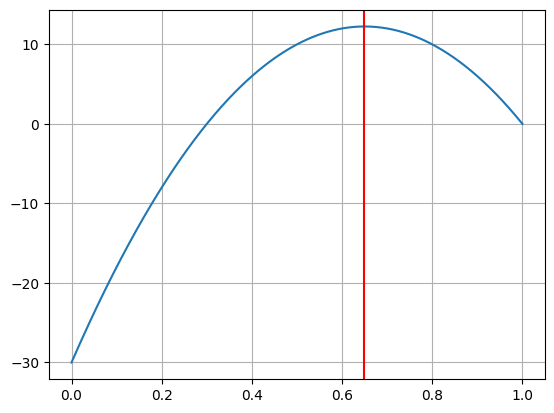

In [ ]:
starting_seed = 0 # do not put seed 42 on low n_trials because it's a lucky seed. The algorithm has downward regret trend by being lucky
T = 200 # number of rounds
K = 15 # number of arms (prices)
n_trials = 5
n_customers = 100 # number of customers at each round
cost = 0.3

conversion_probability = lambda price: 1-price
# conversion_probability = lambda price: np.exp(-price*4)

reward_function = lambda price, n_sales: (price-cost)*n_sales
min_price, max_price = 0, 1

# discretization used only for clairvoyant
prices = np.linspace(min_price, max_price, 1000)

# calculate best price
profit_curve = reward_function(prices, n_customers*conversion_probability(prices))
best_price_index = np.argmax(profit_curve)
best_price = prices[best_price_index]

# calculate clairvoyant rewards (total reward every n_customers)
expected_clairvoyant_rewards = np.repeat(profit_curve[best_price_index], T)

plt.plot(prices, profit_curve)
plt.axvline(best_price, color='red',label='Optimal Price')

In [ ]:
# print recap table
mydata = [
    ["N customers", n_customers],
    ["Best price", round(best_price, 2)],
    ["conversion probability", round(conversion_probability(best_price), 2)],
    ["clairvoyant reward per customer", reward_function(best_price, conversion_probability(best_price))],
    ["clairvoyant reward per round \n(" + str(n_customers) + " customers)", reward_function(best_price, n_customers*conversion_probability(best_price))]
]
# display table
print(tabulate(mydata, tablefmt="grid"))

+---------------------------------+----------+
| N customers                     | 100      |
+---------------------------------+----------+
| Best price                      |   0.65   |
+---------------------------------+----------+
| conversion probability          |   0.35   |
+---------------------------------+----------+
| clairvoyant reward per customer |   0.1225 |
+---------------------------------+----------+
| clairvoyant reward per round    |  12.25   |
| (100 customers)                 |          |
+---------------------------------+----------+


In [ ]:
regrets = []

for trial in range(n_trials):

  np.random.seed(trial + starting_seed)

  agent = GPUCBAgent(T, K)
  env = PricingEnvironment(conversion_probability=conversion_probability, cost=cost)

  agent_rewards = np.array([])

  for t in range(T):
    p_t = agent.pull_arm()
    d_t, r_t = env.round(p_t, n_t=n_customers)
    agent.update(r_t/n_customers)
    agent_rewards = np.append(agent_rewards, r_t)

  regret = np.cumsum(expected_clairvoyant_rewards-agent_rewards)

  regrets.append(regret)

regrets = np.array(regrets)

In [ ]:
prices = agent.action_hist
profits = agent.reward_hist

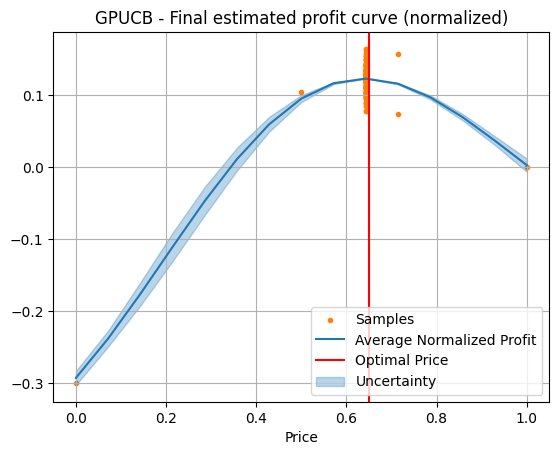

In [ ]:
gp = RBFGaussianProcess(scale=2)

gp.fit(prices, profits)
mu, sigma = gp.predict(np.linspace(min_price, max_price, K))

plt.scatter(prices, profits, label='Samples', color='C1')
plt.plot(np.linspace(min_price, max_price, K), mu, label='Average Normalized Profit')
plt.axvline(best_price, color='red',label='Optimal Price')
plt.fill_between(np.linspace(min_price, max_price, K), mu-sigma, mu+sigma, alpha=0.3, label='Uncertainty', color='C0')
plt.title('GPUCB - Final estimated profit curve (normalized)')
plt.xlabel('Price')
plt.legend()
plt.show()

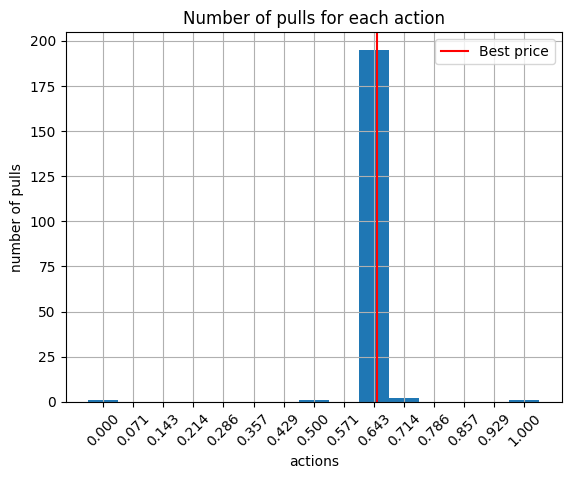

In [ ]:
discr_prices = np.linspace(min_price, max_price, K)

plt.bar(discr_prices, agent.N_pulls, width=(discr_prices[1] - discr_prices[0]))
plt.axvline(best_price, color='red', label='Best price')
plt.xlabel('actions')
plt.ylabel('number of pulls')
plt.legend()
plt.title('Number of pulls for each action')
plt.xticks(discr_prices, rotation = 45)
plt.show()

In [ ]:
regret_avg = np.mean(regrets, axis=0)
regret_std = np.std(regrets, axis=0) # when increasing number of trials, std should decrease, but does not seem to do so. Why?

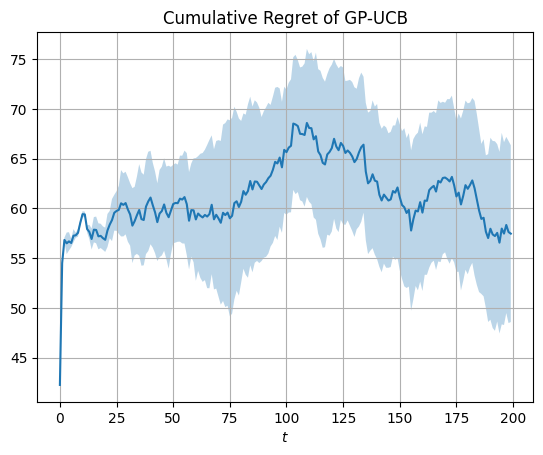

In [ ]:
plt.figure()
plt.plot(regret_avg)
plt.fill_between(range(T),
                 regret_avg - regret_std/np.sqrt(n_trials),
                 regret_avg + regret_std/np.sqrt(n_trials),
                 alpha=0.3,
                 label='Uncertainty')
plt.title('Cumulative Regret of GP-UCB')
plt.xlabel('$t$')
plt.show()

### Observations

- **GP-UCB** performs very well: setting properly the the number of arms $k$ and the GP regulariser $\text{reg}$, it is able to achieve sub-linear regret also with difficult profit curves.

*i.e.*

1. With
  - conversion_probability = $1 - \text{price}$,
  - $k = 15$,
  - $\text{reg} = 10^{-2}$,

  the profit curve is easy to learn, and thus, even with regular values for the hyperparameters, the agent learns quickly the optimal price which halts the growth of the regret (making it constant).

2. With
  - conversion_probability = $e^{-\frac{\text{price}}{4}}$,
  - $k = 30$,
  - $\text{reg} = 10^{-4}$,

  the profit curve is much trickier to handle, the optimal price is surrounded by prices with similiar profits, getting the agent to make some more effort to converge on the optimal price. However, with such parameters, the agents achieves sub-linear regret without to much trouble.

- Given that the parameters that are effective to handle one setting may not be beneficial for others (*i.e.*, case #2 parameters are not that good for case #1), it's just a matter of validation of hyper-parameters, define a space of hyper-parameters, a space of validation settings, and find the combination of hyper-parameters that, on average, works best.

- The variance reached in some settings is decent, there is some variability from trial to trial,  but the trend of the regret behaves similarly (as expected), which is the important thing.



## Truthful Bidding with Bandit Feedback

In [ ]:
auction_params = {
      'ctrs': [1, 1, 1, 1, 1],
      'value': 1, # this is the value_per_click (v_a)
      "gaussian_bidders":
      {
        'bids_mean': [0.1, 0.15, 0.2, 0.3],
        'bids_std': [0.01, 0.01, 0.01, 0.01],
      },
      "uniform_bidders":
      {
          "bids_low": [0.6, 0.15, 0.5, 0.25],
          "bids_high": [0.65, 0.22, 0.6, 0.35],
          # "bids_low": [0, 0, 0, 0],
          # "bids_high": [1, 1, 1, 1],
      },
      'n_users': 2000,
      'budget': 150,
      'n_bids': 15
  }

noise_type = "uniform"

In [ ]:
class Auction:
  """
  Auction blueprint class.
  """
  def __init__(self, *args, **kwargs):
    raise NotImplementedError

  def get_winners(self, bids):
    raise NotImplementedError

  def get_payments_per_click(self, winners, values, bids):
    raise NotImplementedError

  def round(self, bids):
    winners, values = self.get_winners(bids) # allocation mechanism!
    payments_per_click = self.get_payments_per_click(winners, values, bids)
    return winners, payments_per_click

In [ ]:
class SecondPriceAuction(Auction):

  def __init__(self, ctrs):
    """
    Second price auctions: the best hidder pays depending on the second greatest bid.

    Parameters:
    - ctrs: click-through rates of the bidders.
    """
    self.ctrs = ctrs
    self.n_adv = len(self.ctrs)

  def get_winners(self, bids):
    adv_values = self.ctrs*bids
    adv_ranking = np.argsort(adv_values)
    winner = adv_ranking[-1]
    return winner, adv_values

  def get_payments_per_click(self, winners, valuations, bids):
    adv_ranking = np.argsort(valuations)
    second = adv_ranking[-2]
    payment = valuations[second]/self.ctrs[winners]
    return payment.round(2)

In [ ]:
class BiddingAgent:
  """
  Bidding agent blueprint class.
  """
  def __init__(self):
    raise NotImplementedError

  def bid(self):
    raise NotImplementedError

  def update(self):
    raise NotImplementedError

To build the truthful clairvoyant, we sort the rounds in decreasing order of utility, then we bid in the same order (from the most profitable to the less profitable, greedily) as many rounds as possible, until we deplete the budget. Whenever we bid, we bid 1, due to the fact the we know in advance that we will win and our payment is not affected by our bid.

In [ ]:
def get_clairvoyant_truthful(B, my_valuation, m_t, n_users):
  ## I compute my sequence of utilities at every round
  utility = (my_valuation-m_t)*(my_valuation>=m_t)

  ## Now I have to find the sequence of m_t summing up to budget B and having the maximum sum of utility
  ## In second price auctions, I can find the sequence greedily:
  sorted_round_utility = np.flip(np.argsort(utility)) # sorted rounds, from most profitable to less profitable
  clairvoyant_utilities = np.zeros(n_users)
  clairvoyant_bids= np.zeros(n_users)
  clairvoyant_payments = np.zeros(n_users)
  c = 0
  i = 0
  while c <= B-1 and i < n_users:
    clairvoyant_bids[sorted_round_utility[i]] = 1
    clairvoyant_utilities[sorted_round_utility[i]] = utility[sorted_round_utility[i]]
    clairvoyant_payments[sorted_round_utility[i]] = m_t[sorted_round_utility[i]]
    c += m_t[sorted_round_utility[i]]
    i+=1
  return clairvoyant_bids, clairvoyant_utilities, clairvoyant_payments

def get_clairvoyant_non_truthful(B, my_valuation, m_t, n_users):
  # calculate clayrvoyant
  clairvoyant_bids_set = np.linspace(0, 1, 50)
  time = n_users
  n_bids = clairvoyant_bids_set.shape[0]
  rho = B / time

  win_probabilities = np.zeros(n_bids)
  for j, b in enumerate(clairvoyant_bids_set):
    win_probabilities[j] = sum(b > m_t) / time
  expected_clairvoyant_utilities = np.zeros(time)
  expected_clairvoyant_bids = np.zeros(time)
  c = -(my_valuation - clairvoyant_bids_set) * win_probabilities
  A_ub = [clairvoyant_bids_set * win_probabilities]
  b_ub = [rho]
  A_eq = [np.ones(len(clairvoyant_bids_set))]
  b_eq = [1]
  res = optimize.linprog(c, A_ub=A_ub, b_ub=b_ub, A_eq=A_eq, b_eq=b_eq, bounds=(0, 1))
  gamma = res.x
  expected_clairvoyant_utilities = [-res.fun for u in range(time)]
  expected_clairvoyant_bids = [sum(clairvoyant_bids_set*gamma*win_probabilities) for u in range(time)]
  return np.array(expected_clairvoyant_bids), np.array(expected_clairvoyant_utilities), None

In [ ]:
def generate_bids(T, n_agents, noise_type):

  n_adv = n_agents
  bids = np.zeros((n_adv, T))

  if noise_type == "gaussian":
    bids_mean = auction_params["gaussian_bidders"]["bids_mean"]
    bids_std = auction_params["gaussian_bidders"]["bids_std"]

    for i in range(n_adv):
      bids[i] = np.random.normal(bids_mean[i], bids_std[i], T)

  if noise_type == "uniform":
    bids_low = auction_params["uniform_bidders"]["bids_low"]
    bids_high = auction_params["uniform_bidders"]["bids_high"]

    n_adv = len(bids_low)

    for i in range(n_adv):
      bids[i] = np.random.uniform(bids_low[i], bids_high[i], T)

  clipped_bids = np.clip(bids, 0, 1)

  return clipped_bids

In [ ]:
def Auction_trial(auction_params, seed, agent_name, noise_type):

  # Unpack parameters
  budget = auction_params['budget']
  T = auction_params['n_users']
  ctrs = auction_params['ctrs']
  value = auction_params['value']
  K = auction_params['n_bids']

  n_advertisers = len(ctrs) - 1

  np.random.seed(seed)

  auction = SecondPriceAuction(ctrs)

  bids_set = np.linspace(0, 1, K)

  if(agent_name == 'SP'):
    agent = SPMultiplicativePacingAgent(value=value,
                                        budget=budget,
                                        T=T,
                                        eta=50/np.sqrt(T)) # from theory, eta = 1/np.sqrt(T)
  elif(agent_name == 'EXP3'):
    agent = FFMultiplicativePacingEXP3Agent(bids_set=bids_set,
                                          budget=budget,
                                          T=T,
                                          eta=50/np.sqrt(T))  # from theory, eta = 1/np.sqrt(T)
  elif(agent_name == 'UCB1'):
    agent = FFMultiplicativePacingUCB1Agent(bids_set = bids_set,
                                      budget=budget,
                                      T=T,
                                      eta=50/np.sqrt(T)) # from theory, eta = 1/np.sqrt(T)
  elif(agent_name == 'UCBLike'):
    agent = FFMultiplicativePacingUCBLikeAgent(bids_set = bids_set,
                                      budget=budget,
                                      T=T,
                                      eta=1/np.sqrt(T)) # from theory, eta = 1/np.sqrt(T)
  else:
    raise Exception("Can't find specified model")

  other_bids = generate_bids(T, n_advertisers, noise_type)

  other_valuations = np.zeros((n_advertisers, T))

  for a in range(n_advertisers):
    for u in range(T):
      other_valuations[a, u] = ctrs[a+1]*other_bids[a, u]

  other_valuations = np.array(other_valuations)

  max_bid = other_valuations.max(axis=0) ## highest valuation at each round

  valuation = ctrs[0]*value

  clairvoyant = get_clairvoyant_truthful(budget, valuation, max_bid, T)
  clairvoyant_rewards = clairvoyant[1]
  reward_history = []
  bid_history = []
  payment_history = []
  wins_history = []

  for u in range(T):
      # interaction
      my_bid = agent.bid()
      allBids = np.array(my_bid)
      allBids = np.append(allBids, other_bids[:, u])
      winners, payments_per_click = auction.round(bids=allBids)
      my_win = int(winners == 0)
      f_t, c_t = (valuation - max_bid[u]) * my_win, max_bid[u] * my_win
      agent.update(f_t, c_t, my_bid)

      # logging
      reward_history.append(f_t)
      bid_history.append(my_bid)
      payment_history.append(c_t)
      wins_history.append(my_win)

  regret = np.cumsum(clairvoyant_rewards - reward_history)

  return [np.array(regret),
          np.array(reward_history),
          np.array(bid_history),
          np.array(payment_history),
          agent.get_arm_probabilities(),
          np.array(wins_history),
          np.array(clairvoyant_rewards)]

In [ ]:
### run simulation
def Auction_multiple_trials(auction_params, simulation_params, alg_name, noise_type="gaussian"):
    # Unpack simulation parameters
    n_auction_trials = simulation_params['n_auction_trials']
    seed = simulation_params['seed']

    # Unpack auction parameters
    K = auction_params['n_bids']
    T = auction_params['n_users']
    budget = auction_params['budget']

    arms_set = np.linspace(0, 1, K)
    arm_count = np.zeros((n_auction_trials, K))
    arm_final_probabilities = []
    payments = []
    regret = []
    bid_history = []
    rewards = []
    wins = []
    clairvoyant_profits = []

    # execute trials
    for auction_trial in range(n_auction_trials):
        # Execute simulation
        auction_results = Auction_trial(auction_params, seed + auction_trial, alg_name, noise_type)

        regret_trial = auction_results[0]
        reward_history = auction_results[1]
        bid_trial = auction_results[2]
        payment_trial = auction_results[3]
        arm_probabilities = auction_results[4]
        wins_trial = auction_results[5]
        clairovyant_profits_trial = auction_results[6]

        # Log results
        bid_history.append(bid_trial)
        regret.append(regret_trial)
        payments.append(np.cumsum(payment_trial))
        arm_final_probabilities.append(arm_probabilities)
        rewards.append(reward_history)
        wins.append(wins_trial)
        clairvoyant_profits.append(clairovyant_profits_trial)

        ### Calculate arm count
        # Digitize the values to find which bin they fall into
        indices = np.digitize(bid_trial, arms_set) - 1  # -1 to convert to zero-based index
        indices[indices == K] = K-1  # Ensure values exactly equal to 1 fall into the last bin

        # Count occurrences
        counts = np.bincount(indices, minlength=K)
        arm_count[auction_trial, :] = counts

    # compute result arrays
    profits = np.cumsum(np.array(rewards), axis=1)
    payments = np.array(payments)
    regret = np.array(regret)
    arm_final_probabilities = np.array(arm_final_probabilities)
    arm_mean = np.mean(arm_count, axis=0)
    arm_std = np.std(arm_count, axis=0)
    wins = np.array(wins)
    clairvoyant_profits = np.array(clairvoyant_profits)
    bid_history = np.array(bid_history)

    # Compute final aggregated results

    clairovyant_profits_avg = np.sum(clairvoyant_profits, axis=1).mean(axis=0)
    clairovyant_profits_std = np.sum(clairvoyant_profits, axis=1).std(axis=0)

    final_wins_avg = np.sum(wins, axis=1).mean(axis=0)
    final_wins_std = np.sum(wins, axis=1).std(axis=0)

    final_profit_avg = np.sum(rewards, axis=1).mean(axis=0)
    final_profit_std = np.sum(rewards, axis=1).std(axis=0)

    final_regret_avg = regret[:, -1].mean(axis=0)
    final_regret_std = regret[:, -1].std(axis=0)

    # Compute trends for plotting

    # if the agent has the knowledge of arm probabilities, compute metrics about them
    if arm_final_probabilities[0] is not None:
      arm_final_probabilities_mean = np.mean(arm_final_probabilities, axis=0)
      arm_final_probabilities_std = np.std(arm_final_probabilities, axis=0)

    payments_avg = np.mean(payments, axis=0)
    payments_std = np.std(payments, axis=0)

    regret_avg = np.mean(regret, axis=0)
    regret_std = np.std(regret, axis=0)

    bids_history_avg = np.mean(bid_history, axis=0)
    bids_history_std = np.std(bid_history, axis=0)

    profits_avg = np.mean(profits, axis=0)
    profits_std = np.std(profits, axis=0)

    # Aggregated final results displaying

    print(f"Avg clairvoyant profits: {clairovyant_profits_avg:0.3f} +- {(clairovyant_profits_std/n_auction_trials):0.3f}")
    print(f"Avg final number of wins: {final_wins_avg:0.3f} +- {(final_wins_std/n_auction_trials):0.3f}")
    print(f"Avg final profit: {final_profit_avg:0.3f} +- {(final_profit_std/n_auction_trials):0.3f}")
    print(f"Avg final regret: {final_regret_avg:0.3f} +- {(final_regret_std/n_auction_trials):0.3f}")

    # Plotting

    fig = plt.figure(figsize=(15, 20))
    gs = GridSpec(nrows=4, ncols=2, height_ratios=[1, 1, 1, 1])

    axs = []

    axs.append(fig.add_subplot(gs[0, 0]))
    axs.append(fig.add_subplot(gs[0, 1]))
    axs.append(fig.add_subplot(gs[1, 0]))
    axs.append(fig.add_subplot(gs[1, 1]))
    axs.append(fig.add_subplot(gs[2, :]))
    axs.append(fig.add_subplot(gs[3, :]))

    axs[0].set_title('Chosen Bids')
    axs[0].bar(arms_set, arm_mean, width=(arms_set[1]-arms_set[0])*0.9, yerr = arm_std, ecolor = 'red', capsize = 8)
    axs[0].set_xlabel('bids $b$')
    axs[0].set_ylabel('$N_{b}$')

    # if the agent has the knowledge of arm probabilities, show the computed metrics
    if arm_final_probabilities[0] is not None:
      axs[1].set_title('Bids probability distribution')
      axs[1].plot(arms_set, arm_final_probabilities_mean, marker='o')
      axs[1].fill_between(arms_set,
                          arm_final_probabilities_mean - arm_final_probabilities_std/np.sqrt(n_auction_trials),
                          arm_final_probabilities_mean + arm_final_probabilities_std/np.sqrt(n_auction_trials),
                          alpha=0.3)
      axs[1].set_xlabel('bids $b$')
      axs[1].set_ylabel('$x_t$')

    axs[2].plot(payments_avg)
    axs[2].plot()
    axs[2].fill_between(range(T),
                        payments_avg - payments_std/np.sqrt(n_auction_trials),
                        payments_avg + payments_std/np.sqrt(n_auction_trials),
                        alpha=0.3,
                        label='Uncertainty')
    axs[2].set_xlabel('$t$')
    axs[2].set_ylabel('$\sum c_t$')
    axs[2].axhline(budget, color='red', label='Budget')
    axs[2].legend()
    axs[2].set_title('Cumulative Payments')

    axs[3].plot(regret_avg)
    axs[3].fill_between(np.arange(T),
                        regret_avg - regret_std/np.sqrt(n_auction_trials),
                        regret_avg + regret_std/np.sqrt(n_auction_trials),
                        alpha=0.3,
                        label='Uncertainty')
    axs[3].set_xlabel('$t$')
    axs[3].set_ylabel('$\sum R_t$')
    axs[3].set_title('Cumulative Regret')

    axs[4].plot(range(T), bids_history_avg)
    axs[4].fill_between(np.arange(T),
                        bids_history_avg - bids_history_std/np.sqrt(n_auction_trials),
                        bids_history_avg + bids_history_std/np.sqrt(n_auction_trials),
                        alpha=0.3,
                        label='Uncertainty')
    axs[4].set_xlabel('$t$')
    axs[4].set_ylabel('$bids$')
    axs[4].set_title('Bids over time')

    axs[5].plot(profits_avg)
    axs[5].plot(np.cumsum(clairvoyant_profits, axis=1).mean(axis=0))
    axs[5].fill_between(np.arange(T),
                        profits_avg - profits_std/np.sqrt(n_auction_trials),
                        profits_avg + profits_std/np.sqrt(n_auction_trials),
                        alpha=0.3,
                        label='Uncertainty')
    axs[5].set_xlabel('$t$')
    axs[5].set_ylabel('$\sum f_t$')
    axs[5].set_title('Profits')

    plt.tight_layout()

### Primal-dual (SP Pacing Strategy)

In [ ]:
class SPMultiplicativePacingAgent(BiddingAgent):
  def __init__(self, value, budget, T, eta):
    """
    Bidding agent operating through a second-price multiplicative pacing strategy.

    Parameters:
    - valuation: valuation of item used to compute income.
    - budget: advertising campaign budget.
    - T: number of rounds.
    - eta: learning rate used to update lambdas.
    """
    self.value = value
    self.budget = budget
    self.eta = eta
    self.T = T
    self.rho = self.budget/self.T
    self.lmbd = 1
    self.t = 0
    self.lmbd_hist = []

  def bid(self):
    if self.budget < 1:
        return 0
    return self.value/(self.lmbd+1)

  def update(self, f_t, c_t, m_t):
    self.lmbd = np.clip(self.lmbd-self.eta*(self.rho-c_t),
                        a_min=0, a_max=1/self.rho)
    self.lmbd_hist.append(self.lmbd)
    self.budget -= c_t

  def get_arm_probabilities(self):
    return None

Avg clairvoyant profits: 98.272 +- 0.046
Avg final number of wins: 241.000 +- 0.000
Avg final profit: 91.747 +- 0.045
Avg final regret: 6.525 +- 0.047


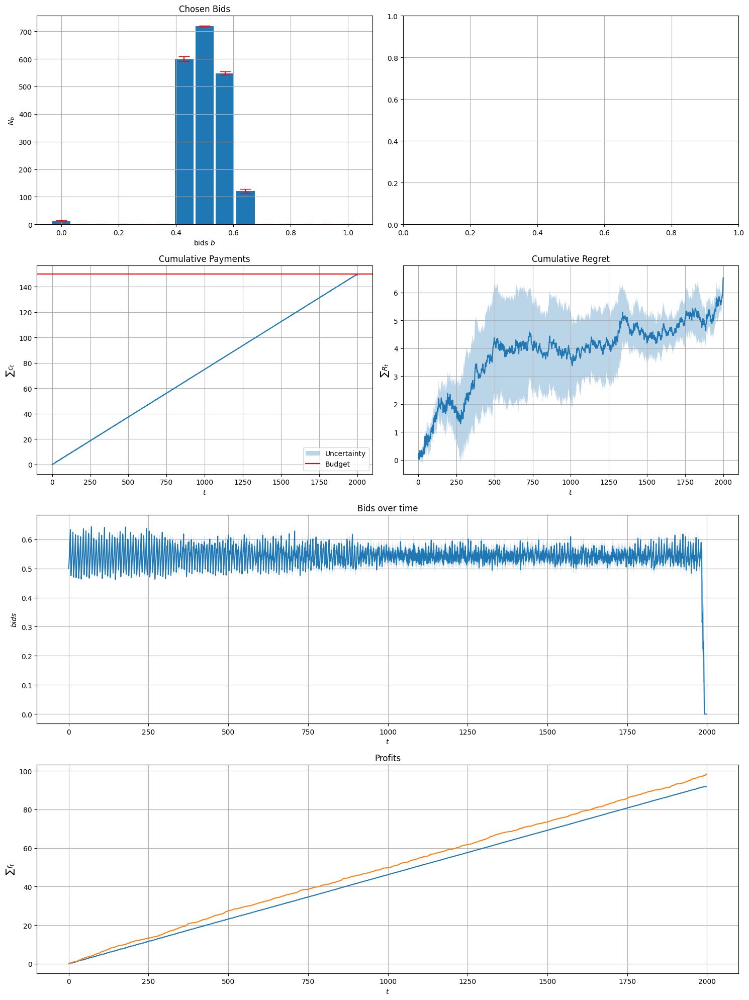

In [ ]:
Auction_multiple_trials(auction_params, simulation_params, 'SP', noise_type)

### Primal-dual (EXP3 Pacing Strategy)

In [ ]:
class EXP3Agent(Agent):
  def __init__(self, K, learning_rate):
    """
    MAB operating through EXP3 algorithm.

    Parameters:
    - K: number of arms (bids)
    - learning_rate: learning rate used in exponential weights updates.
    """
    self.K = K
    self.learning_rate = learning_rate
    self.weights = np.ones(K) # weights used to determine arm probabilities
    self.x_t = np.ones(K)/K # probability distribution of arms (initially uniform)
    self.a_t = None # chosen actions
    self.t = 0 # time index

  def pull_arm(self):
    self.weights = self.weights / np.max(self.weights) # avoid overflow caused by high learning rate
    self.x_t = self.weights/sum(self.weights)
    self.a_t = np.random.choice(np.arange(self.K), p=self.x_t)
    return self.a_t

  def update(self, l_t, arm_index):
    l_tilde = l_t / self.x_t[arm_index]
    self.weights[arm_index] *= np.exp(-self.learning_rate*l_tilde)
    self.t += 1

In [ ]:
class FFMultiplicativePacingEXP3Agent(BiddingAgent):
  def __init__(self, bids_set, budget, T, eta):
    """
    Bidding agent operating through a first-price multiplicative pacing strategy.

    Parameters:
    - bids_set: set of discretised available bids.
    - valuation: valuation of item used to compute income.
    - budget: advertising campaign budget.
    - T: number of rounds.
    - eta: learning rate used to update lambdas.
    """
    self.lmbd_hist = []
    self.bids_set = bids_set
    self.K = len(bids_set)
    self.T = T
    self.exp3 = EXP3Agent(self.K,
                          50*np.sqrt(np.log(self.K)/(self.K * self.T))) # from theory, eta = np.sqrt(np.log(self.K)/KT)
    self.budget = budget
    self.eta = eta
    self.rho = self.budget/self.T
    self.lmbd = 1
    self.t = 0

  def bid(self):
    bid = self.bids_set[self.exp3.pull_arm()]
    if self.budget < bid:
        bid = self.budget
    return bid

  def update(self, f_t, c_t, my_bid):
    # update exp3
    L = f_t - self.lmbd*(c_t-self.rho)
    range_L = 2+(1-self.rho)/self.rho
    my_bid_index = np.where(self.bids_set == my_bid)[0]
    self.exp3.update((2-L)/range_L, my_bid_index) # exp3 needs losses in [0,1]

    # update lagrangian multiplier
    self.lmbd = np.clip(self.lmbd-self.eta*(self.rho-c_t),
                        a_min=0, a_max=1/self.rho)
    self.lmbd_hist.append(self.lmbd)
    # update budget
    self.budget -= c_t

  def get_arm_probabilities(self):
    return self.exp3.x_t

Avg clairvoyant profits: 98.272 +- 0.046
Avg final number of wins: 223.000 +- 1.518
Avg final profit: 83.932 +- 0.588
Avg final regret: 14.340 +- 0.570


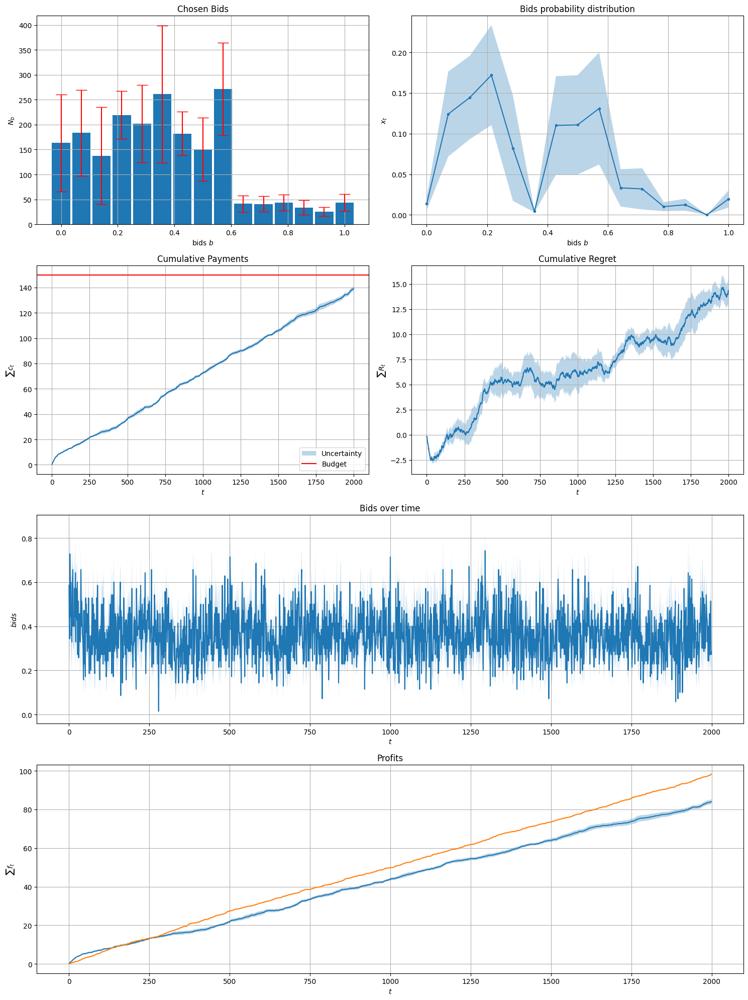

In [ ]:
Auction_multiple_trials(auction_params, simulation_params, 'EXP3', noise_type=noise_type)

The algorithms start with a uniform distribution, it should converge to an optimal expenditure rate, but the (theoretically optimal) learning rates are too small. The algoriths spends too much from the beginning since it fails to lower in a short time the higher bids probabilities. If we crank up the learning rates we improve but this way we ignore the theoretical results.

Starting with a probability distribution leaning on smaller bids is useful to avoid early budget depletion but the algorithm is not smart and robust aniway as it fails to converge in the same way.

How to speed up learning to converge quickly to small bids?

### Primal-dual (UCB1 Pacing Strategy)

In [ ]:
class UCB1Agent(Agent):
    def __init__(self, K, T, range=1):
        self.K = K
        self.T = T
        self.range = range
        self.a_t = None
        self.average_rewards = np.zeros(K)
        self.N_pulls = np.zeros(K)
        self.t = 0

    def pull_arm(self):
        if self.t < self.K:
            self.a_t = self.t
        else:
            # use t instead of T to make it "anytime" (also, in practice, performs better)
            ucbs = self.average_rewards + self.range*np.sqrt(2*np.log(self.T)/self.N_pulls)
            self.a_t = np.argmax(ucbs)
        return self.a_t

    def update(self, r_t):
        self.N_pulls[self.a_t] += 1
        self.average_rewards[self.a_t] += (r_t - self.average_rewards[self.a_t])/self.N_pulls[self.a_t]
        self.t += 1

In [ ]:
class FFMultiplicativePacingUCB1Agent(BiddingAgent):
  def __init__(self, bids_set, budget, T, eta):
    """
    Bidding agent operating through a first-price multiplicative pacing strategy.

    Parameters:
    - bids_set: set of discretised available bids.
    - valuation: valuation of item used to compute income.
    - budget: advertising campaign budget.
    - T: number of rounds.
    - eta: learning rate used to update lambdas.
    """
    self.lmbd_hist = []
    self.bids_set = bids_set
    self.K = len(bids_set)
    self.T = T
    self.ucb = UCB1Agent(self.K, self.T, range=0.01)
    self.budget = budget
    self.eta = eta
    self.rho = self.budget/self.T
    self.lmbd = 1
    self.t = 0

  def bid(self):
    bid = self.bids_set[self.ucb.pull_arm()]
    if self.budget < bid:
        bid = self.budget
    return bid

  def update(self, f_t, c_t, my_bid):
    # update ucb
    L = f_t - self.lmbd*(c_t-self.rho)
    range_L = 2+(1-self.rho)/self.rho
    self.ucb.update(L/range_L)

    # update lagrangian multiplier
    self.lmbd = np.clip(self.lmbd-self.eta*(self.rho-c_t), a_min=0, a_max=1/self.rho)
    self.lmbd_hist.append(self.lmbd)
    # update budget
    self.budget -= c_t

  def get_arm_probabilities(self):
    return self.ucb.average_rewards

Avg clairvoyant profits: 98.272 +- 0.046
Avg final number of wins: 54.400 +- 9.126
Avg final profit: 20.435 +- 3.435
Avg final regret: 77.837 +- 3.445


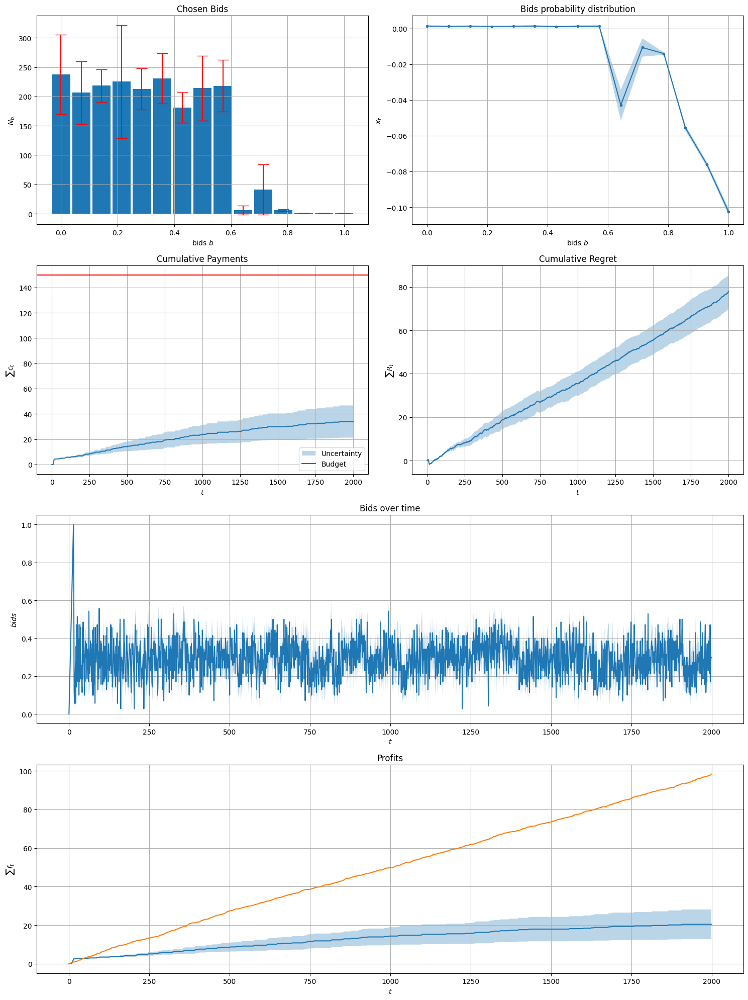

In [ ]:
Auction_multiple_trials(auction_params, simulation_params, 'UCB1', noise_type=noise_type)

### UCB-like Algorithm

In [ ]:
class UCBLikeAgent(Agent):
  """
  UCB-like algorith for MAB generalised auctions.

  Parameters:
  - K: number of arms (bids).
  - T: number of rounds.
  - range: term affecting exploration, higher is more explorative.
  """
  def __init__(self, K, T, range=1):
    self.K = K
    self.T = T
    self.range = range
    self.a_t = None
    self.average_profit = np.zeros(self.K)
    self.average_cost = np.zeros(self.K)
    self.profit_ucbs = np.zeros(self.K)
    self.cost_ucbs = np.zeros(self.K)
    self.N_pulls = np.zeros(self.K)
    self.arm_probabilities = np.zeros(self.K)
    self.t = 0

  def pull_arm(self, rho):
    if self.t < self.K:
      self.a_t = self.t
    else:
      # use t instead of T to make it "anytime" (also, in practice, performs better)
      self.profit_ucbs = self.average_profit + self.range*np.sqrt(2*np.log(self.T)/self.N_pulls)
      self.cost_ucbs = self.average_cost - self.range*np.sqrt(2*np.log(self.T)/self.N_pulls)

      ## Linear Program OPT_t
      c = -self.profit_ucbs
      A_ub = [self.cost_ucbs]
      b_ub = [rho]
      A_eq = [np.ones(self.K)]
      b_eq = [1]
      res = optimize.linprog(c, A_ub=A_ub, b_ub=b_ub, A_eq=A_eq, b_eq=b_eq, bounds=(0,1))
      gamma = res.x

      # print(self.cost_ucbs)
      # print(f"{self.cost_ucbs@gamma} < {rho}")

      self.arm_probabilities = gamma

      # Bid from the discrete probability distribution
      bid_index = np.random.choice(self.K, p=gamma)
      self.a_t = bid_index

    return self.a_t

  def update(self, f_t, c_t):
    self.N_pulls[self.a_t] += 1
    self.average_profit[self.a_t] += (f_t - self.average_profit[self.a_t])/self.N_pulls[self.a_t] # online average update
    self.average_cost[self.a_t] += (c_t - self.average_cost[self.a_t])/self.N_pulls[self.a_t] # online average update

    self.t += 1

In [ ]:
class FFMultiplicativePacingUCBLikeAgent(BiddingAgent):
  def __init__(self, bids_set, budget, T, eta):
    """
    Bidding agent operating through a first-price multiplicative pacing strategy.

    Parameters:
    - bids_set: set of discretised available bids.
    - valuation: valuation of item used to compute income.
    - budget: advertising campaign budget.
    - T: number of rounds.
    - eta: learning rate used to update lambdas.
    """
    self.lmbd_hist = []
    self.bids_set = bids_set
    self.K = len(bids_set)
    self.T = T
    self.ucb = UCBLikeAgent(self.K, self.T, range=0.01)
    self.budget = budget
    self.eta = eta
    self.rho = self.budget/self.T
    self.lmbd = 1
    self.t = 0

  def bid(self):
    bid = self.bids_set[self.ucb.pull_arm(self.rho)]
    if self.budget < bid:
        bid = self.budget
    return bid

  def update(self, f_t, c_t, my_bid):
    # update ucb
    self.ucb.update(f_t, c_t)
    # update budget
    self.budget -= c_t

  def get_arm_probabilities(self):
    return self.ucb.arm_probabilities # + self.ucb.range*np.sqrt(2*np.log(self.ucb.T)/self.ucb.N_pulls)


Avg clairvoyant profits: 98.272 +- 0.046
Avg final number of wins: 238.800 +- 0.233
Avg final profit: 89.603 +- 0.104
Avg final regret: 8.669 +- 0.145


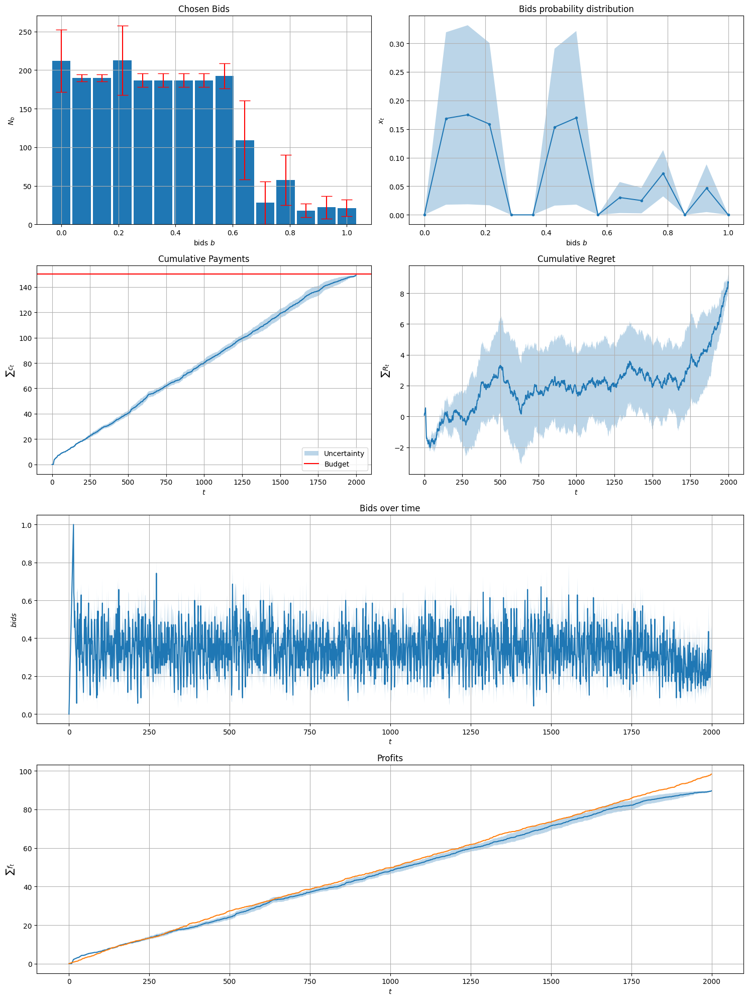

In [ ]:
Auction_multiple_trials(auction_params, simulation_params, 'UCBLike', noise_type=noise_type)

### Observations

**Settings**

1. Our valuation is higher than others' but we cannot afford to always bid it for budget constraints.
The algorithms have to find an optimal bidding range to maximise profits keeping an eye on the budget.

  - **SP** converges on an optimal bid (around the highest adversarial bid $m_t$), achieving "constant" regret. Its bids are very stable, there are tiny fluctuation. However, its depletes the budget some rounds before the end, making making the regret have a spike in the final rounds. Mild regret variance among trials.
  - **EXP3** achieves sub-linear regret (almost constant) by bidding in a range of low bids, but bidding too high at the beginning and thus taking over the clairvoyant in the initial rounds. Given that range is somewhat large in diameter and the bids in it have significant probabilities, the bidding trend is quite noisy. The regret variance is quite low.
  - **UCB1** achieves sub-linear regret, with a bidding strategy that is very similar to EXP3, with the bidding distribution that is basically uniform in the same range. The bids trend is slightly less noisy, likely it is more stable in the lower range with less rare spikes in higher ranges. Very small regret variance among trials.
  - **UCB-like** achieves sub-linear regret (basically constant) bidding in the same range of EXP3 and UCB1 but prefering the bids that are preferred by SP (almost like if it was in the middle of them), until the end, in which it depletes the budget a little too early on, and has a generous spike of regret. Its bidding strategy is still quite noisy. The regret variance is mild.

  **In total**, all algorithms achieve very good regret trend but they all deplete the budget a little too early one, losing the potential utility of the last bids and observing some form of regret spike in the last rounds.

2. Our valuation is superior to others and we have enough budget to win every auction. The optimal strategy would be to win every auction, since we have the greatest valuation and the budget to afford to win everything.

  - **SP** bids 1, the maximum (also the valuation), from beginning to end, achieving a perfect 0.0 regret.
  - **EXP3** does not converge to an optimal bid, the regret is linear from beginning to end. Its bidding strategy is very noisy, ranging basically all over the bidding space. Still, it earns a good amount of profit, it could bid higher but it does not, it holds back
  - **UCB** and **UCB-like** bid in a higher-end interval and achieve a very good regret, converging very quickly and winning every auction from that point until the end.

  **In total**, all algorithms behave optimally, except for EXP3 which bids in a confused way and earn less profit.

3. Our valuation is very low, lower than any other bidder's.
The optimal strategy would be not to win any auction, since the valuation is so low and adversaries bid so high that we would not earn any money by winnin auctions.

  - **SP**, **UCB1** and **UCB-like** are optimal, quickly converge to a perfect regret. SP bids is valuation, earning no profit as expected, UCB-like bids in a low range, low enough not to win and then without wasting any money as well.

  - **EXP3**, like in setting #2, does not converge, achieves a linear regret. It somewhat prefers lower (then, better) bids, but keeps on exploring and trying higher bids, result in a good amount of expenses, without ever escaping this losing situation.

  **In total**, all algorithms behave optimally, except for EXP3 which keeps on trying higher bids and constantly spends some money.

4. Our valuation is inside a range of bidding of another agent. In this case the optimal bidding strategy is not trivial: the agent needs to find a equilibrium price which allows it to earn enough without spending too much, but the operating of the adversary makes this optimal balance unclear and context-dependent.

  - **All algorithms** fail to achieve sub-linear regret. They all oscillate around a certain bid mean (EXP3 and UCBLike being the noisiest). All but UCB1 manage to constantly earn some profit (SP being the most profitable, EXP3 and UCBLike on the same level), while UCB1 makes negligible profits.

### Summary


- Basically, among the **primal-duals**, SP seems to behave as the best one (competing with EXP3 and UCB1), as it delivers better performances in the considered scenarios, sometimes achieving optimal regret trends also in some settings where the others two fail. UCB1 is in the second position, delivering similar results to SP but slightly worse, even though they achieve very similiar regret and bidding trends. Lastly, EXP3 is the worst among the PD, as it shows some unrobustness failing some trivial settings, and generally delivering somewhat worse performance w.r.t the first two ones (even when achieving sub-linear regret).
- **UCBLike** behaves similarly to SP, sometimes better sometimes worse, achieving a very good regret trend (sometimes the better one) but being very exposed to the common problem of finishing the budget too early (earlier than others).
- However, all of them fails to achieve sub-linear regret in some scenarios, then there is no perfect model.
- All of them tend to finish the budget some rounds earlier when they run to budget depletion.
- In conclusion, I'd pick SP as the primal-dual.

## Pricing and Bidding

The interaction proceeds as follows:
- In each day we play a fixed number of auctions
- We win a certain number of auctions, let's call it $N_{win}$
- From $N_{win}$ users, only $N_{win}*q_a$ will visit our website
- The conversion probability is a function of the price: $f(p)=1/p + \eta$
- The expected number of buyers $N_{buy}=N_{win}*q_a*f(p)$ (the actual number is sampled from a binomial distribution of $N_\text{win}$ trials and which probability)
- The profit is $P=(p-cost)*N_{buy}$
- We update the GP_UCB agent with the normalized reward: $R=P/N_{win}$ (*)
- GP_UCB agent is updated every day with data from that day's auctions

(*) Careful because now GP_UCB is updated with total profit P, since the number of customers (equivalent to $N_{win}$) is constant

In [ ]:
auction_params = {
      'ctrs': [1, 1, 1, 1, 1], # q_a
      'value': 1, # this is the value_per_click (v_a), valuation is q_a * v_a, which should we use?
      "gaussian_bidders":
      {
        'bids_mean': [0.4, 0.5, 0.6, 0.7],
        'bids_std': [0.1, 0.1, 0.1, 0.1],
      },
      "uniform_bidders":
      {
          "bids_low": [0.3, 0.5, 0.7, 0.8],
          "bids_high": [0.5, 0.8, 0.9, 1.0],
      },
      'n_users': 2_000,
      'budget': 150,
      'n_bids': 20,
  }

noise_type = "uniform"
# algs = ["SP", "EXP3", "UCB1", "UCBLike"]
# algs = ["SP", "EXP3", "UCB1"] # PRIMAL-DUAL EVALUATION
algs = ["SP", "UCBLike"] # FINAL EVALUATION

In [ ]:
pricing_params = {
    "n_days": 8, # number of pricing rounds
    "n_prices": 20, # number of prices (MAB arms)
    "conversion_probability": lambda price: 1-price/1,
    "cost": 0.3,
    "reward_function": lambda price, n_sales: (price-cost)*n_sales,
    "min_price": 0,
    "max_price": 1
}

In [ ]:
simulation_params = {
    'n_trials': 4,
    'seed': 42
}

### Simulation

In [ ]:
def calculate_statistics(data, sliding_window=False, window_size=10):
    data_np = np.array(data)
    mean = np.mean(data_np, axis=0)
    std = np.std(data_np, axis=0)
    if(sliding_window):
      window = np.ones(window_size) / window_size
      mean = np.convolve(mean, window, mode='valid')
      std = np.convolve(std, window, mode='valid')
    n = data_np.shape[0]
    conf_interval = 1.96 * (std / np.sqrt(n))
    return mean, conf_interval

In [ ]:
def pricing_bidding_multiple_trial(alg):

  n_trials = simulation_params["n_trials"]
  seed = simulation_params["seed"]
  ctrs = auction_params["ctrs"]
  n_users = auction_params["n_users"]
  n_days = pricing_params["n_days"]
  n_prices = pricing_params["n_prices"]
  conversion_probability = pricing_params["conversion_probability"]
  cost = pricing_params["cost"]

  profit_trials = []
  sell_price_trials = []
  bids_trials = []
  auction_regret_trials = []
  pricing_regret_trials = []

  # --- PRICING CLAIRVOYANT DEFINITION --- #
  # discretization used only for clairvoyant
  prices = np.linspace(min_price, max_price, 1000)

  # calculate best price
  profit_curve = reward_function(prices, conversion_probability(prices))
  best_price_index = np.argmax(profit_curve)
  best_price = prices[best_price_index]

  # calculate clairvoyant rewards (total reward every n_customers)
  expected_clairvoyant_rewards = np.repeat(profit_curve[best_price_index], n_days)

  # --- SIMULATION --- #

  for pricing_trial in range(n_trials):
    current_seed = seed + pricing_trial
    np.random.seed(current_seed)

    pricing_agent = GPUCBAgent(n_days, n_prices)
    pricing_env = PricingEnvironment(conversion_probability=conversion_probability, cost=cost)

    profit_history = []
    sell_price_history = []
    bids_history = np.array([])
    auction_regret_history = []
    pricing_regret_history = []

    for day in range(n_days):
      current_seed = seed + pricing_trial + day
      np.random.seed(current_seed)

      # calculate sell price of the day
      sell_price = pricing_agent.pull_arm()

      # execute simulation
      auction_results = Auction_trial(auction_params, current_seed, alg, noise_type)

      # number of auctions we won
      n_wins = auction_results[5].sum()

      # number of customers clicking on ad and visiting our website
      n_clicks = n_wins * ctrs[0]

      # calculate items sold from customers that visited our website
      items_sold, total_profit = pricing_env.round(sell_price, n_clicks)

      # update pricing agent
      pricing_agent.update(total_profit/n_clicks)

      # logging
      profit_history.append(total_profit)
      sell_price_history.append(sell_price)
      bids_history = np.concatenate((bids_history, auction_results[2]))
      auction_regret_history = np.concatenate((auction_regret_history, auction_results[0]))

    pricing_regret_history = np.cumsum(expected_clairvoyant_rewards-profit_history/n_clicks)

    profit_trials.append(profit_history)
    sell_price_trials.append(sell_price_history)
    bids_trials.append(bids_history)
    auction_regret_trials.append(auction_regret_history)
    pricing_regret_trials.append(pricing_regret_history)

  return [profit_trials,
          sell_price_trials,
          bids_trials,
          auction_regret_trials,
          pricing_regret_trials]

SP
- - - - - - - - - - - - - - - - - - - - -
Average profit per trial: 69.272 profits
UCBLike
- - - - - - - - - - - - - - - - - - - - -
Average profit per trial: 76.362 profits


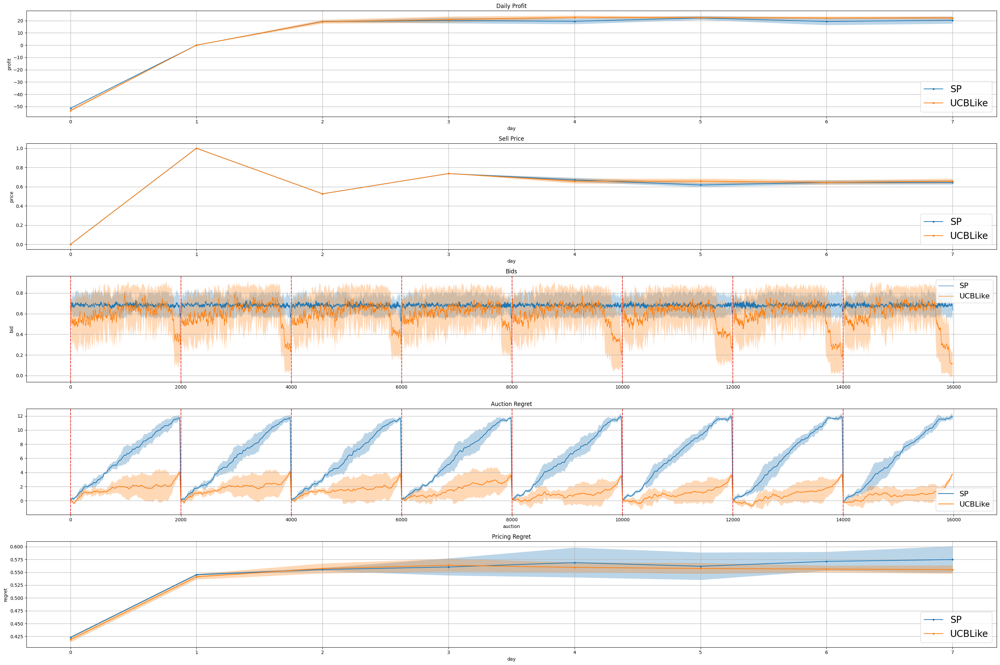

In [ ]:
fig = plt.figure(figsize=(30, 20))
gs = GridSpec(nrows=5, ncols=1, height_ratios=[1, 1, 1, 1, 1])

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
ax3 = fig.add_subplot(gs[2])
ax4 = fig.add_subplot(gs[3])
ax5 = fig.add_subplot(gs[4])

n_users = auction_params["n_users"]

for alg in algs:

  pricing_bidding_results = pricing_bidding_multiple_trial(alg)

  profit_trials = pricing_bidding_results[0]
  sell_price_trials = pricing_bidding_results[1]
  bids_trials = pricing_bidding_results[2]
  auction_regret_trials = pricing_bidding_results[3]
  pricing_regret_trials = pricing_bidding_results[4]

  # Average metrics computation
  profit_avg, profit_confidence = calculate_statistics(profit_trials)
  price_avg, price_confidence = calculate_statistics(sell_price_trials)
  bids_avg, bids_confidence = calculate_statistics(bids_trials, sliding_window=True, window_size=20)
  auction_regret_avg, auction_regret_confidence = calculate_statistics(auction_regret_trials, sliding_window=True, window_size=20)
  pricing_regret_avg, pricing_regret_confidence = calculate_statistics(pricing_regret_trials)

  print("=========================================")
  print(f"{alg}")
  print("- - - - - - - - - - - - - - - - - - - - -")
  print(f"Average profit per trial: {np.sum(profit_avg):0.3f} profits")

  ax1.set_title('Daily Profit')
  ax1.plot(np.arange(profit_avg.shape[0]), profit_avg, marker="o", label=f"{alg}")
  ax1.fill_between(np.arange(profit_avg.shape[0]),
                      profit_avg - profit_confidence,
                      profit_avg + profit_confidence,
                      alpha=0.3)
  ax1.set_xlabel('day')
  ax1.set_ylabel('profit')
  ax1.legend(fontsize=20, loc='lower right')

  ax2.set_title('Sell Price')
  ax2.plot(np.arange(price_avg.shape[0]), price_avg, marker="o", label=f"{alg}")
  ax2.fill_between(np.arange(price_avg.shape[0]),
                      price_avg - price_confidence,
                      price_avg + price_confidence,
                      alpha=0.3)
  ax2.set_xlabel('day')
  ax2.set_ylabel('price')
  ax2.legend(fontsize=20, loc='lower right')

  ax3.set_title('Bids')
  ax3.plot(np.arange(bids_avg.shape[0]), bids_avg, label=f"{alg}", linewidth=1)
  ax3.fill_between(np.arange(bids_avg.shape[0]),
                  bids_avg - bids_confidence,
                  bids_avg + bids_confidence,
                  alpha=0.3)
  # ax3.set_xlabel('auction')
  ax3.set_ylabel('bid')
  # put lines to mark days
  for i in range(0, bids_avg.shape[0], int(n_users)):
      ax3.axvline(x=i, color='red', linestyle='--', alpha=0.5)
  ax3.legend(fontsize=16, loc='upper right')

  ax4.set_title('Auction Regret')
  ax4.plot(np.arange(auction_regret_avg.shape[0]), auction_regret_avg, label=f"{alg}")
  ax4.fill_between(np.arange(auction_regret_avg.shape[0]),
                      auction_regret_avg - auction_regret_confidence,
                      auction_regret_avg + auction_regret_confidence,
                      alpha=0.3)
  ax4.set_xlabel('auction')
  # put lines to mark days
  for i in range(0, auction_regret_avg.shape[0], int(n_users)):
      ax4.axvline(x=i, color='red', linestyle='--', alpha=0.5)
  ax4.legend(fontsize=16, loc='lower right')

  ax5.set_title('Pricing Regret')
  ax5.plot(np.arange(pricing_regret_avg.shape[0]), pricing_regret_avg, marker="o", label=f"{alg}")
  ax5.fill_between(np.arange(pricing_regret_avg.shape[0]),
                      pricing_regret_avg - pricing_regret_confidence,
                      pricing_regret_avg + pricing_regret_confidence,
                      alpha=0.3)
  ax5.set_xlabel('day')
  ax5.set_ylabel('regret')
  ax5.legend(fontsize=20, loc='lower right')

print("=========================================")

plt.tight_layout()
plt.show()

### Observations

First, it's important to underline that, in the pricing+bidding problem, the two phases are de-coupled: the pricing agent attempts to find as many clients as it can, within its budget, agnostic of the actual value resulting from the sales. Indeed the estimated value used in their bidding strategy is 1, the largest possible: this way, the agents does not worry about the value potentially generated by the sales involving the customer they have gathered, they just focus on gathering as many customers as possible. On the other hand, pricing of course does not pay attention to the bidding problem, but tries solely to find the optimal price that maximises the profit w.r.t to the customer that have been gathered by the bidder agent. Thus, **the two phases and the two agents are completely independent**.

We decided to perform 2 separate evaluation, the main one being the one involving the believed-to-be the best primal-dual, SP, and UCB-Like, as requested by the requirements. Then, another evaluation compares all the primal duals, SP, EXP3, and UCB1, to analyse their behaviour. These evaluations comprise the same settings. They might as well have been aggregated altogether, but then the plot visualisation become untidy and hard to read.

We performed each evaluation in two scenarios. These two involve two different bidding scenario, since it is the hardest one to assess. Thus, the pricing setting is the same and its evaluation is made once for all.

#### Primal-Dual

1. In the first scenario, the bidders have values which are smaller then ours (1), so we are allowed to bid very high until budget depletion.

  - **SP** behaves reasonably well, achieving a good regret growth but hardly sub-linear. Still, it makes good profits.
  - **EXP3** and **UCB1** achieve two much worse regret growth, linear and fast-increasing, failing to converge to a sufficiently optimal bidding strategy.

2. In the second scenario, one bidder bids in a range that comprises the highest value (1), so it becomes harder for our agent to decide the optimal bid since the budget can decrease faster.

  - The same consideration made for setting 1 repeat here, all agents fail to achieve sub-linear regret but SP performs much better, earns more profits.

#### Final

1. In the first scenario, the bidders have values which are smaller then ours (1), so we are allowed to bid very high until budget depletion.

  - **UCBLike** performs very well, achieving flat regret immediately and profiting a lot.
  - **SP** behaves well but worse than UCBLike, converging on a suboptimal bid and thus having a constant but quite slow regret growth. As such, it profits less than UCBLike but not too much.

2. In the second scenario, one bidder bids in a range that comprises the highest value (1), so it becomes harder for our agent to decide the optimal bid since the budget can decrease faster.

  - The same consideration made for setting 1 repeat: UCBLike achieves an excellent regret while SP is visibily worse but still profiting slightly sub-optimally.

---

Besides these bidding evaluations, the pricing agents performs very good, achieving an excellent flat regret, converging quickly to the optimal price.

### Summary

Among the **SP**, **EXP3**, **UCB1**, **UCBLike**, the last one is the best one, achieving excellent regret, while the other ones fail to achieve sub-linear regret but still profiting enough (SP > EXP3 > UCB1).

# Requirement 2: adversarial environment

## Required features for the environment

In [ ]:
# Generate competing bids sequence
def generateCompetingBids(time, num_agents = 10):

    # Mean of the bid distribution varies sinusoidally with time (as it is defined, the mean goes from 0.1 to 0.9)
    meanBid = 0.5 + 0.4 * np.sin(0.8 * time)
    stdBid = 0.1
    bids = np.random.normal(meanBid, stdBid, num_agents)

    return np.clip(bids, 0, 1)                                                # To be sure the prices are in [0, 1]


# Generate user buying probability function
def buyingProbability(price, time):

    # The base probability decreases with higher prices (Higher prices should have lower base probability)
    baseProbability = 1 - price

    # Adding time variability using a sinusoidal function
    timeVariation = 0.2 * np.sin(0.8 * time)

    # Combine base probability and time variation, ensuring the result is within [0, 1]
    probability = baseProbability + timeVariation

    return np.clip(probability, 0, 1)

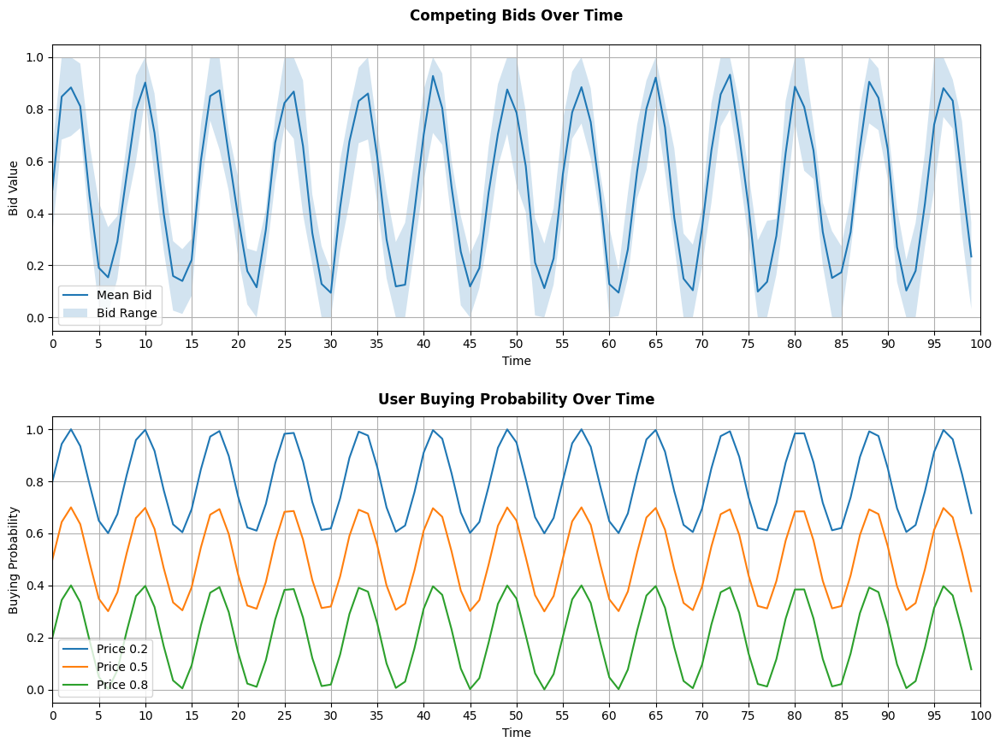

In [ ]:
# Simulating over a period of time
timePeriods = 100
prices = np.linspace(0, 1, 100)


# Storage for visualization
allBids = []
allProbabilities = []


for t in range(timePeriods):

    bids = generateCompetingBids(t)
    allBids.append(bids)

    probabilities = [buyingProbability(p, t) for p in prices]
    allProbabilities.append(probabilities)


fig, ax = plt.subplots(2, 1, figsize = (14, 10))
fig.subplots_adjust(hspace = 0.3)

# Plot competing bids over time
ax[0].plot(range(timePeriods), [np.mean(bids) for bids in allBids], label = 'Mean Bid')
ax[0].fill_between(range(timePeriods), [np.min(bids) for bids in allBids], [np.max(bids) for bids in allBids], alpha = 0.2,
                   label = 'Bid Range')

ax[0].set_title('Competing Bids Over Time', pad = 20, fontweight = 'bold')
ax[0].set_xlabel('Time')
ax[0].set_ylabel('Bid Value')
ax[0].set_xticks(range(0, timePeriods + 1, 5))
ax[0].set_xlim(0, timePeriods)
ax[0].legend()
ax[0].grid(True)


# Plot user buying probability for a sample of prices over time
for price in [0.2, 0.5, 0.8]:

  ax[1].plot(range(timePeriods), [buyingProbability(price, t) for t in range(timePeriods)], label = f'Price {price}')

ax[1].set_title('User Buying Probability Over Time', pad = 10, fontweight = 'bold')
ax[1].set_xlabel('Time')
ax[1].set_ylabel('Buying Probability')
ax[1].set_xticks(range(0, timePeriods + 1, 5))
ax[1].set_xlim(0, timePeriods)
ax[1].legend()
ax[1].grid(True)

plt.show()

## Pricing Problem

### Environment Definition

In [ ]:
class Environment:

  """

  Environment blueprint class.

  """

  def __init__(self):

    raise NotImplementedError


  def round(self, a_t):

    raise NotImplementedError

In [ ]:
class ExpertPricingEnvironment(Environment):

    def __init__(self, buyingProbability, cost, prices):

        self.buyingProbability = buyingProbability
        self.cost = cost
        self.prices = prices
        self.t = 0



    def round(self, n_t):

      """
      Simulates one round.

      Parameters:
                      - n_t: number of customers at current time t

      Returns:

                      - l_t: loss at round t for all the prices (We have full-feedback)
      """

      # Estimate the maximum possible reward at round t
      possible_rewards = [(price - self.cost) * np.random.binomial(n_t, self.buyingProbability(price, self.t)) for price in self.prices]
      max_possible_reward = max(possible_rewards)

      # Compute the losses for all prices as the diffence between the maximum possible reward and each reward
      l_t = [max_possible_reward - ((price - self.cost) * np.random.binomial(n_t, self.buyingProbability(price, self.t))) for price in self.prices]

      self.t += 1


      return l_t

In [ ]:
class BanditPricingEnvironment(Environment):

    def __init__(self, buyingProbability, cost, prices):

        self.buyingProbability = buyingProbability
        self.cost = cost
        self.prices = prices
        self.t = 0



    def round(self, p_t, n_t):

      """
      Simulates one round.

      Parameters:
                      - p_t: price of sold item at time t
                      - n_t: number of customers at current time t

      Returns:

                      - l_t: loss at round t for the chosen price
      """


      d_t = np.random.binomial(n_t, self.buyingProbability(p_t, self.t))
      r_t = (p_t - self.cost) * d_t

      # Estimate the maximum possible reward at round t
      possible_rewards = [(price - self.cost) * np.random.binomial(n_t, self.buyingProbability(price, self.t)) for price in self.prices]
      max_possible_reward = max(possible_rewards)

      # Compute the loss as the difference between the maximum possible reward at round t and the actual reward at round t
      l_t = max_possible_reward - r_t

      self.t += 1


      return l_t

### Agent Definition

In [ ]:
class Agent:

  """

  Agent blueprint class

  """

  def __init__(self):

    raise NotImplementedError


  def pull_arm(self):

    raise NotImplementedError


  def update(self, r_t):

    raise NotImplementedError

In [ ]:
class HedgeAgent(Agent):

    def __init__(self, K, learning_rate):

        self.K = K
        self.learning_rate = learning_rate
        self.weights = np.ones(K)
        self.x_t = np.ones(K)/K
        self.a_t = None
        self.t = 0


    def pull_arm(self):

        self.x_t = self.weights/sum(self.weights)
        self.a_t = np.random.choice(np.arange(self.K), p = self.x_t)

        return self.a_t


    def update(self, l_t):

        l_t = np.array(l_t)
        self.weights *= np.exp(-self.learning_rate * l_t)
        self.t += 1

In [ ]:
class EXP3Agent(Agent):

    def __init__(self, K, learning_rate):

      self.K = K
      self.learning_rate = learning_rate
      self.weights = np.ones(K)
      self.a_t = None
      self.x_t = np.ones(K)/K
      self.N_pulls = np.zeros(K)
      self.t = 0


    def pull_arm(self):

      """

        x_t = probability distribution over each arm
        a_t = chosen arm

      """

      self.x_t = self.weights / np.sum(self.weights)
      self.a_t = np.random.choice(np.arange(self.K), p = self.x_t)

      return self.a_t


    def update(self, l_t):

      """

        l_t_tilde = estimated loss for the chosen arm

      """

      l_t_tilde = l_t / self.x_t[self.a_t]
      self.weights[self.a_t] *= np.exp(-self.learning_rate * l_t_tilde)
      self.N_pulls[self.a_t] += 1
      self.t += 1

### [Hedge] Execution and Performance Evaluation

In [ ]:
def executionHedge(K, cost, customers, T, prices, learningRate, seed, i):

  np.random.seed(seed)

  env = ExpertPricingEnvironment(buyingProbability = buyingProbability, cost = cost, prices = prices)
  agent = HedgeAgent(K, learningRate)


  rewards = []
  maxRewards = []
  agentLosses = []
  expectedAgentLosses = []

  for t in range(T):

    # Computing elements for clairvoyant
    possibleRewards = [(price - cost) * np.random.binomial(customers, buyingProbability(price, t)) for price in prices]
    maxPossibleReward = max(possibleRewards)
    rewards.append(possibleRewards)
    maxRewards.append(maxPossibleReward)

    # Interaction Agent-Environment
    a_t = agent.pull_arm()
    l_t = env.round(customers)
    agent.update(l_t)

    agentLosses.append(l_t[a_t])
    expectedAgentLosses.append(np.dot(l_t, agent.x_t))


  agentLosses = np.array(agentLosses)
  expectedAgentLosses = np.array(expectedAgentLosses)

  rewards = np.array(rewards)
  cumulativeRewards = np.sum(rewards, axis = 0)
  bestPriceIndex = np.argmax(cumulativeRewards)
  bestPrice = prices[bestPriceIndex]

  clairvoyantRewards = rewards[:, bestPriceIndex]
  clairvoyantLosses = np.array([maxReward - clairvoyantReward for maxReward, clairvoyantReward in zip(maxRewards, clairvoyantRewards)])

  cumulativeRegret = np.cumsum(agentLosses - clairvoyantLosses)
  cumulativeExpectedRegret = np.cumsum(expectedAgentLosses - clairvoyantLosses)

  fig, axs = plt.subplots(1, 2, figsize = (18, 5))
  plt.subplots_adjust(wspace = 0.2)

  # Cumulative Regret
  axs[0].plot(cumulativeRegret, label = 'Actual Regret')
  axs[0].plot(cumulativeExpectedRegret, label = 'Expected Regret')
  axs[0].set_title(f"Cumulative Regret of Hedge - Trial n. {i + 1}", pad = 20, fontweight = 'bold')
  axs[0].set_xlabel('$t$')
  axs[0].legend()

  # Bids Probability Distribution
  axs[1].plot(range(K), agent.x_t, marker = 'o')
  axs[1].plot(bestPriceIndex, agent.x_t[bestPriceIndex], 'ro')
  axs[1].axvline(bestPriceIndex, color = 'red', label = 'Best price')
  axs[1].set_xticks(range(K))
  axs[1].set_xticklabels([f'{price:.2f}' for price in prices])
  axs[1].tick_params(axis = 'x', rotation = 45)
  axs[1].set_xlabel('$Bids$')
  axs[1].set_ylabel('$x_T(bid)$')
  axs[1].legend()
  axs[1].set_title(f"Bids Probability Distribution - Trial n. {i + 1}", pad = 20, fontweight = 'bold')

  plt.show()


  return cumulativeRegret, cumulativeExpectedRegret, agent.x_t

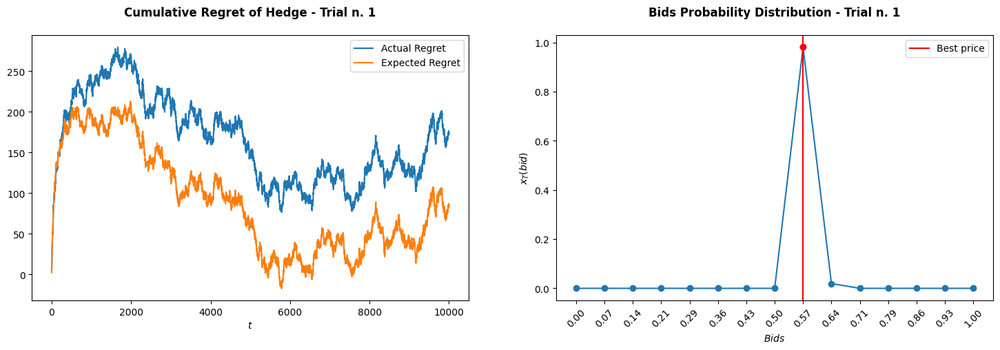

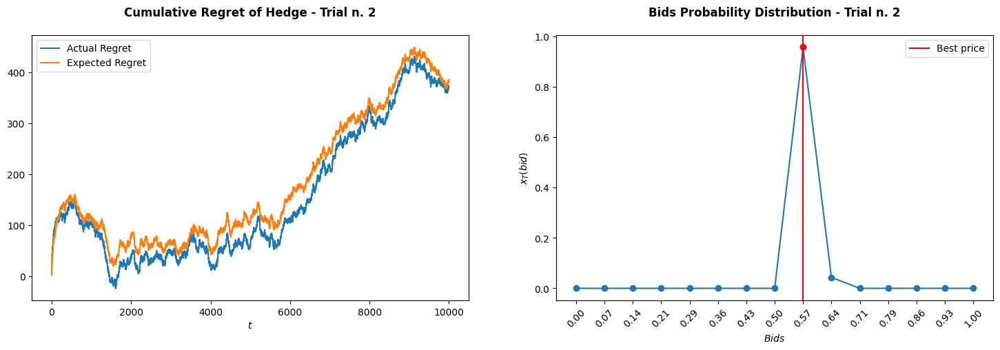

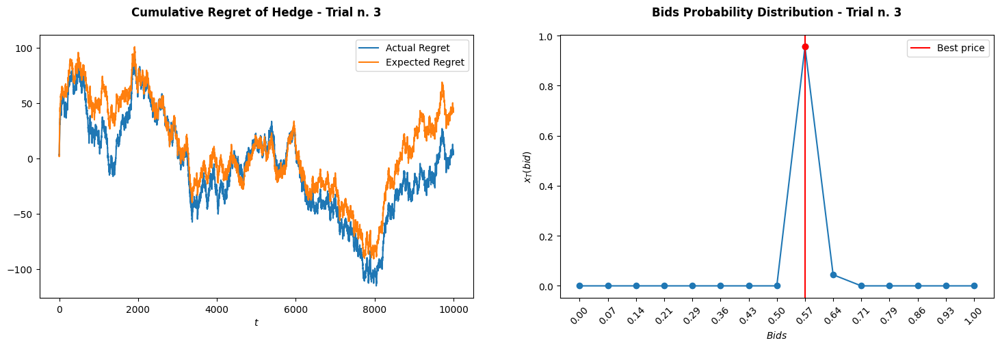

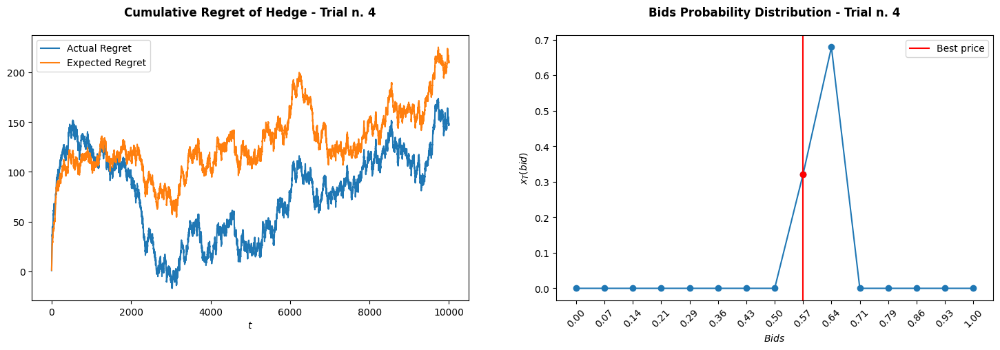

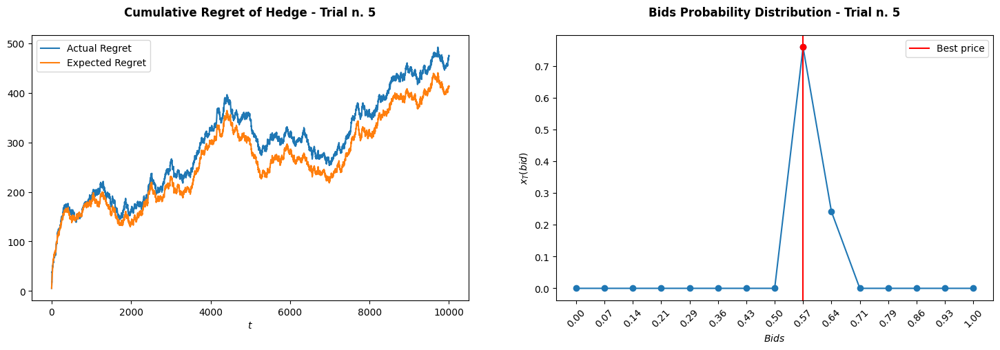

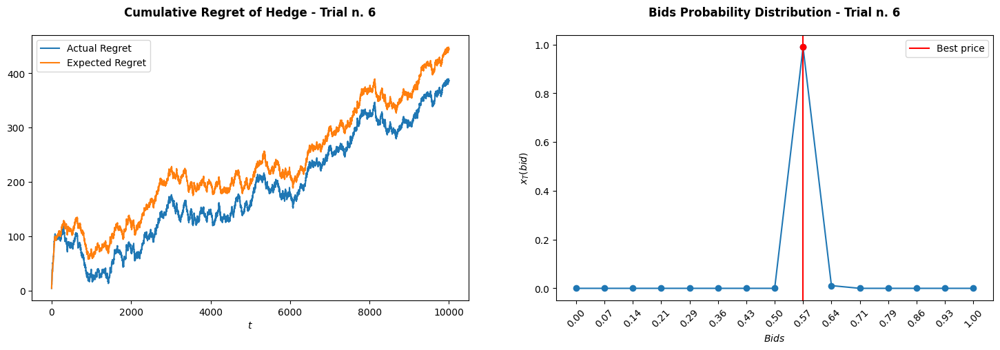

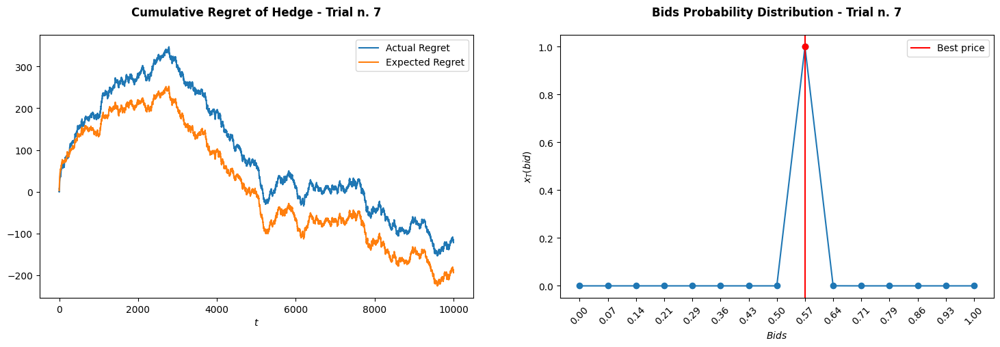

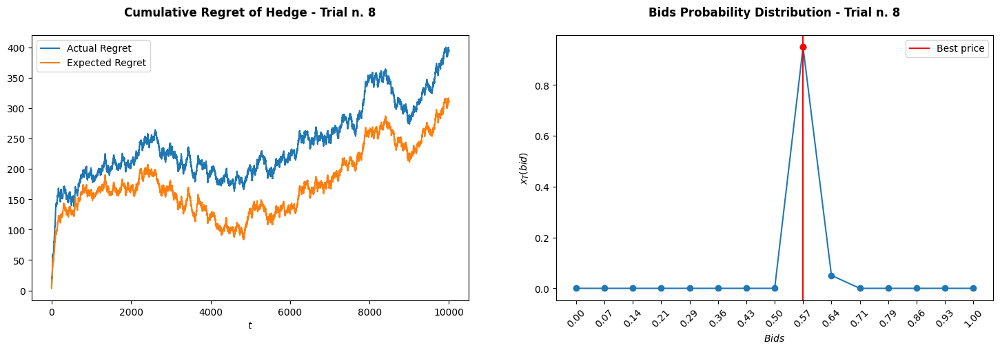

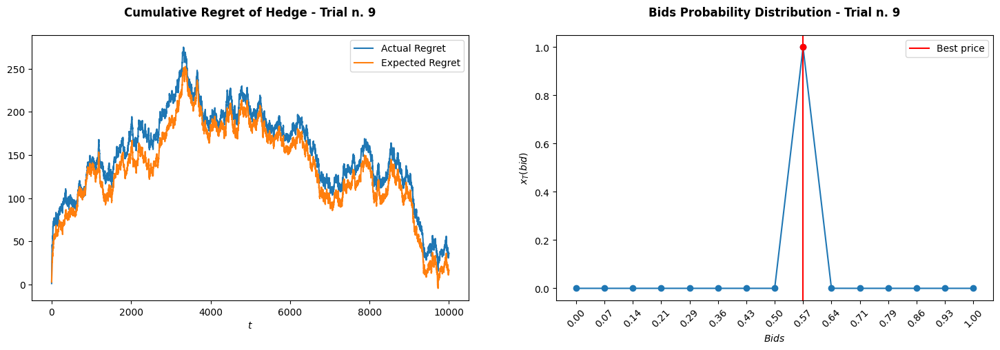

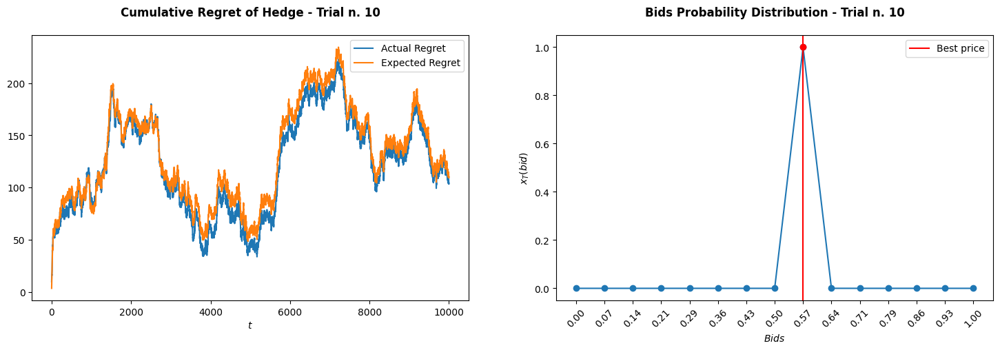

In [ ]:
nTrials = 10
K = 15
cost = 0.2
customers = 25
T = 10000
minPrice, maxPrice = 0, 1
prices = np.linspace(minPrice, maxPrice, K)
learningRate = np.sqrt(np.log(K) / T)

regrets = []
expectedRegrets = []
probabilityDistributions = []

for i, seed in enumerate(range(42, 42 + nTrials)):

  regret, expectedRegret, probabilityDistribution = executionHedge(K, cost, customers, T, prices, learningRate, seed, i)
  regrets.append(regret)
  expectedRegrets.append(expectedRegret)
  probabilityDistributions.append(probabilityDistribution)

Actual Total Regret (Trial n. 1): 174.77
Actual Total Regret (Trial n. 2): 373.60
Actual Total Regret (Trial n. 3): 4.74
Actual Total Regret (Trial n. 4): 147.74
Actual Total Regret (Trial n. 5): 475.34
Actual Total Regret (Trial n. 6): 386.57
Actual Total Regret (Trial n. 7): -121.87
Actual Total Regret (Trial n. 8): 392.76
Actual Total Regret (Trial n. 9): 35.84
Actual Total Regret (Trial n. 10): 103.43





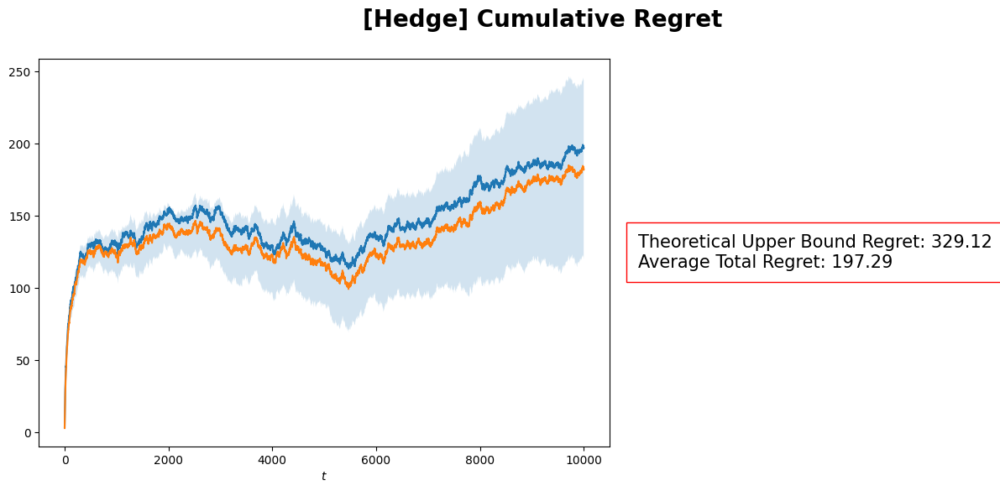

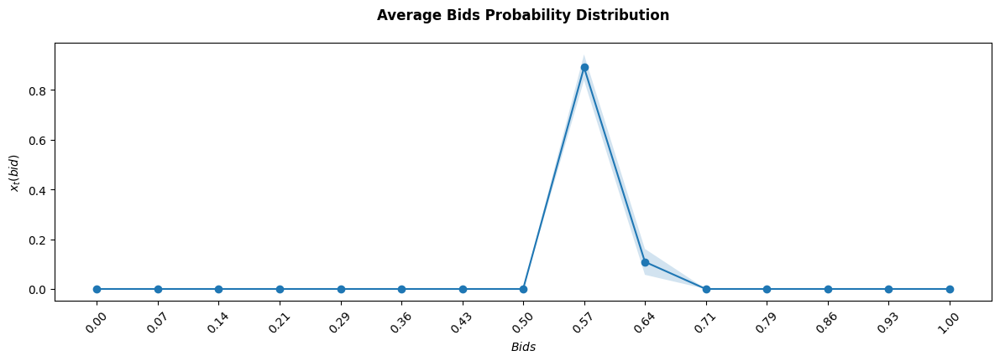

In [ ]:
regrets = np.array(regrets)
expectedRegrets = np.array(expectedRegrets)
probabilityDistributions = np.array(probabilityDistributions)

averageRegret = regrets.mean(axis = 0)
stdRegret = regrets.std(axis = 0)

averageExpectedRegret = expectedRegrets.mean(axis = 0)
stdExpectedRegret = expectedRegrets.std(axis = 0)

averageProbabilityDistributions = probabilityDistributions.mean(axis = 0)
stdProbabilityDistributions = probabilityDistributions.std(axis = 0)

upperBoundRegret = 2 * np.sqrt(T * np.log(K))
total = []

for i in range(len(regrets)):

  total.append(regrets[i][T - 1])
  print(f'Actual Total Regret (Trial n. {i + 1}): {regrets[i][T - 1]:.2f}')
print("\n\n")


fig, ax = plt.subplots(figsize = (16, 6))
fig.suptitle('[Hedge] Cumulative Regret', fontsize = 20, fontweight = 'bold')

# Cumulative Regret
plt.plot(np.arange(T), averageRegret, label = 'Actual Average Regret')
plt.plot(np.arange(T), averageExpectedRegret, label = 'Expected Average Regret')
plt.fill_between(np.arange(T), averageExpectedRegret - stdExpectedRegret / np.sqrt(nTrials), averageExpectedRegret + stdExpectedRegret / np.sqrt(nTrials), alpha = 0.2)
plt.xlabel('$t$')

# Theoretical considerations
note = f"Theoretical Upper Bound Regret: {upperBoundRegret:.2f}\nAverage Total Regret: {np.mean(total):.2f}"
plt.text(1.05, 0.5, note, transform = ax.transAxes, fontsize = 15, verticalalignment = 'center', horizontalalignment = 'left',
         bbox = dict(facecolor = 'white', pad = 10, edgecolor = 'red'))

plt.subplots_adjust(right = 0.55)
plt.show()

# Average Bids Probability Ditribution
fig, ax = plt.subplots(figsize = (14.41, 4))

ax.plot(range(K), averageProbabilityDistributions, marker='o')
plt.fill_between(np.arange(K), averageProbabilityDistributions - stdProbabilityDistributions / np.sqrt(K),
                 averageProbabilityDistributions + stdProbabilityDistributions / np.sqrt(K), alpha = 0.2)
ax.set_xticks(range(K))
ax.set_xticklabels([f'{price:.2f}' for price in prices])
ax.tick_params(axis = 'x', rotation = 45)
ax.set_xlabel('$Bids$')
ax.set_ylabel('$x_t(bid)$')
ax.set_title("Average Bids Probability Distribution", pad = 20, fontweight = 'bold')


plt.show()

### [EXP3] Execution and Performance Evaluation

In [ ]:
def executionEXP3(K, cost, customers, T, prices, learningRate, seed, i):

  np.random.seed(seed)

  env = BanditPricingEnvironment(buyingProbability = buyingProbability, cost = cost, prices = prices)
  agent = EXP3Agent(K, learningRate)


  rewards = []
  maxRewards = []
  agentLosses = []

  for t in range(T):

    # Computing elements for clairvoyant
    possibleRewards = [(price - cost) * np.random.binomial(customers, buyingProbability(price, t)) for price in prices]
    maxPossibleReward = max(possibleRewards)
    rewards.append(possibleRewards)
    maxRewards.append(maxPossibleReward)

    # Interaction Agent-Environment
    a_t = agent.pull_arm()
    price = prices[a_t]
    l_t = env.round(price, customers)
    agent.update(l_t)

    agentLosses.append(l_t)


  agentLosses = np.array(agentLosses)

  rewards = np.array(rewards)
  cumulativeRewards = np.sum(rewards, axis = 0)
  bestPriceIndex = np.argmax(cumulativeRewards)
  bestPrice = prices[bestPriceIndex]

  clairvoyantRewards = rewards[:, bestPriceIndex]
  clairvoyantLosses = np.array([maxReward - clairvoyantReward for maxReward, clairvoyantReward in zip(maxRewards, clairvoyantRewards)])

  cumulativeRegret = np.cumsum(agentLosses - clairvoyantLosses)


  fig, axs = plt.subplots(1, 2, figsize = (18, 5))
  plt.subplots_adjust(wspace = 0.2)

  # Plot 1: Cumulative Regret
  axs[0].plot(cumulativeRegret)
  axs[0].set_title(f"Cumulative Regret of EXP3 - Trial n. {i + 1}", pad = 20, fontweight = 'bold')
  axs[0].set_xlabel('$t$')

  # Plot 2: Number of pulls for each action
  axs[1].bar(range(K), agent.N_pulls)
  axs[1].axvline(bestPriceIndex, color = 'red', label = 'Best price')
  axs[1].set_xticks(range(K))
  axs[1].set_xticklabels([f'{price:.2f}' for price in prices])
  axs[1].tick_params(axis = 'x', rotation = 45)
  axs[1].set_xlabel('Actions')
  axs[1].set_ylabel('$N_T(a)$')
  axs[1].legend()
  axs[1].set_title(f"Number of pulls for each action - Trial n. {i + 1}", pad = 20, fontweight = 'bold')

  plt.show()


  return cumulativeRegret

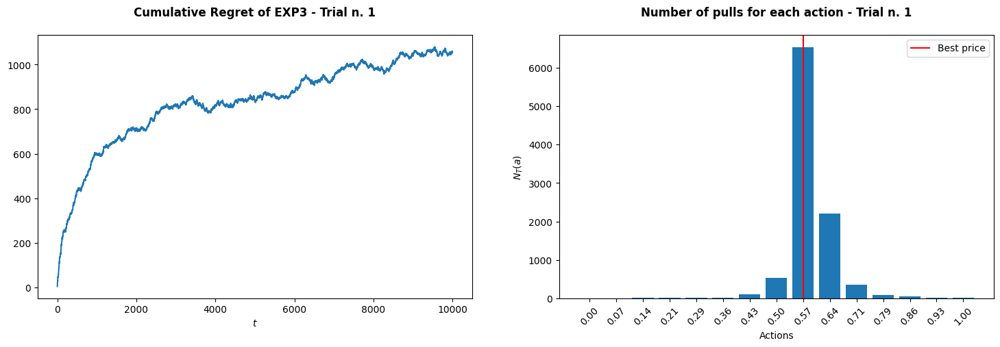

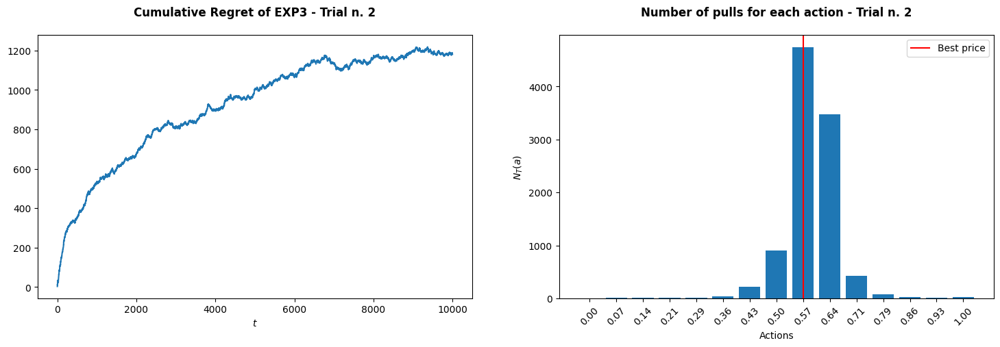

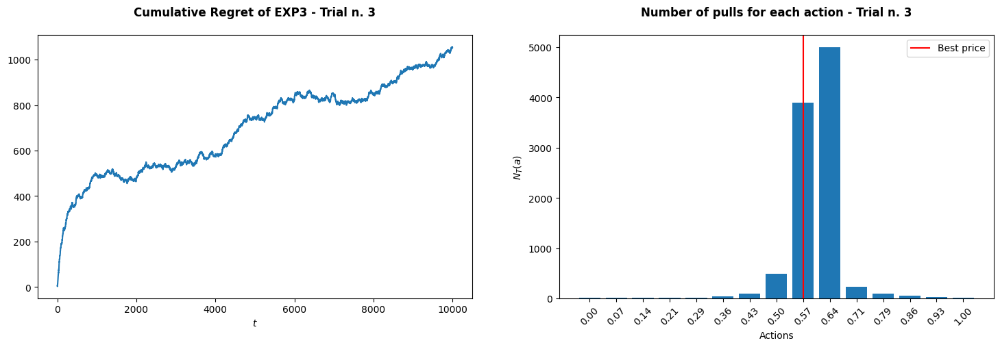

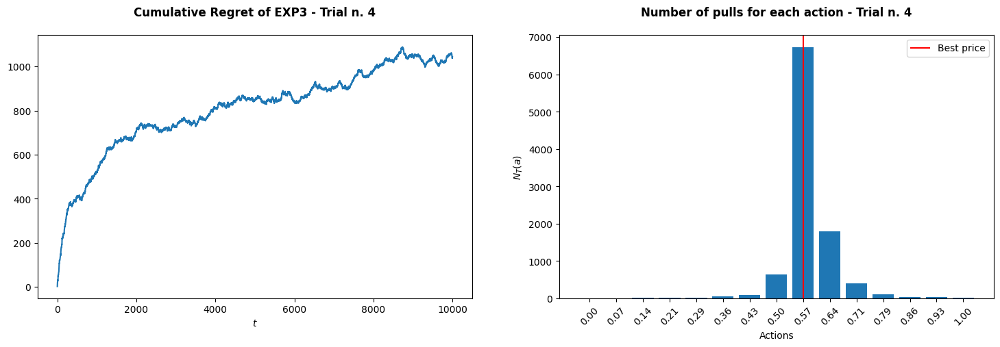

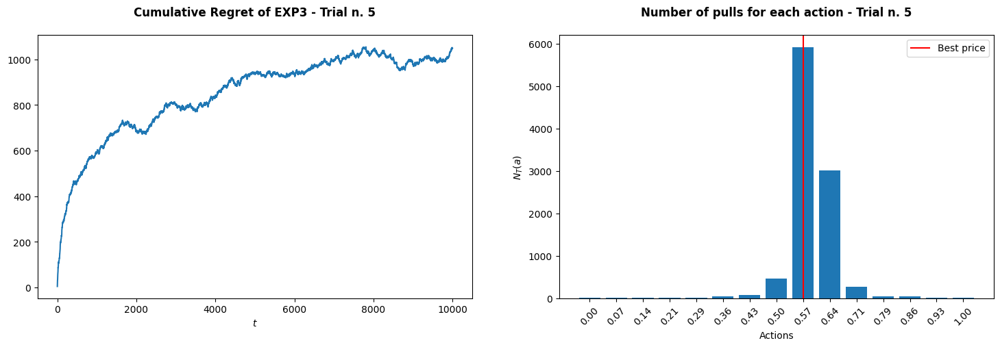

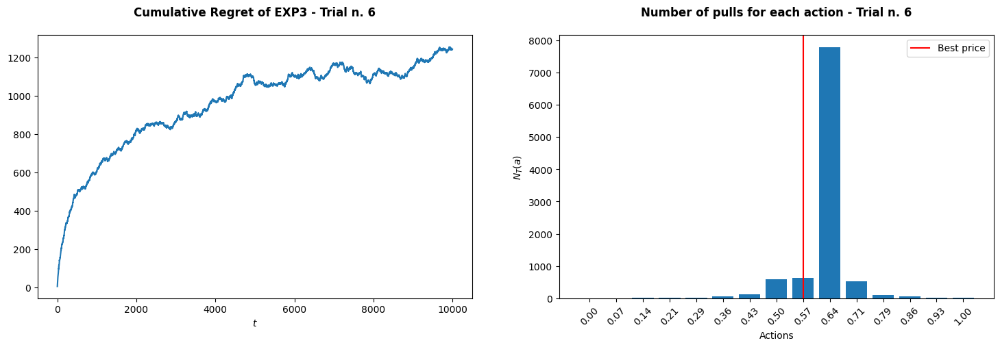

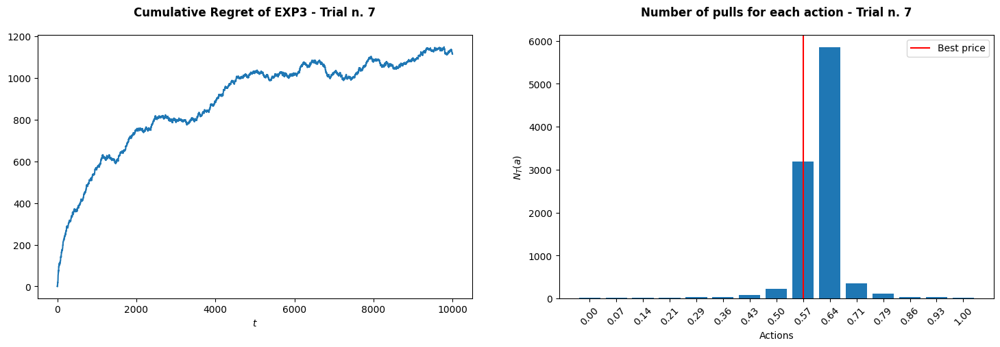

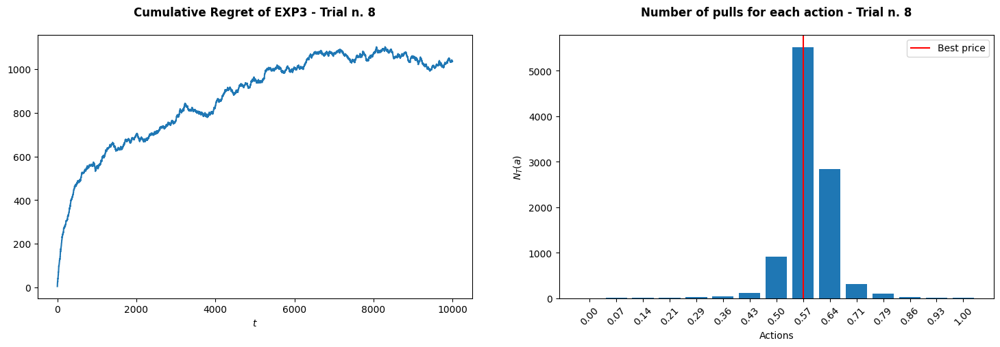

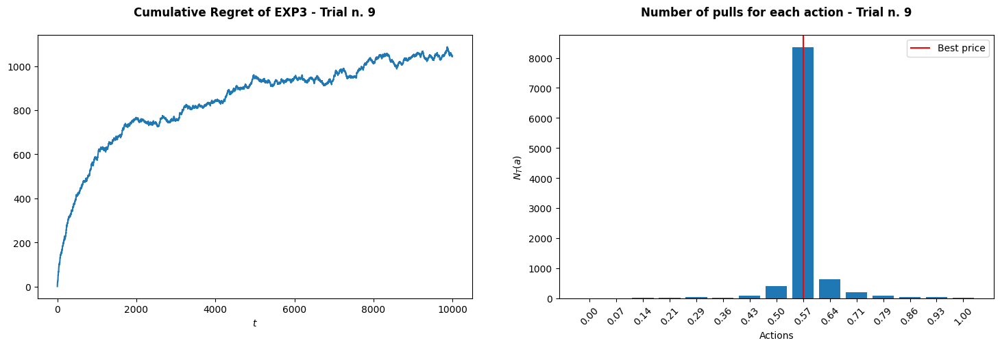

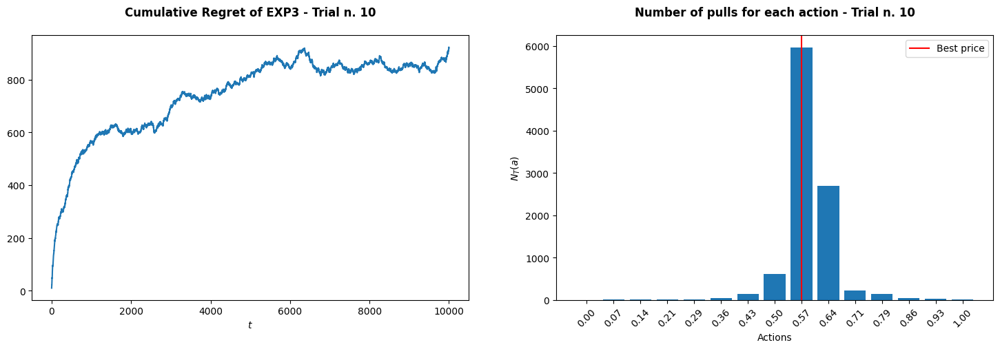

In [ ]:
nTrials = 10
K = 15
cost = 0.2
customers = 25
T = 10000
minPrice, maxPrice = 0, 1
prices = np.linspace(minPrice, maxPrice, K)
learningRate = np.sqrt(np.log(K) / (K * T))


regrets = []

for i, seed in enumerate(range(42, 42 + nTrials)):

  regrets.append(executionEXP3(K, cost, customers, T, prices, learningRate, seed, i))

Actual Total Regret (Trial n. 1): 1057.96
Actual Total Regret (Trial n. 2): 1180.67
Actual Total Regret (Trial n. 3): 1053.43
Actual Total Regret (Trial n. 4): 1044.21
Actual Total Regret (Trial n. 5): 1047.99
Actual Total Regret (Trial n. 6): 1241.79
Actual Total Regret (Trial n. 7): 1114.24
Actual Total Regret (Trial n. 8): 1034.87
Actual Total Regret (Trial n. 9): 1045.16
Actual Total Regret (Trial n. 10): 920.60





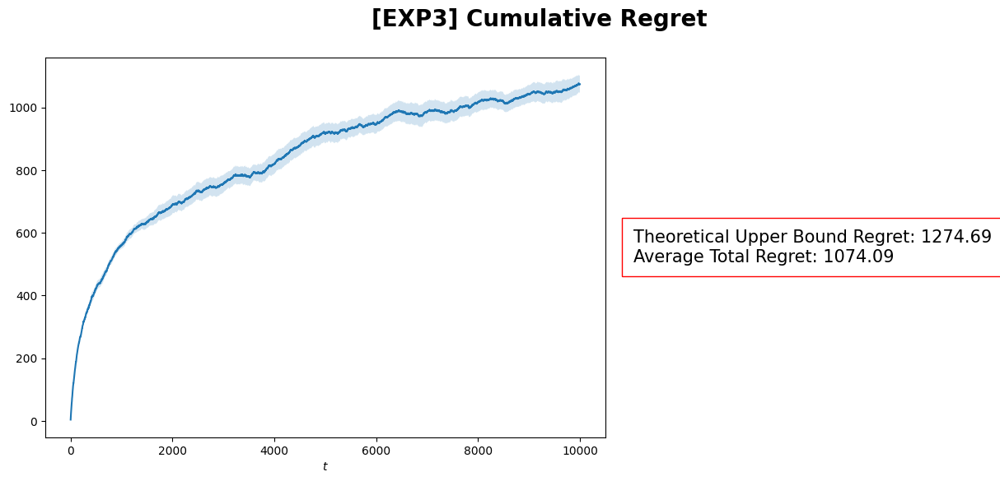

In [ ]:
regrets = np.array(regrets)

averageRegret = regrets.mean(axis = 0)
stdRegret = regrets.std(axis = 0)

upperBoundRegret = 2 * np.sqrt(T * K * np.log(K))
total = []

for i in range(len(regrets)):

  total.append(regrets[i][T - 1])
  print(f'Actual Total Regret (Trial n. {i + 1}): {regrets[i][T - 1]:.2f}')
print("\n\n")


fig, ax = plt.subplots(figsize = (16, 6))
fig.suptitle('[EXP3] Cumulative Regret', fontsize = 20, fontweight = 'bold')

# Cumulative Regret
plt.plot(np.arange(T), averageRegret)
plt.fill_between(np.arange(T), averageRegret - stdRegret / np.sqrt(nTrials), averageRegret + stdRegret / np.sqrt(nTrials), alpha = 0.2)
plt.xlabel('$t$')

# Theoretical considerations
note = f"Theoretical Upper Bound Regret: {upperBoundRegret:.2f}\nAverage Total Regret: {np.mean(total):.2f}"
plt.text(1.05, 0.5, note, transform = ax.transAxes, fontsize = 15, verticalalignment = 'center', horizontalalignment = 'left',
         bbox = dict(facecolor = 'white', pad = 10, edgecolor = 'red'))

plt.subplots_adjust(right = 0.55)
plt.show()

During the execution of the algorithm, it was observed that, despite maintaining a sub-linear behavior, the regret exceeded the theoretical upper bound:

$$
R_t \leq 2 \cdot \sqrt{T \cdot K \cdot \log(K) }
$$

Initially, it was thought that the algorithm assumed a slower convergence rate, necessitating greater exploration, and thus increasing T would solve the problem. However, this approach did not yield the desired results.

The most probable explanation for this behavior is the high variability in the buying probability of each user.

## Generalized First-Price Auction Problem

### Auction Definition

In [ ]:
class Auction:

    def __init__(self, *args, **kwargs):

      raise NotImplementedError


    def get_winners(self, bids):

      raise NotImplementedError


    def get_payments_per_click(self, winners, values, bids):

      raise NotImplementedError


    def round(self, bids):

      """

         Input:   - bids (i.e. full vector of bids from all the advertizers)

      """

      winners, values = self.get_winners(bids)
      payments_per_click = self.get_payments_per_click(winners, values, bids)


      return winners, payments_per_click

In [ ]:
class GeneralizedFirstPriceAuction(Auction):

    def __init__(self, ctrs, nSlots):

        self.ctrs = ctrs
        self.n_slots = nSlots


    def get_winners(self, bids):

        adv_values = self.ctrs * bids
        adv_ranking = np.argsort(adv_values)[::-1]
        winners = adv_ranking[:self.n_slots]                       # We can not have more winners than the # of available slots

        return winners, adv_values[winners]


    def get_payments_per_click(self, winners, values, bids):

        payments = bids[winners]

        return payments.round(2)

### Agent Definition

In [ ]:
class Agent:

  def __init__(self):

    raise NotImplementedError

  def pull_arm(self):

    raise NotImplementedError

  def update(self, r_t):

    raise NotImplementedError

In [ ]:
class EXP3Agent(Agent):

    def __init__(self, K, learning_rate):

      self.K = K
      self.learning_rate = learning_rate
      self.weights = np.ones(K)
      self.a_t = None
      self.x_t = np.ones(K)/K
      self.N_pulls = np.zeros(K)
      self.t = 0


    def pull_arm(self):

      """

        x_t = probability distribution over each arm
        a_t = chosen arm

      """

      self.x_t = self.weights / np.sum(self.weights)
      self.a_t = np.random.choice(np.arange(self.K), p = self.x_t)

      return self.a_t


    def update(self, l_t):

      """

        l_t_tilde = estimated loss for the chosen arm

      """

      l_t_tilde = l_t / self.x_t[self.a_t]
      self.weights[self.a_t] *= np.exp(-self.learning_rate * l_t_tilde)
      self.N_pulls[self.a_t] += 1
      self.t += 1

In [ ]:
class HedgeAgent(Agent):

    def __init__(self, K, learning_rate):

        self.K = K
        self.learning_rate = learning_rate
        self.weights = np.ones(K)
        self.x_t = np.ones(K)/K
        self.a_t = None
        self.t = 0


    def pull_arm(self):

        self.x_t = self.weights/sum(self.weights)
        self.a_t = np.random.choice(np.arange(self.K), p=self.x_t)
        return self.a_t


    def update(self, l_t):

        self.weights *= np.exp(-self.learning_rate*l_t)
        self.t += 1

### Bidding Strategy Definition

In [ ]:
class BiddingAgent:

  def __init__(self):

    raise NotImplementedError

  def bid(self):

    raise NotImplementedError

  def update(self):

    raise NotImplementedError

In [ ]:
class MultiplicativePacingAgentEXP3(BiddingAgent):

    def __init__(self, bids_set, valuation, budget, T, eta):

        self.bids_set = bids_set
        self.K = len(bids_set)
        self.exp3 = EXP3Agent(self.K, np.sqrt(np.log(self.K) / (self.K * T)))
        self.valuation = valuation
        self.budget = budget
        self.eta = eta
        self.T = T
        self.rho = self.budget / self.T
        self.lmbd = 1
        self.t = 0


    def bid(self):

        bid = self.bids_set[self.exp3.pull_arm()]

        if self.budget < bid:

            bid = self.budget

        return bid


    def update(self, f_t, c_t, m_t):

        # Update exp3
        L = f_t - self.lmbd * (c_t - self.rho)
        range_L = 2 + (1 - self.rho) / self.rho
        self.exp3.update((2 - L) / range_L)

        # Update lagrangian multiplier
        self.lmbd = np.clip(self.lmbd - self.eta * (self.rho - c_t), a_min = 0, a_max = 1 / self.rho)

        # Update budget
        self.budget -= c_t

In [ ]:
class MultiplicativePacingAgentHedge(BiddingAgent):

    def __init__(self, bids_set, valuation, budget, T, eta):

        self.bids_set = bids_set
        self.K = len(bids_set)
        self.hedge = HedgeAgent(self.K, np.sqrt(np.log(self.K) / (T)))
        self.valuation = valuation
        self.budget = budget
        self.eta = eta
        self.T = T
        self.rho = self.budget / self.T
        self.lmbd = 1
        self.t = 0


    def bid(self):

        bid = self.bids_set[self.hedge.pull_arm()]

        if self.budget < bid:

            bid = self.budget

        return bid


    def update(self, f_t, c_t, m_t):

        # Update hedge
        f_t_full = np.array([(self.valuation - b) * int(b >= m_t) for b in self.bids_set])
        c_t_full = np.array([b * int(b >= m_t) for b in self.bids_set])
        L = f_t_full - self.lmbd * (c_t_full - self.rho)
        range_L = 2 + (1 - self.rho) / self.rho
        self.hedge.update((2 - L) / range_L)

        # Update lagrangian multiplier
        self.lmbd = np.clip(self.lmbd - self.eta * (self.rho - c_t), a_min = 0, a_max = 1 / self.rho)

        # Update budget
        self.budget -= c_t

### Execution and Performance Evaluation

In [ ]:
# Define the Publisher's fixed parameters
nSlots = 2

# Define the Advertizers' parameters
nAdvertizers = 6
ctrs = np.ones(nAdvertizers + 1)
agentValue = 0.5
B = 1100

# Define Environment's parameters
nUsers = 10000
bids = np.linspace(0, 1, 12)
eta = 1 / np.sqrt(nUsers)

# Define competitors' parameters
competitorsBids = np.array([generateCompetingBids(t, nAdvertizers) for t in range(nUsers)])
m_t = competitorsBids.max(axis = 1)

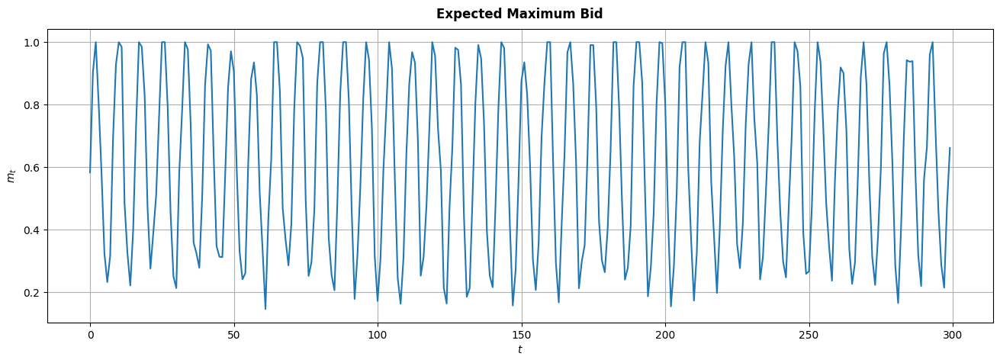

In [ ]:
plt.figure(figsize = (16, 5))
plt.plot(m_t[: 300])
plt.title('Expected Maximum Bid', pad = 10, fontweight = 'bold')
plt.xlabel('$t$')
plt.ylabel('$m_t$')
plt.show()

In [ ]:
# Solve the linear program to define the baseline
winProbabilities = np.array([sum(b > m_t) / nUsers for b in bids])
rho = rho = B / nUsers

c = -(agentValue - bids) * winProbabilities
A_ub = [bids * winProbabilities]
b_ub = [rho]
A_eq = [np.ones(len(bids))]
b_eq = [1]

res = optimize.linprog(c, A_ub = A_ub, b_ub = b_ub, A_eq = A_eq, b_eq = b_eq, bounds = (0, 1))
gamma = res.x

expectedClairvoyantUtilities = [-res.fun for u in range(nUsers)]
expectedClairvoyantBids = [sum(bids * gamma * winProbabilities) for u in range(nUsers)]

In [ ]:
def executionMultiplicativePacing(bids, agentValue, budget, nUsers, eta, ctrs, nSlots, i, seed, agentType, logging):

  np.random.seed(seed)

  try:

    if agentType == 'EXP3':
      agent = MultiplicativePacingAgentEXP3(bids_set = bids, valuation = agentValue, budget = budget, T = nUsers, eta = eta)

    elif agentType == 'Hedge':
      agent = MultiplicativePacingAgentHedge(bids_set = bids, valuation = agentValue, budget = budget, T = nUsers, eta = eta)

    else:
      raise ValueError(f"Agent Type '{agentType}' not found!")

  except ValueError as e:

    print(f"[ERROR] {e}")
    return -1

  auction = GeneralizedFirstPriceAuction(ctrs, nSlots)

  utilities = np.array([])
  agentBids = np.array([])
  agentPayments = np.array([])
  totalWins = 0

  for u in range(nUsers):

    f_t, c_t = 0, 0

    # Agent - Auction Interaction
    agentBid = agent.bid()
    bids_t = np.append(agentBid, competitorsBids[u])
    winners, payments_per_click = auction.round(bids = bids_t)

    if 0 in winners:

      f_t = agentValue - m_t[u]
      c_t = m_t[u]
      totalWins += 1

    agent.update(f_t, c_t, m_t[u])

    # Logging
    utilities = np.append(utilities, f_t)
    agentBids = np.append(agentBids, agentBid)
    agentPayments = np.append(agentPayments, c_t)

  # Compute data to return
  bidCounts = Counter(agentBids)
  bidsUnique = list(bidCounts.keys())
  counts = list(bidCounts.values())

  cumulativePayments = np.cumsum(agentPayments)
  cumulativeRegret = np.cumsum(expectedClairvoyantUtilities - utilities)

  if logging:

    print('--------------------------------------------------------------')
    print(f"Total Number of won auctions (Trial n. {i + 1}): {totalWins}")
    print('--------------------------------------------------------------')

    fig = plt.figure(figsize = (16, 12))
    gs = fig.add_gridspec(2, 2, height_ratios = [1, 1.4])

    # Chosen Bids
    ax1 = fig.add_subplot(gs[0, :])
    ax1.bar(bidsUnique, counts, width = 0.04, color = 'green')
    ax1.set_xlabel('$b_t$')
    ax1.set_ylabel('$N_b$')
    ax1.set_xticks(bidsUnique)
    ax1.set_xticklabels([f'{bid:.2f}' for bid in bidsUnique], rotation = 45)
    ax1.set_title('Chosen Bids', pad = 10, fontweight = 'bold')

    # Cumulative Payments
    ax2 = fig.add_subplot(gs[1, 0])
    ax2.plot(cumulativePayments)
    ax2.set_xlabel('$t$')
    ax2.set_ylabel('$\sum c_t$')
    ax2.axhline(y = B, color = 'red', label = 'Budget')
    ax2.legend()
    ax2.set_title('Cumulative Payments', pad = 15, fontweight = 'bold')

    # Cumulative Regret
    ax3 = fig.add_subplot(gs[1, 1])
    ax3.plot(cumulativeRegret)
    ax3.set_xlabel('$t$')
    ax3.set_ylabel('$\sum R_t$')
    ax3.set_title('Cumulative Regret', pad = 15, fontweight = 'bold')

    fig.suptitle(f'Trial n. {i + 1}', fontsize = 32, fontweight = 'bold')
    plt.subplots_adjust(wspace = 0.2, hspace = 0.4, top = 0.89)
    plt.show()


  return cumulativeRegret, cumulativePayments, bidCounts, totalWins

In a full-feedback scenario, we are provided with knowledge of the maximum bid that won the auction after each auction: thus, given this information, Hedge is the more appropriate choice as regret minimizer. However, for the sake of curiosity, we can compare the performance of Hedge and traditional EXP3 in the same setting, even though EXP3 is typically used in scenarios where we do not have a full-feedback (in theory we should use EXP3.P, assuming to ignore the value $m_t$).

#### [Hedge] Simulation

--------------------------------------------------------------
Total Number of won auctions (Trial n. 1): 1940
--------------------------------------------------------------


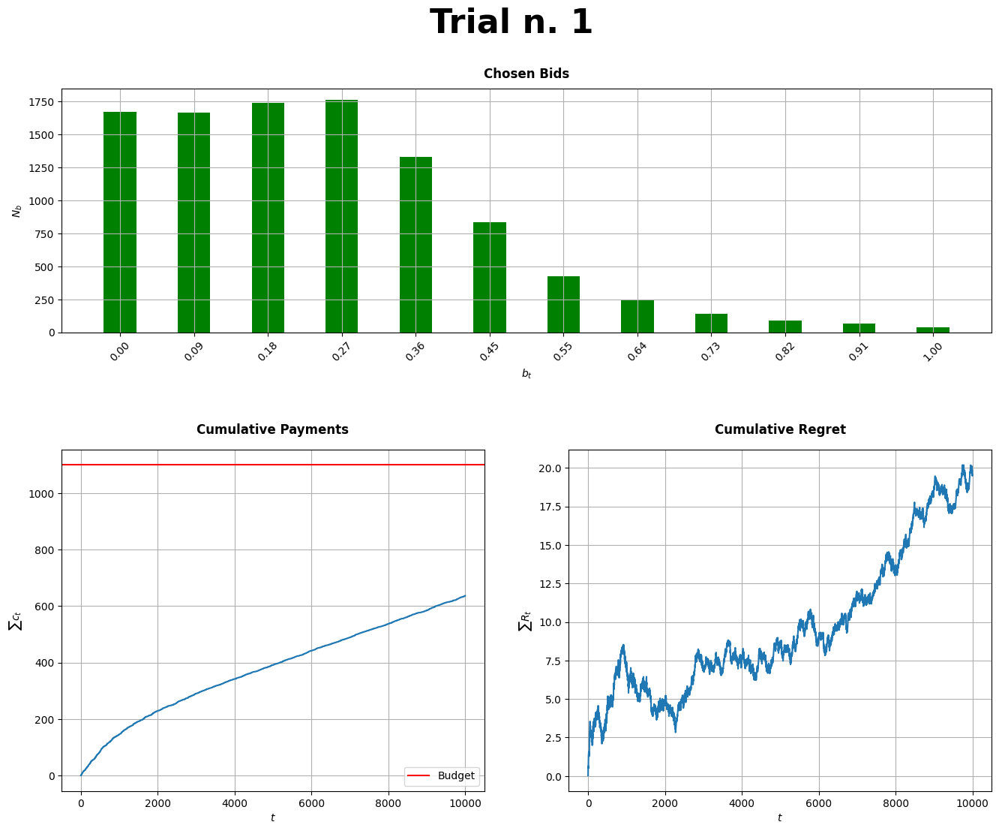

--------------------------------------------------------------
Total Number of won auctions (Trial n. 2): 2030
--------------------------------------------------------------


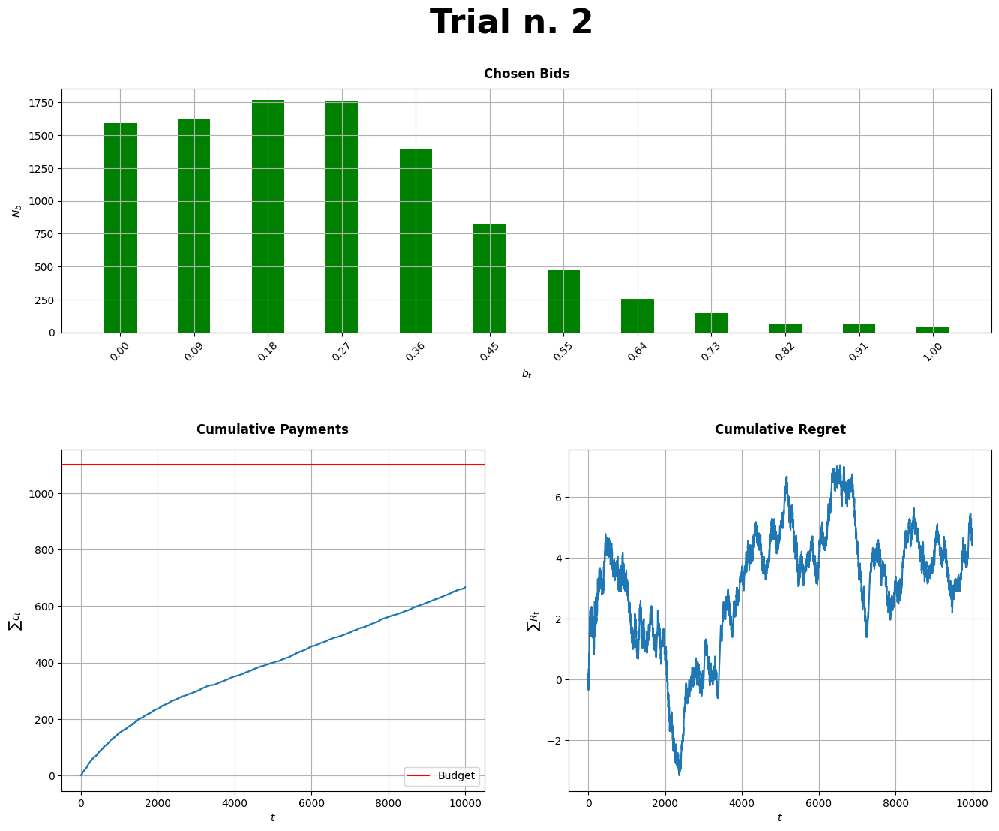

--------------------------------------------------------------
Total Number of won auctions (Trial n. 3): 2031
--------------------------------------------------------------


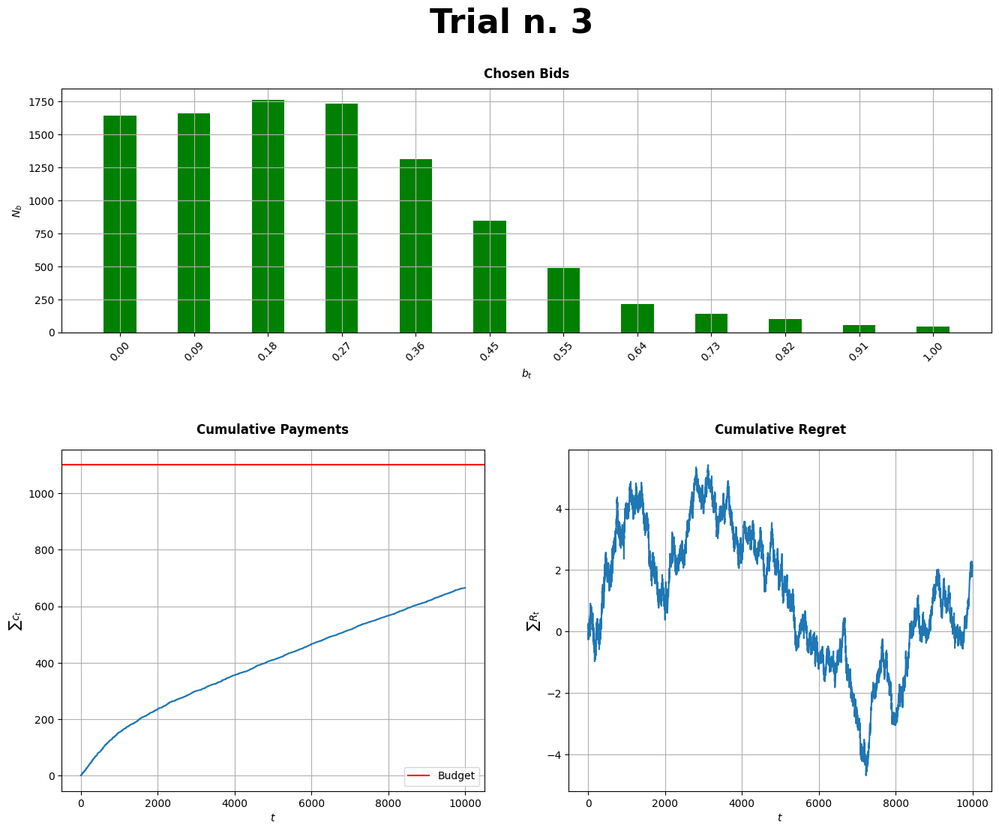

--------------------------------------------------------------
Total Number of won auctions (Trial n. 4): 1984
--------------------------------------------------------------


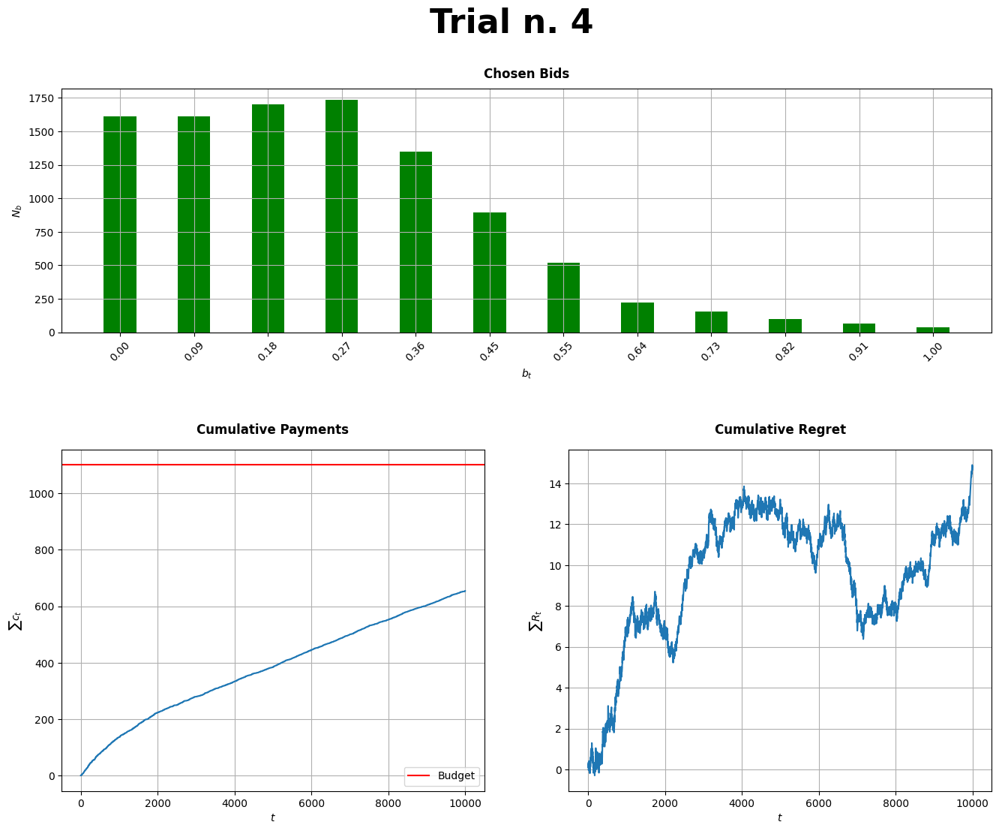

--------------------------------------------------------------
Total Number of won auctions (Trial n. 5): 2020
--------------------------------------------------------------


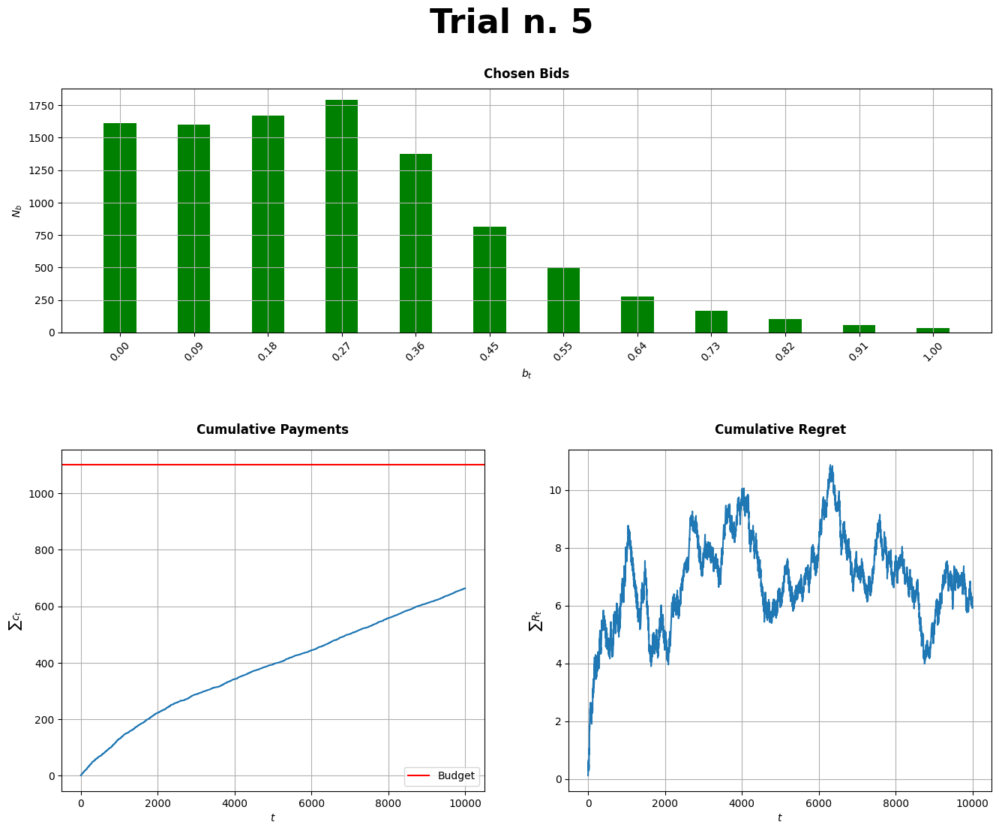

--------------------------------------------------------------
Total Number of won auctions (Trial n. 6): 1940
--------------------------------------------------------------


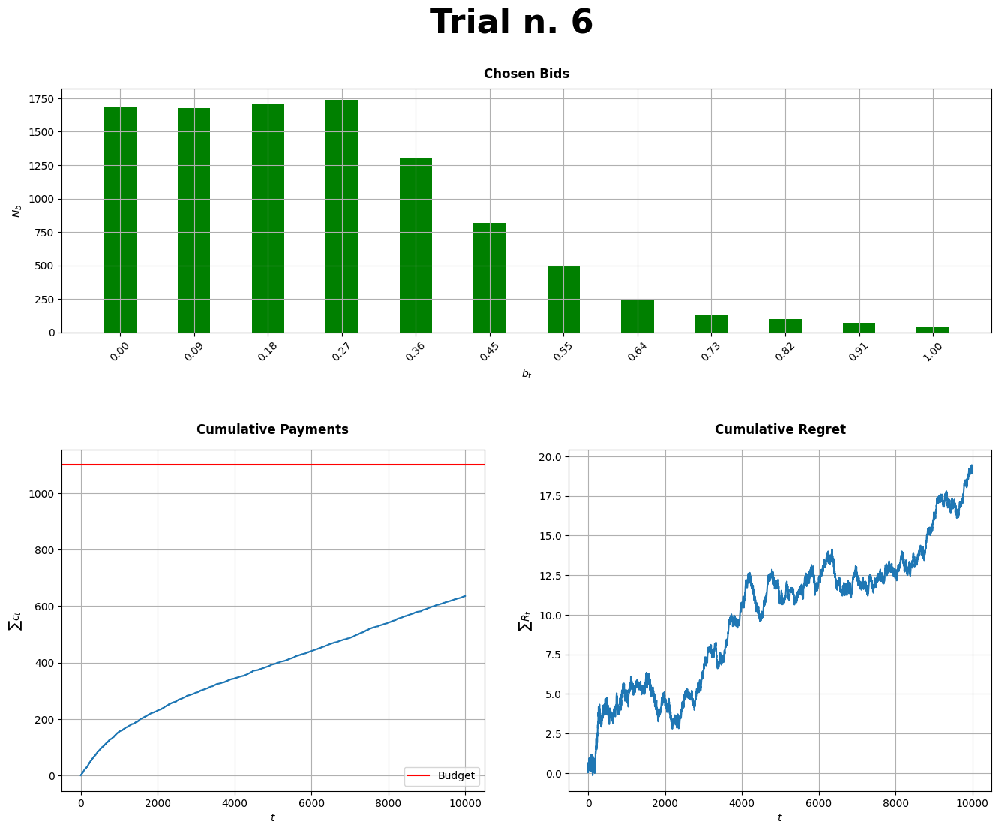

--------------------------------------------------------------
Total Number of won auctions (Trial n. 7): 2002
--------------------------------------------------------------


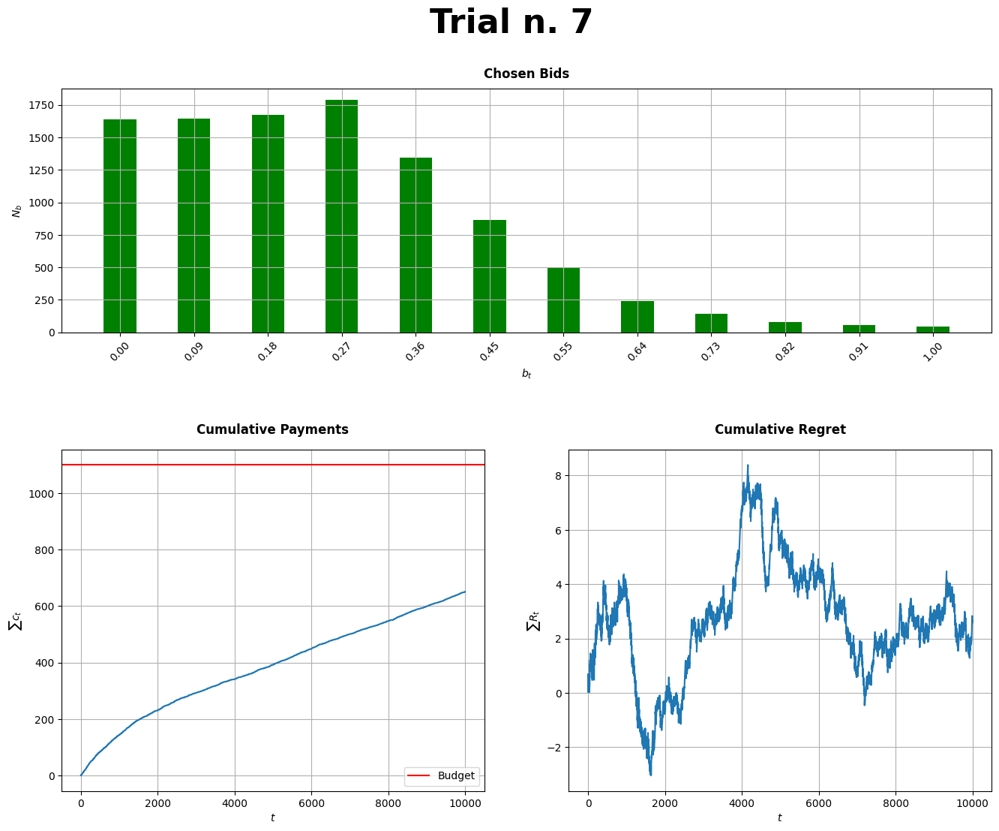

--------------------------------------------------------------
Total Number of won auctions (Trial n. 8): 1993
--------------------------------------------------------------


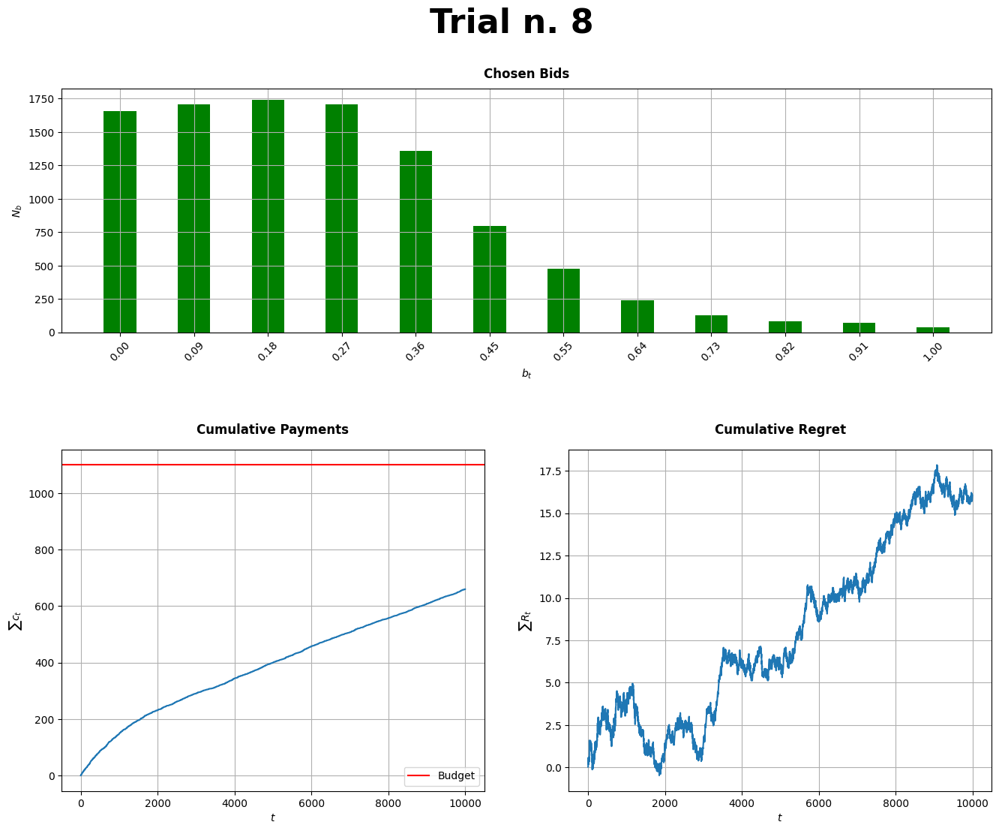

--------------------------------------------------------------
Total Number of won auctions (Trial n. 9): 2046
--------------------------------------------------------------


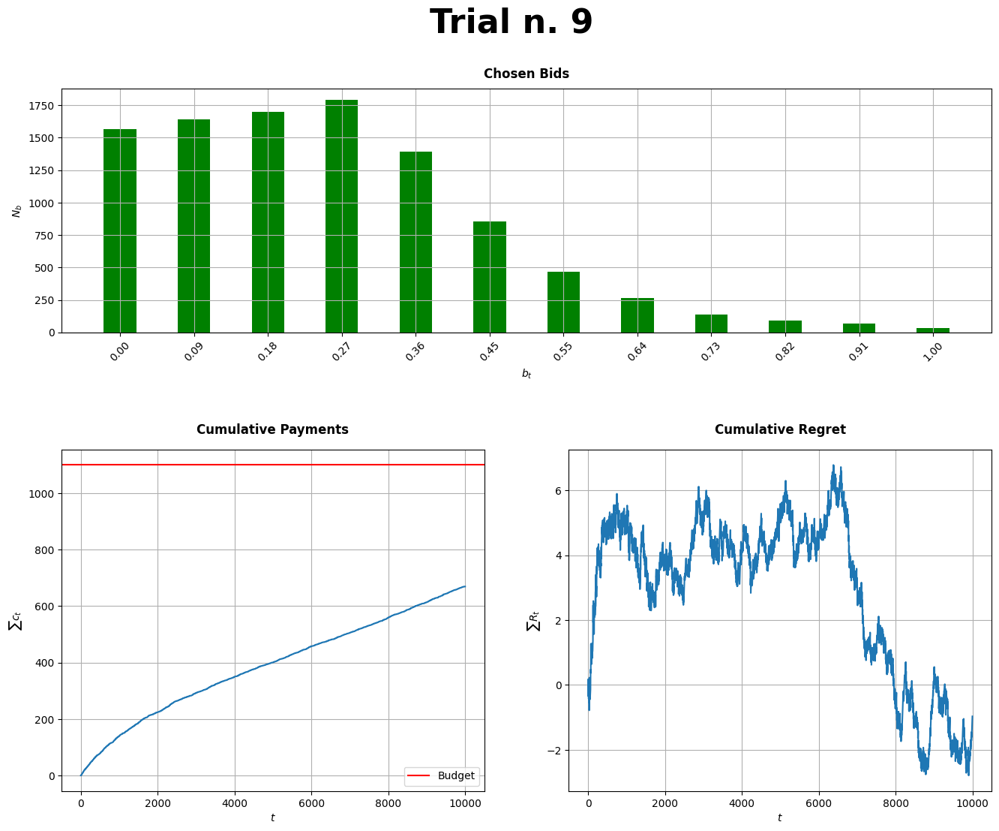

--------------------------------------------------------------
Total Number of won auctions (Trial n. 10): 1989
--------------------------------------------------------------


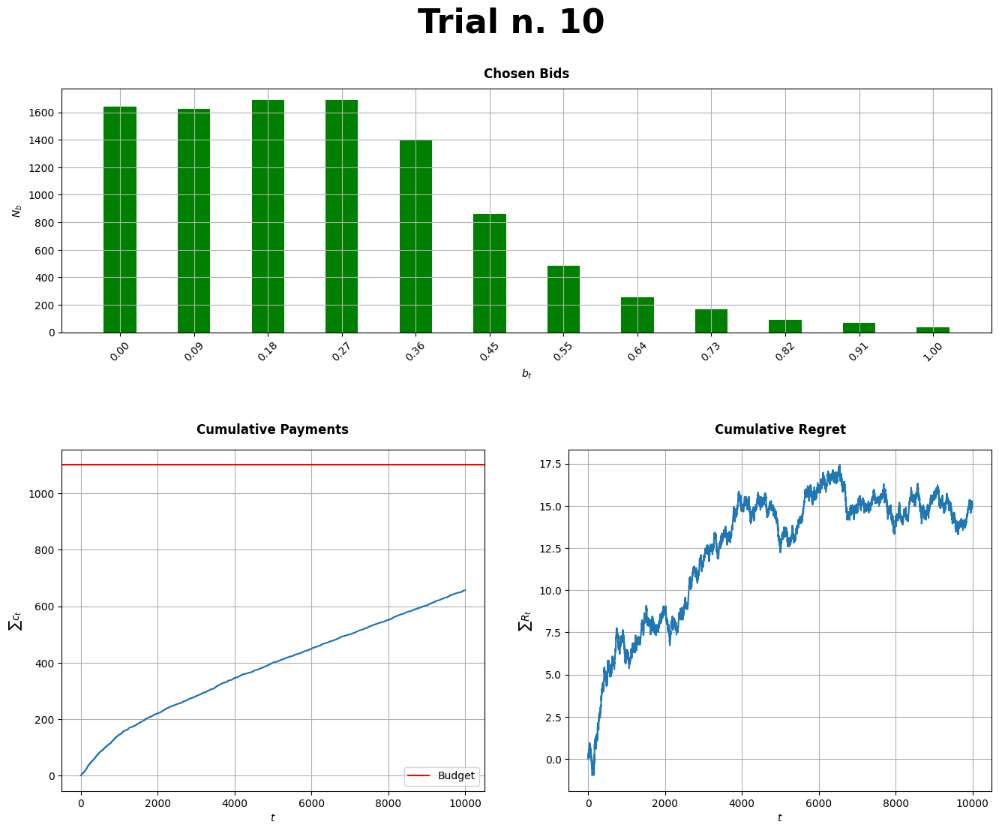

In [ ]:
nTrials = 10
cumulativeRegrets = []
cumulativePayments = []
chosenBids = []
totalWins = []


for i, seed in enumerate(range(42, 42 + nTrials)):

  regret, payments, actualBids, wins = executionMultiplicativePacing(bids, agentValue, B, nUsers, eta, ctrs, nSlots, i, seed, 'Hedge', True)

  cumulativeRegrets.append(regret)
  cumulativePayments.append(payments)
  chosenBids.append(actualBids)
  totalWins.append(wins)

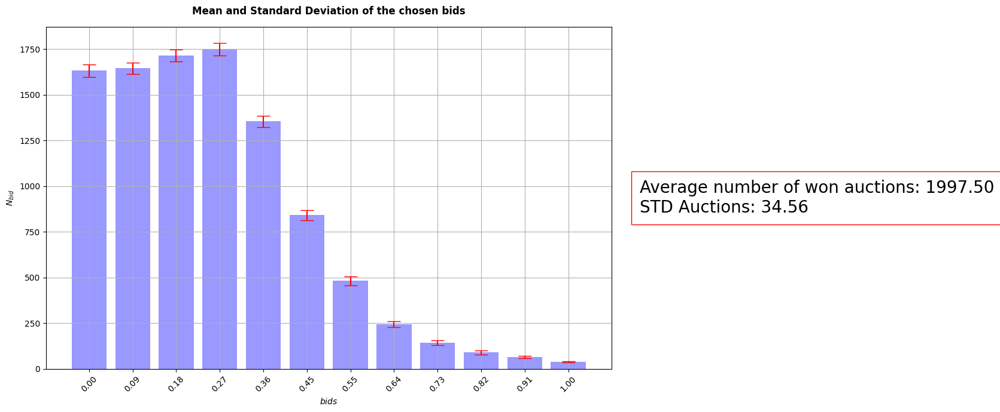

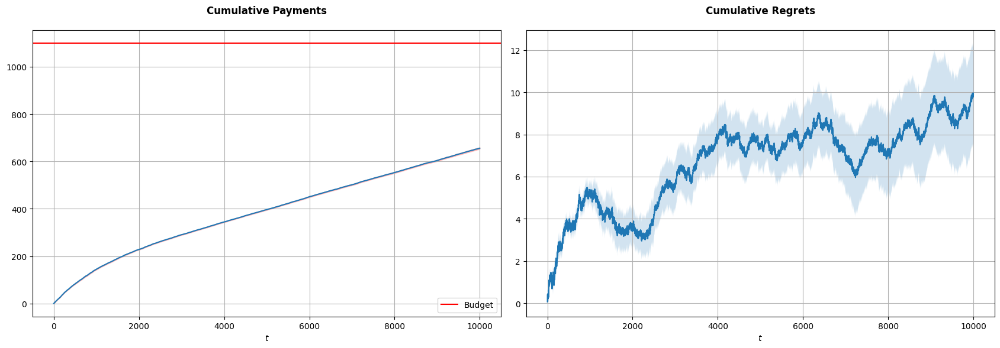

In [ ]:
# Compute statistics about chosen bids
valuesPerBids = {bid: [] for bid in bids}
stats = {}

for counter in chosenBids:

    for bid in bids:

        valuesPerBids[bid].append(counter[bid])


for bid, values in valuesPerBids.items():

    mean = np.mean(values)
    std = np.std(values)
    stats[bid] = {'mean': mean, 'std': std}

means = [stats[bid]['mean'] for bid in bids]
stds = [stats[bid]['std'] for bid in bids]
xPos = np.arange(len(bids))

# Compute statistics about total wins
totalWins = np.array(totalWins)
meanWins = np.mean(totalWins)
stdWins = np.std(totalWins)

# Compute statistics about cumulative payments
cumulativePayments = np.array(cumulativePayments)
meanPayments = cumulativePayments.mean(axis = 0)
stdPayments = cumulativePayments.std(axis = 0)

# Compute statistics about cumulative regrets
cumulativeRegrets = np.array(cumulativeRegrets)
meanRegrets = cumulativeRegrets.mean(axis = 0)
stdRegrets = cumulativeRegrets.std(axis = 0)


# Chosen Bids
fig, ax = plt.subplots(figsize = (17, 7))

bars = ax.bar(xPos, means, yerr = stds, align = 'center', alpha = 0.4, ecolor = 'red', capsize = 8, color = 'blue')
ax.set_xlabel('$bids$')
ax.set_ylabel('$N_{bid}$')
ax.set_xticks(xPos)
ax.set_xticklabels([f'{bid:.2f}' for bid in bids], rotation = 45)
ax.set_title('Mean and Standard Deviation of the chosen bids', pad = 15, fontweight = 'bold')

# Total Wins
note = f"Average number of won auctions: {meanWins:.2f}\nSTD Auctions: {stdWins:.2f}"
plt.text(1.05, 0.5, note, transform = ax.transAxes, fontsize = 20, verticalalignment = 'center', horizontalalignment = 'left',
         bbox = dict(facecolor = 'white', pad = 10, edgecolor = 'red'))

plt.tight_layout()
plt.show()


plt.figure(figsize = (17, 6))

# Cumulative Payments
plt.subplot(1, 2, 1)
plt.plot(np.arange(nUsers), meanPayments)
plt.title('Cumulative Payments', pad = 20, fontweight = 'bold')
plt.fill_between(np.arange(nUsers), meanPayments - stdPayments / np.sqrt(nTrials), meanPayments + stdPayments / np.sqrt(nTrials),
                 color = 'red', alpha = 0.2)
plt.axhline(y = B, color = 'red', label = 'Budget')
plt.legend()
plt.xlabel('$t$')

# Cumulative Regrets
plt.subplot(1, 2, 2)
plt.plot(np.arange(nUsers), meanRegrets)
plt.title('Cumulative Regrets', pad = 20, fontweight = 'bold')
plt.fill_between(np.arange(nUsers), meanRegrets - stdRegrets / np.sqrt(nTrials), meanRegrets + stdRegrets / np.sqrt(nTrials), alpha = 0.2)
plt.xlabel('$t$')

plt.tight_layout()
plt.show()

#### [EXP3] Simulation

--------------------------------------------------------------
Total Number of won auctions (Trial n. 1): 2819
--------------------------------------------------------------


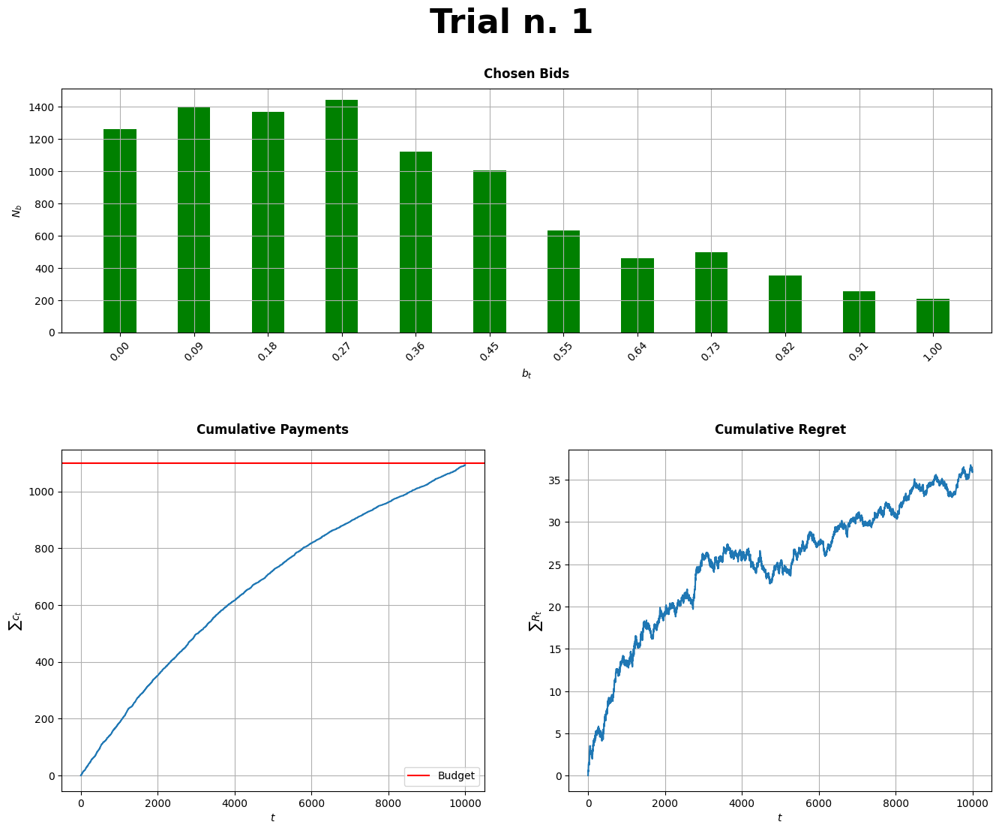

--------------------------------------------------------------
Total Number of won auctions (Trial n. 2): 2627
--------------------------------------------------------------


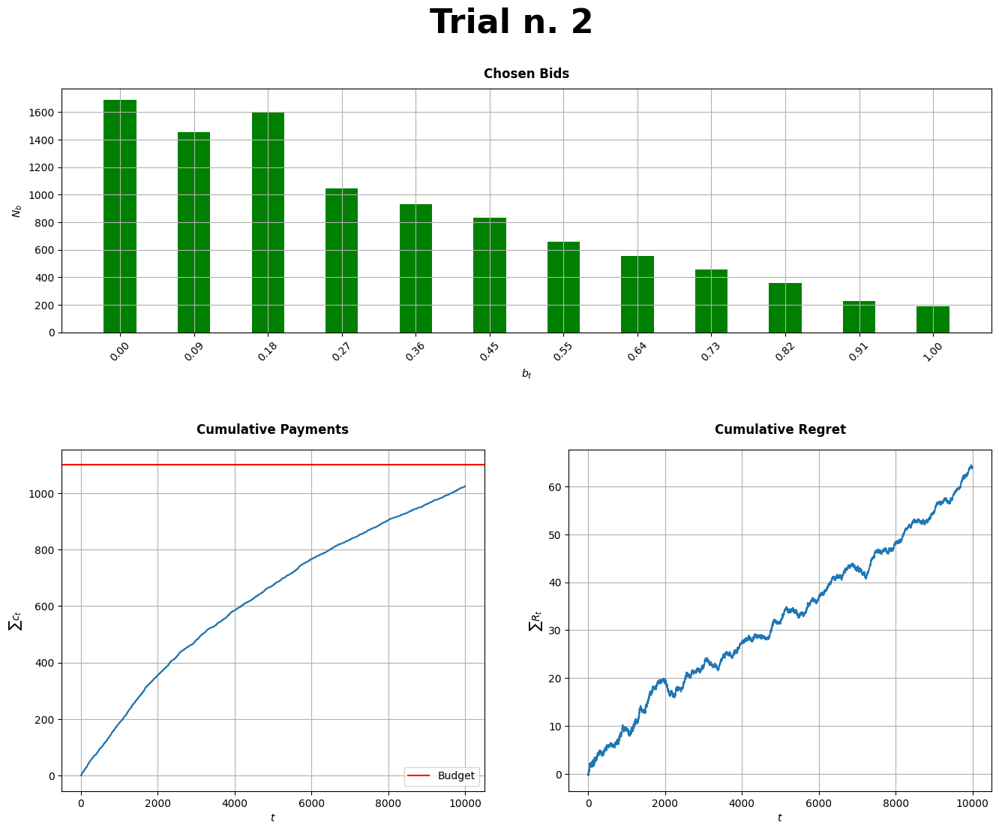

--------------------------------------------------------------
Total Number of won auctions (Trial n. 3): 2717
--------------------------------------------------------------


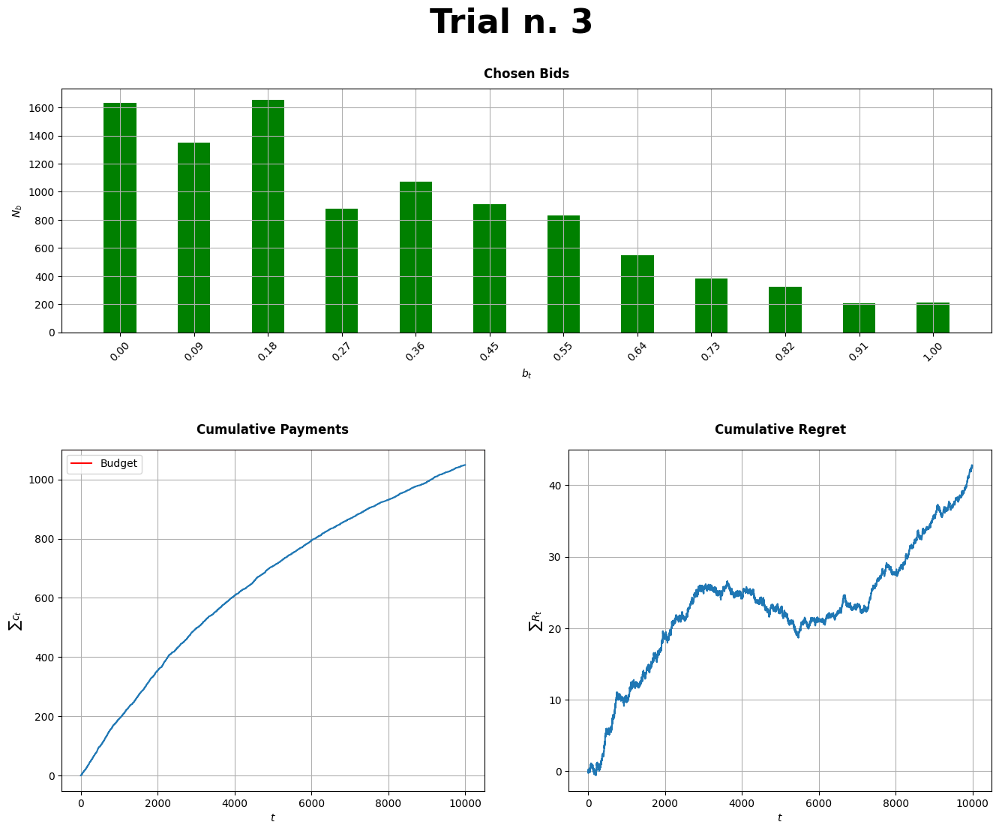

--------------------------------------------------------------
Total Number of won auctions (Trial n. 4): 2726
--------------------------------------------------------------


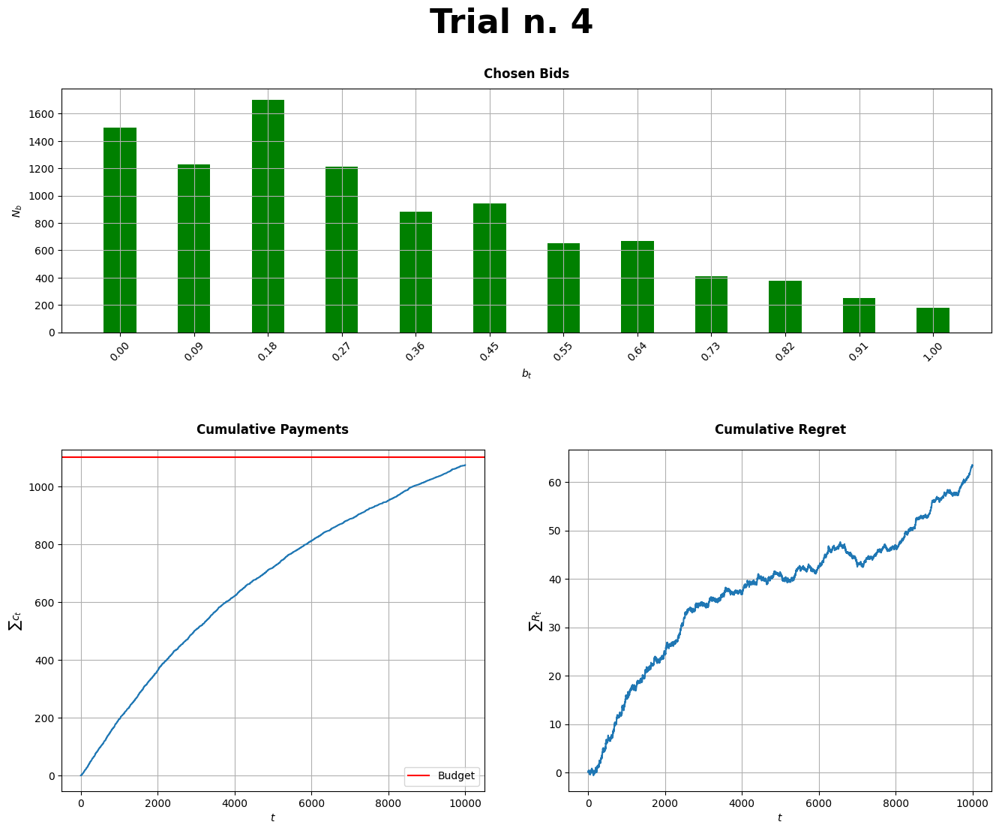

--------------------------------------------------------------
Total Number of won auctions (Trial n. 5): 2777
--------------------------------------------------------------


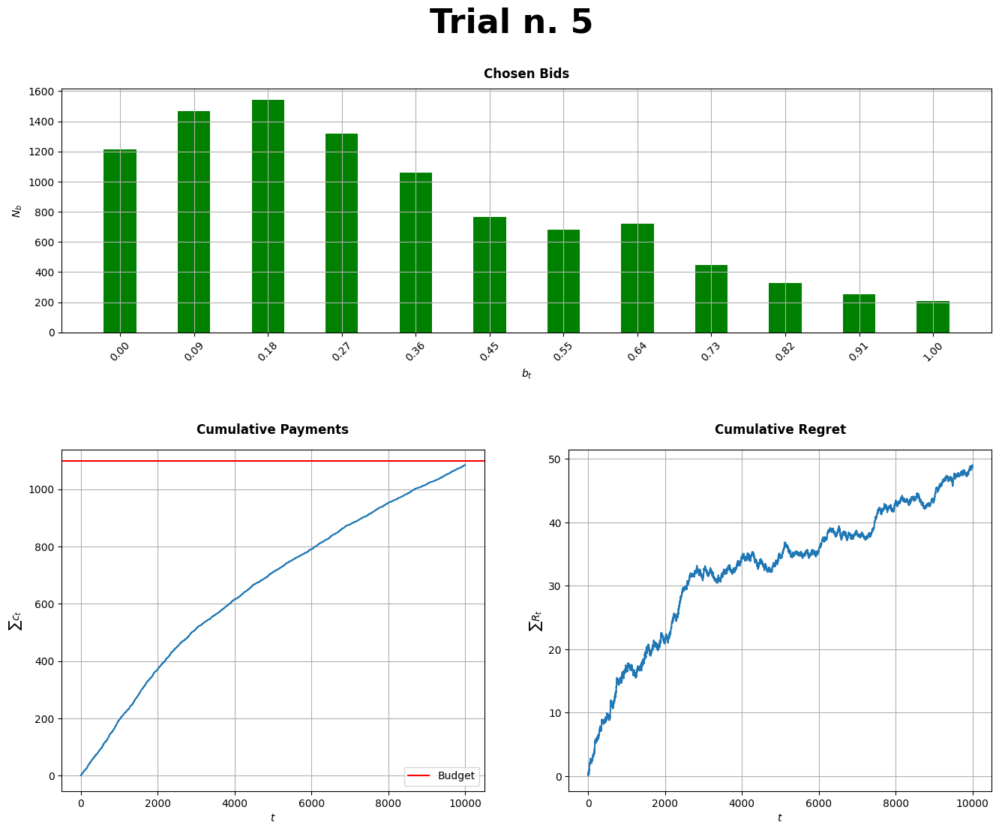

--------------------------------------------------------------
Total Number of won auctions (Trial n. 6): 2742
--------------------------------------------------------------


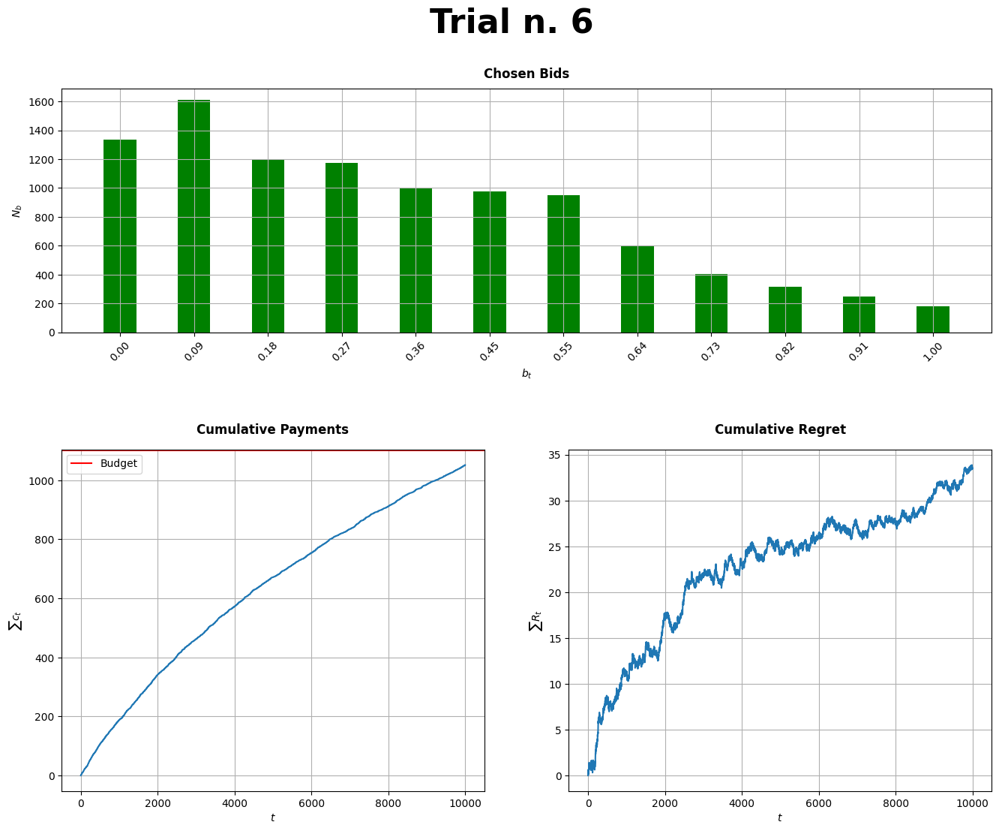

--------------------------------------------------------------
Total Number of won auctions (Trial n. 7): 2718
--------------------------------------------------------------


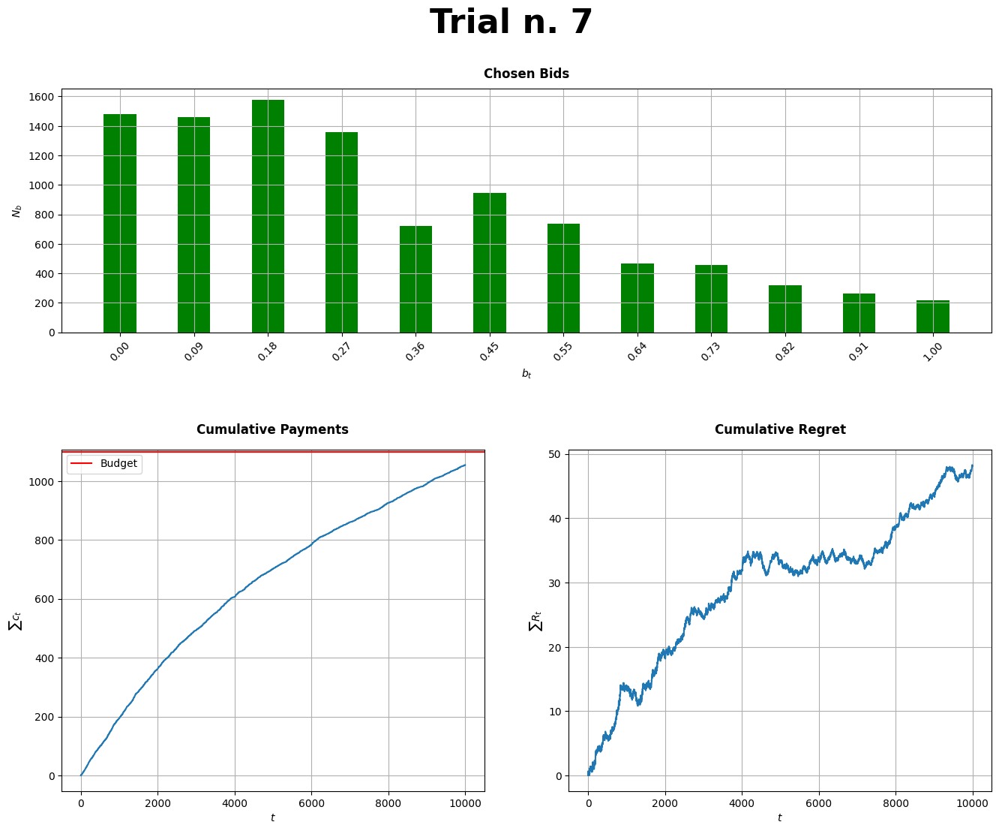

--------------------------------------------------------------
Total Number of won auctions (Trial n. 8): 2827
--------------------------------------------------------------


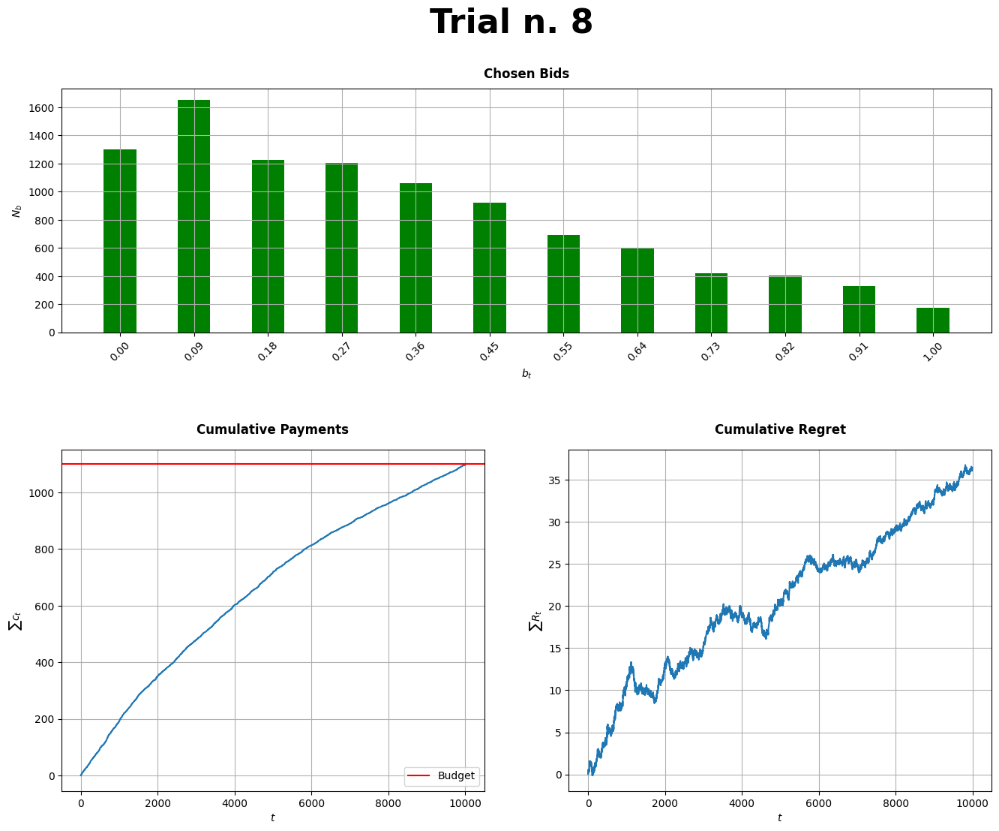

--------------------------------------------------------------
Total Number of won auctions (Trial n. 9): 2677
--------------------------------------------------------------


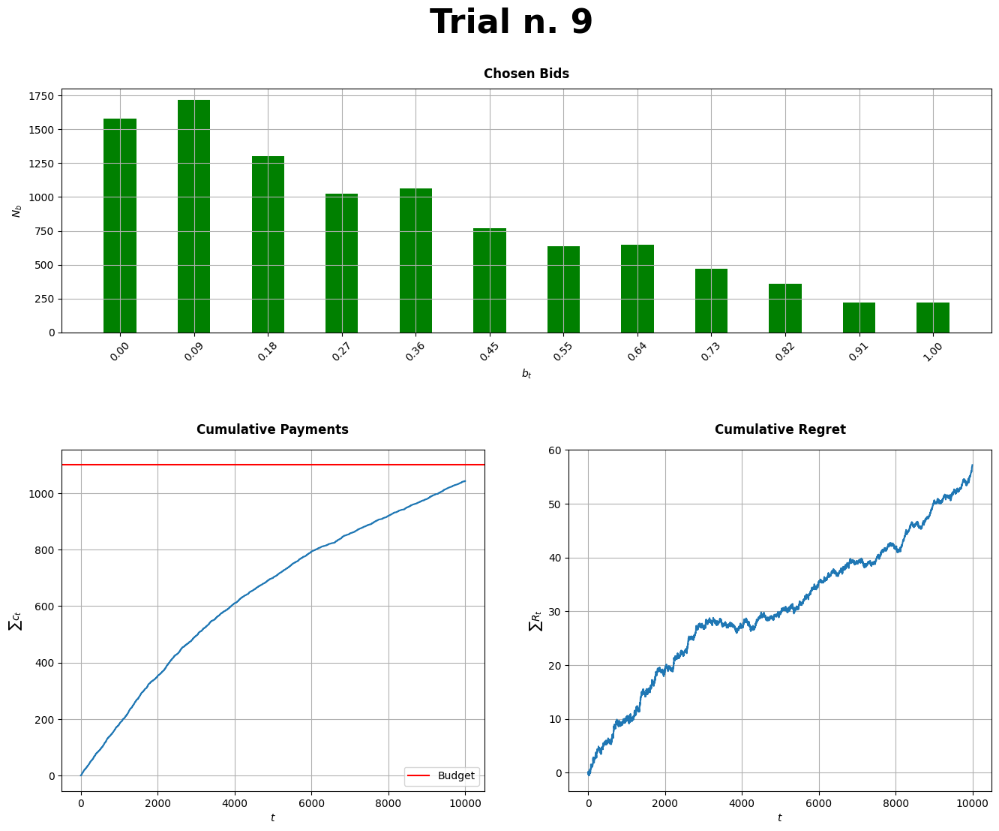

--------------------------------------------------------------
Total Number of won auctions (Trial n. 10): 2771
--------------------------------------------------------------


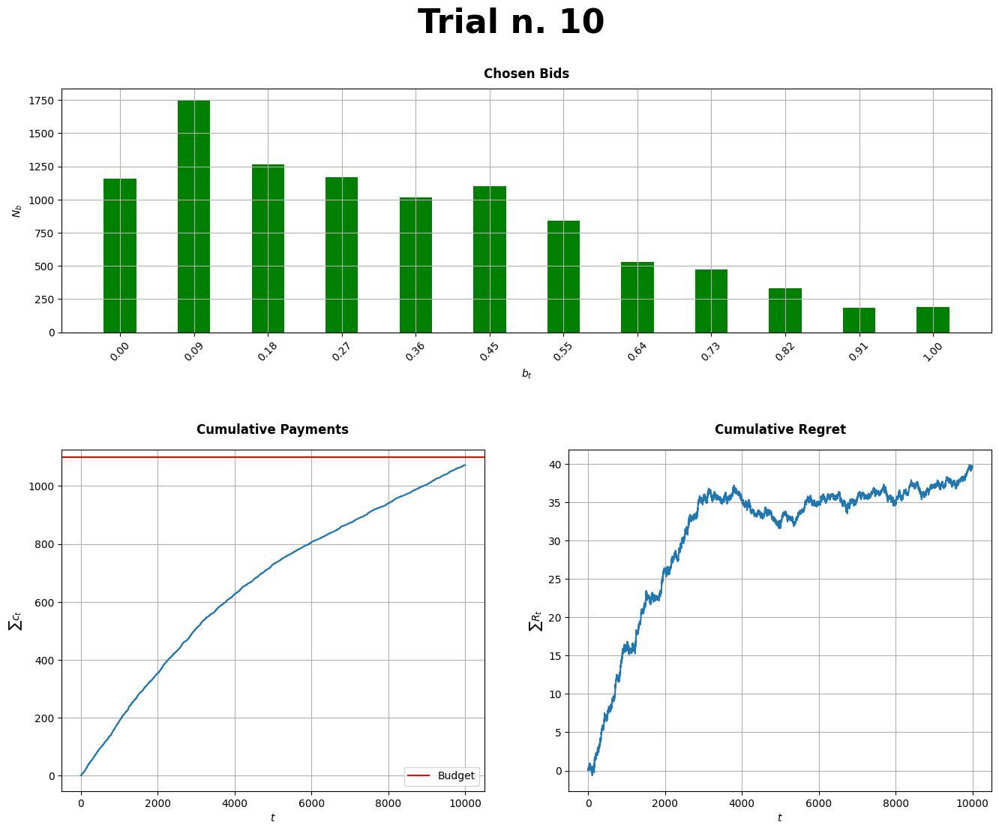

In [ ]:
cumulativeRegrets = []
cumulativePayments = []
chosenBids = []
totalWins = []


for i, seed in enumerate(range(42, 42 + nTrials)):

  regret, payments, actualBids, wins = executionMultiplicativePacing(bids, agentValue, B, nUsers, eta, ctrs, nSlots, i, seed, 'EXP3', True)

  cumulativeRegrets.append(regret)
  cumulativePayments.append(payments)
  chosenBids.append(actualBids)
  totalWins.append(wins)

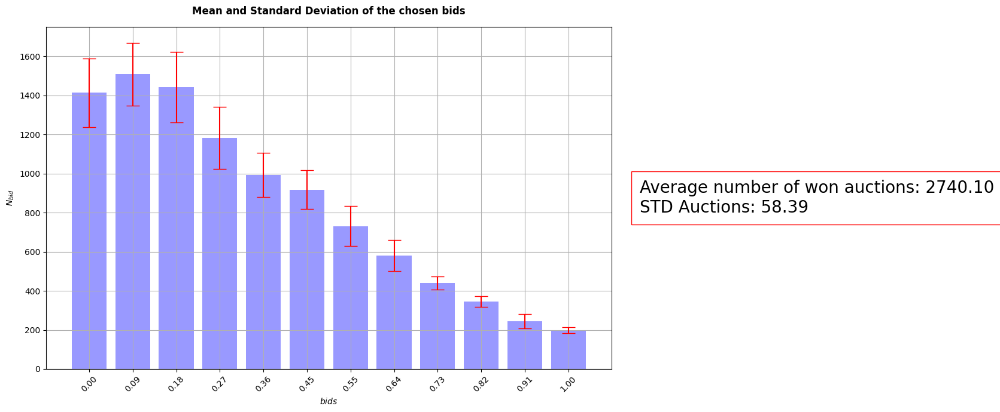

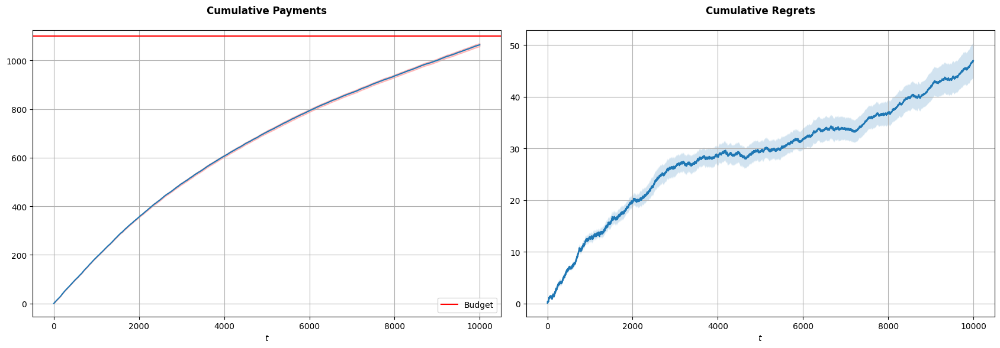

In [ ]:
# Compute statistics about chosen bids
valuesPerBids = {bid: [] for bid in bids}
stats = {}

for counter in chosenBids:

    for bid in bids:

        valuesPerBids[bid].append(counter[bid])


for bid, values in valuesPerBids.items():

    mean = np.mean(values)
    std = np.std(values)
    stats[bid] = {'mean': mean, 'std': std}

means = [stats[bid]['mean'] for bid in bids]
stds = [stats[bid]['std'] for bid in bids]
xPos = np.arange(len(bids))

# Compute statistics about total wins
totalWins = np.array(totalWins)
meanWins = np.mean(totalWins)
stdWins = np.std(totalWins)

# Compute statistics about cumulative payments
cumulativePayments = np.array(cumulativePayments)
meanPayments = cumulativePayments.mean(axis = 0)
stdPayments = cumulativePayments.std(axis = 0)

# Compute statistics about cumulative regrets
cumulativeRegrets = np.array(cumulativeRegrets)
meanRegrets = cumulativeRegrets.mean(axis = 0)
stdRegrets = cumulativeRegrets.std(axis = 0)


# Chosen Bids
fig, ax = plt.subplots(figsize = (17, 7))

bars = ax.bar(xPos, means, yerr = stds, align = 'center', alpha = 0.4, ecolor = 'red', capsize = 8, color = 'blue')
ax.set_xlabel('$bids$')
ax.set_ylabel('$N_{bid}$')
ax.set_xticks(xPos)
ax.set_xticklabels([f'{bid:.2f}' for bid in bids], rotation = 45)
ax.set_title('Mean and Standard Deviation of the chosen bids', pad = 15, fontweight = 'bold')

# Total Wins
note = f"Average number of won auctions: {meanWins:.2f}\nSTD Auctions: {stdWins:.2f}"
plt.text(1.05, 0.5, note, transform = ax.transAxes, fontsize = 20, verticalalignment = 'center', horizontalalignment = 'left',
         bbox = dict(facecolor = 'white', pad = 10, edgecolor = 'red'))

plt.tight_layout()
plt.show()


plt.figure(figsize = (17, 6))

# Cumulative Payments
plt.subplot(1, 2, 1)
plt.plot(np.arange(nUsers), meanPayments)
plt.title('Cumulative Payments', pad = 20, fontweight = 'bold')
plt.fill_between(np.arange(nUsers), meanPayments - stdPayments / np.sqrt(nTrials), meanPayments + stdPayments / np.sqrt(nTrials),
                 color = 'red', alpha = 0.2)
plt.axhline(y = B, color = 'red', label = 'Budget')
plt.legend()
plt.xlabel('$t$')

# Cumulative Regrets
plt.subplot(1, 2, 2)
plt.plot(np.arange(nUsers), meanRegrets)
plt.title('Cumulative Regrets', pad = 20, fontweight = 'bold')
plt.fill_between(np.arange(nUsers), meanRegrets - stdRegrets / np.sqrt(nTrials), meanRegrets + stdRegrets / np.sqrt(nTrials), alpha = 0.2)
plt.xlabel('$t$')

plt.tight_layout()
plt.show()

From our observations, several evident differences between the two algorithms stand out:

  - **Exploration vs. Exploitation**: EXP3 is much more explorative, frequently placing very high bids, while Hedge behaves more conservatively

  - **Auction Wins**: EXP3 has won approximately 700 more auctions than Hedge due to its explorative approach

  - **Budget Usage**: Hedge spent about half of its budget, while EXP3 completely depleted its budget

  - **Regret Comparison**: Although both algorithms exhibit sublinear regret behavior, the maximum regret for Hedge is around 17.5, significantly lower than EXP3's maximum regret, which is close to 50

## Pricing and Auction Problem

The Daily Interaction Process for the Company works as follow:  

  1.   **Price Selection**: Each day, the company chooses a product price $ p $.

  2.   **Auction Participation**: The company faces a sequence of auctions throughout the day. For each auction:

    - The company decides on a bid amount $ b $.
    - The assignment of an ad slot to the company depends on the bid $ b $, competing bids, and the auction format (i.e. Generalized First Price Auctions in our case).

  3.   **Customer Visits**: If the ad slot is won and the ad is clicked, a user visits the company's webpage.

  4.   **Purchase Probability**: Each user visiting the webpage has a probability of purchasing the product and this probability depends on the price $ p $ previously set by the company.

<br></br>
**Assumptions**:

*   Each won auction results in one user visiting the webpage and, thus, the number of won auctions directly represents the number of customers in the pricing problem. In order to model this behavior, we assume that the advertiser's click probability, given that the ad has been observed by the user (i.e., ad quality), is $ q_a = 1$

*   The prominence of each ad slot (i.e. $ λ_s $, the probability that the user observes the slot $ s $) is considered unitary, meaning all slots have the same relevance.

* Given the assumpions above, we have $ CTRs = λ_s \cdot q_a = 1 $  

* Note that in this interaction we have considered two different scenarios to model a realistic case:

  - Bandit Setting for the Pricing Problem: in the real world, we can not precisely model the loss for each price, but at most we can perform some predictions; in such a way we can model the uncertainty and the trial-and-error nature of pricing choices

  - Full-Feedback Setting for the Auction Problem: after each auction, it is reasonable to observe the highest bid that won the auction itself

### Plotting Functions

In [ ]:
def plotPricingData(nPricingTrials, T, meanPricingRegrets, stdPricingRegrets, meanChosenPrices, stdChosenPrices, rowSize = 20):

  fig = plt.figure(figsize = (rowSize, 4))
  gs = GridSpec(1, 2, figure = fig, width_ratios = [1, 2])
  fig.subplots_adjust(wspace = 0.15)


  # Average Cumulative Regret
  ax1 = fig.add_subplot(gs[0, 0])
  ax1.plot(np.arange(T), meanPricingRegrets)
  ax1.fill_between(np.arange(T),
                  meanPricingRegrets - stdPricingRegrets / np.sqrt(nPricingTrials),
                  meanPricingRegrets + stdPricingRegrets / np.sqrt(nPricingTrials),
                  alpha = 0.2)
  ax1.set_title('Average Cumulative Regret', pad = 15, fontweight = 'bold')
  ax1.set_xlabel('$t$')


  # Chosen Prices
  ax2 = fig.add_subplot(gs[0, 1])
  ax2.plot(meanChosenPrices, linewidth = 0.8)
  ax2.fill_between(range(T),
                  meanChosenPrices - stdChosenPrices,
                  meanChosenPrices + stdChosenPrices,
                  color = 'blue', alpha = 0.2)
  ax2.set_title('Chosen Prices Over Time', pad = 15, fontweight = 'bold')
  ax2.set_xlabel('$t$')
  ax2.set_ylabel('$price$')
  ax2.set_xlim(0, T - 1)

  plt.show()

In [ ]:
def plotAuctionRegretPayment(nPricingTrials, rowSize, meanData, stdData, plotType, B = 0):

  plt.figure(figsize = (rowSize, 4))


  reduced = meanData[:9]
  length = len(reduced)
  innerLegth = len(reduced[0])

  for i in range(length):

      offset = i * (innerLegth + 1)
      x = [j + offset for j in range(innerLegth)]
      plt.plot(x, meanData[i], color = 'blue', linewidth = 0.8)

      lower_bound = meanData[i] - stdData[i] / np.sqrt(nPricingTrials)
      upper_bound = meanData[i] + stdData[i] / np.sqrt(nPricingTrials)
      plt.fill_between(x, lower_bound, upper_bound, color='blue', alpha=0.2)

      if plotType == 'Payment':
        plt.hlines(y = B, xmin = offset, xmax = offset + innerLegth - 1, colors = 'green', linestyles = '-', linewidth = 1.5)

      if i < length - 1:
          plt.axvline(x[-1] + 1, color = 'red', linewidth = 2, linestyle = ':')


  totalPoints = length * (innerLegth + 1) - 1
  plt.xlim(0, totalPoints)

  plt.title(f'Average Cumulative {plotType} Per Day', pad = 15, fontweight = 'bold')
  plt.xlabel('$t$')
  plt.ylabel('$\sum R_t$' if plotType == 'Regret' else '$\sum c_t$')

  dayLabels = [f"Day {i + 1}" for i in range(length)]
  dayPositions = [(i * (innerLegth + 1) + (i + 1) * (innerLegth + 1)) // 2 for i in range(length)]
  plt.xticks(dayPositions, dayLabels)


  if plotType == 'Payment':

    legendElements = [

                        Line2D([0], [0], color = 'green', linestyle = '-', linewidth = 1.5, label = 'Budget'),
                        Line2D([0], [0], color = 'red', linestyle = ':', linewidth = 2, label = 'Start/End of a day')

                      ]

    plt.legend(handles = legendElements, loc = 'upper left')

  plt.show()

In [ ]:
def plotAuctionData(nPricingTrials, rowSize, T,
                    meanAuctionRegrets, stdAuctionRegrets,
                    meanAuctionPayments, stdAuctionPayments, B,
                    meanNumberWins, stdNumberWins):

  # Average Cumulative Regret
  plotAuctionRegretPayment(nPricingTrials, rowSize, meanAuctionRegrets, stdAuctionRegrets, 'Regret')

  # Average Cumulative Payment
  plotAuctionRegretPayment(nPricingTrials, rowSize, meanAuctionPayments, stdAuctionPayments, 'Payment', B)

  # Average Number of Wins
  plt.figure(figsize = (rowSize, 4))
  plt.plot(np.arange(T), meanNumberWins, linewidth = 0.8)
  plt.fill_between(np.arange(T),
                   meanNumberWins - stdNumberWins / np.sqrt(nPricingTrials),
                   meanNumberWins + stdNumberWins / np.sqrt(nPricingTrials),
                   color = 'blue', alpha = 0.2)
  plt.title('Average Number of Won Auctions', pad = 15, fontweight = 'bold')
  plt.xlabel('$t$')
  plt.ylabel('$N_{Wins}$')
  plt.xlim(0, T - 1)

  plt.show()

In [ ]:
def plotData(nPricingTrials,
             meanPricingRegrets, stdPricingRegrets,
             meanChosenPrices, stdChosenPrices,
             meanAuctionRegrets, stdAuctionRegrets,
             meanAuctionPayments, stdAuctionPayments, B,
             meanNumberWins, stdNumberWins,
             rowSize = 20):

  # Title
  fig, ax = plt.subplots(figsize = (rowSize, 1))
  ax.axis('off')
  fig.text(0.53, 0.5, 'Pricing Problem', ha = 'center', va = 'center', fontsize = 30, fontweight = 'bold')
  plt.show()

  # Average Cumulative Regret and Chosen Prices (Pricing Problem)
  plotPricingData(nPricingTrials, T, meanPricingRegrets, stdPricingRegrets, meanChosenPrices, stdChosenPrices, rowSize)

  # Title
  fig, ax = plt.subplots(figsize = (rowSize, 1))
  ax.axis('off')
  fig.text(0.53, 0.5, 'Auction Problem', ha = 'center', va = 'center', fontsize = 30, fontweight = 'bold')
  plt.show()

  # Average Cumulative Regret, Average Cumulative Payments and Average Number of Wins (Auction Problem)
  plotAuctionData(nPricingTrials, rowSize, T,
                  meanAuctionRegrets, stdAuctionRegrets,
                  meanAuctionPayments, stdAuctionPayments, B,
                  meanNumberWins, stdNumberWins)

### Execution and Performance Evaluation

In [ ]:
# -------------------------------- Pricing's Parameters --------------------------------

nPricingTrials = 5
K = 15
cost = 0.2
T = 2000
minPrice, maxPrice = 0, 1
prices = np.linspace(minPrice, maxPrice, K)
pricingLearningRate = np.sqrt(np.log(K) / (K * T))


# -------------------------------- Auction's Parameters --------------------------------

# Define the Publisher's fixed parameters
nSlots = 2

# Define the Advertizers' parameters
nAdvertizers = 6
ctrs = np.ones(nAdvertizers + 1)
agentValue = 0.5
B = 80

# Define Environment's parameters
nUsers = 250                                 # We are assuming 'nUsers' auctions per day
bids = np.linspace(0, 1, 12)
eta = 1 / np.sqrt(nUsers)

# Define competitors' parameters
competitorsBids = np.array([generateCompetingBids(t, nAdvertizers) for t in range(nUsers)])
m_t = competitorsBids.max(axis = 1)

In [ ]:
# Auction: Solve the linear program to define the baseline
winProbabilities = np.array([sum(b > m_t) / nUsers for b in bids])
rho = rho = B / nUsers

c = -(agentValue - bids) * winProbabilities
A_ub = [bids * winProbabilities]
b_ub = [rho]
A_eq = [np.ones(len(bids))]
b_eq = [1]

res = optimize.linprog(c, A_ub = A_ub, b_ub = b_ub, A_eq = A_eq, b_eq = b_eq, bounds = (0, 1))
gamma = res.x

expectedClairvoyantUtilities = [-res.fun for u in range(nUsers)]
expectedClairvoyantBids = [sum(bids * gamma * winProbabilities) for u in range(nUsers)]

In [ ]:
# Before running this code be sure to run:
#                                                 - "Required features for the environment" Section
#                                                 - BanditPricingEnvironment ("Pricing Problem" Section)
#                                                 - EXP3Agent ("Pricing Problem" Section)
#                                                 - HedgeAgent ("Pricing Problem" Section)
#                                                 - GeneralizedFirstPriceAuction ("GFPA" Section)
#                                                 - MultiplicativePacingAgentHedge ("GFPA" Section)
#                                                 - executionMultiplicativePacing ("GFPA" Section)

pricingRegrets = []
chosenPrices = []
auctionRegrets = []
auctionPayments = []
nWins = []


for i, seed in enumerate(range(42, 42 + nPricingTrials)):

  np.random.seed(seed)

  pricingAgent = EXP3Agent(K, pricingLearningRate)
  pricingEnv = BanditPricingEnvironment(buyingProbability = buyingProbability, cost = cost, prices = prices)

  rewards = []
  maxRewards = []
  agentLosses = []
  chosenPricesPerTrial = []
  auctionRegretsPerTrial = []
  auctionPaymentsPerTrial = []
  nWinsPerTrial = []

  for t in tqdm(range(T), desc = f"Learning (Trial n. {i + 1})", leave = True, unit = "Days", colour = "green"):

    auctionSeed = seed + t + i * 3

    # Pricing: the company chooses a price
    a_t = pricingAgent.pull_arm()
    price = prices[a_t]
    chosenPricesPerTrial.append(price)

    # Auction: the company faces a sequence of auction
    regret, payments, actualBids, wins = executionMultiplicativePacing(bids, agentValue, B, nUsers, eta, ctrs, nSlots, 0, auctionSeed, 'Hedge', False)

    auctionRegretsPerTrial.append(regret)
    auctionPaymentsPerTrial.append(payments)
    nWinsPerTrial.append(wins)

    # Computing elements for pricing clairvoyant
    possibleRewards = [(price - cost) * np.random.binomial(wins, buyingProbability(price, t)) for price in prices]    # wins = # of customers
    maxPossibleReward = max(possibleRewards)
    rewards.append(possibleRewards)
    maxRewards.append(maxPossibleReward)

    # Auction-Pricing Interaction: we assume all the won auctions to be clicked by a user
    l_t = pricingEnv.round(price, wins)
    pricingAgent.update(l_t)

    agentLosses.append(l_t)

  agentLosses = np.array(agentLosses)

  rewards = np.array(rewards)
  cumulativeRewards = np.sum(rewards, axis = 0)
  bestPriceIndex = np.argmax(cumulativeRewards)
  bestPrice = prices[bestPriceIndex]

  clairvoyantRewards = rewards[:, bestPriceIndex]
  clairvoyantLosses = np.array([maxReward - clairvoyantReward for maxReward, clairvoyantReward in zip(maxRewards, clairvoyantRewards)])

  cumulativeRegret = np.cumsum(agentLosses - clairvoyantLosses)

  pricingRegrets.append(cumulativeRegret)
  chosenPrices.append(chosenPricesPerTrial)
  nWins.append(nWinsPerTrial)
  auctionRegrets.append(auctionRegretsPerTrial)
  auctionPayments.append(auctionPaymentsPerTrial)

Learning (Trial n. 5): 100%|██████████| 2000/2000 [01:25<00:00, 23.46Days/s]


In [ ]:
pricingRegrets = np.array(pricingRegrets)
chosenPrices = np.array(chosenPrices)
nWins = np.array(nWins)
auctionRegrets = np.array(auctionRegrets)
auctionPayments = np.array(auctionPayments)


# Compute statistics about the cumulative regret for the pricing problem
meanPricingRegrets = pricingRegrets.mean(axis = 0)
stdPricingRegrets = pricingRegrets.std(axis = 0)

# Compute statistics about the chose prices for the pricing problem
meanChosenPrices = chosenPrices.mean(axis = 0)
stdChosenPrices = chosenPrices.std(axis = 0)

# Compute statistics about the cumulative regret for the auction problem
meanAuctionRegrets = auctionRegrets.mean(axis = 0)
stdAuctionRegrets = auctionRegrets.std(axis = 0)

# Compute statistics about the cumulative payments for the auction problem
meanAuctionPayments = auctionPayments.mean(axis = 0)
stdAuctionPayments = auctionPayments.std(axis = 0)

# Compute statistics about the number of won auctions for the auction problem
meanNumberWins = nWins.mean(axis = 0)
stdNumberWins = nWins.std(axis = 0)

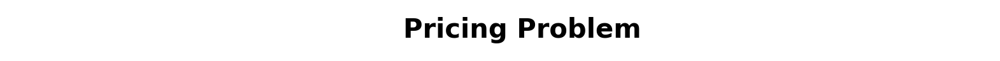

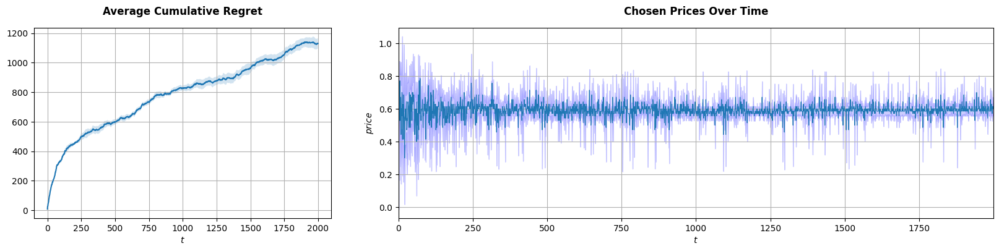

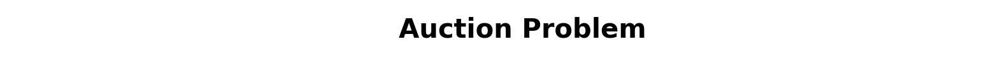

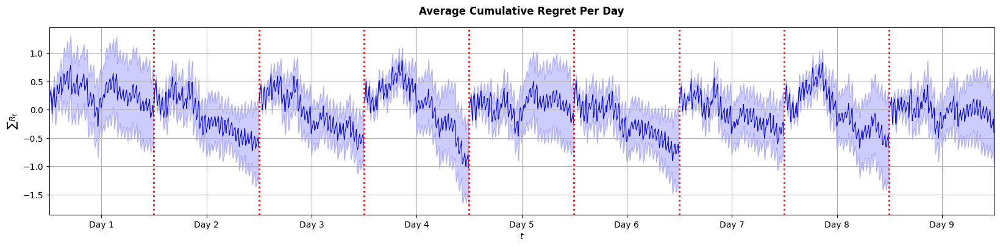

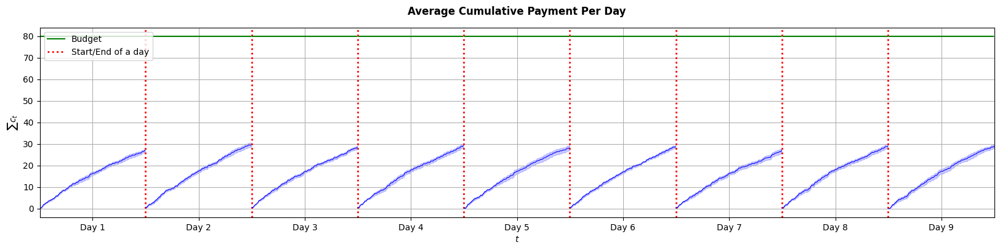

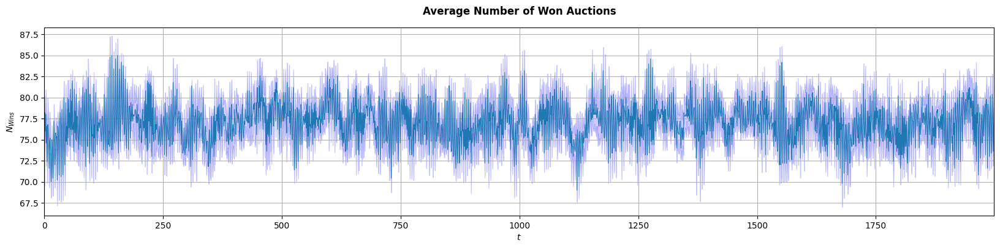

In [ ]:
plotData(nPricingTrials,
         meanPricingRegrets, stdPricingRegrets,
         meanChosenPrices, stdChosenPrices,
         meanAuctionRegrets, stdAuctionRegrets,
         meanAuctionPayments, stdAuctionPayments, B,
         meanNumberWins, stdNumberWins)

# Requirement 3: two extensions for pricing


### Define the environment
non-stationary environment for the pricing problem
- Days are partitioned in intervals
- In each interval the demand curve is different
- The demand curve + noise specifies how many buyers will buy for every price
depending on the current interval

Build a pricing strategy using the discretization of the prices p ∈ [0, 1] and sliding-window

Mean Total Reward: 72442.56
Total Reward Std Dev: 5836.91


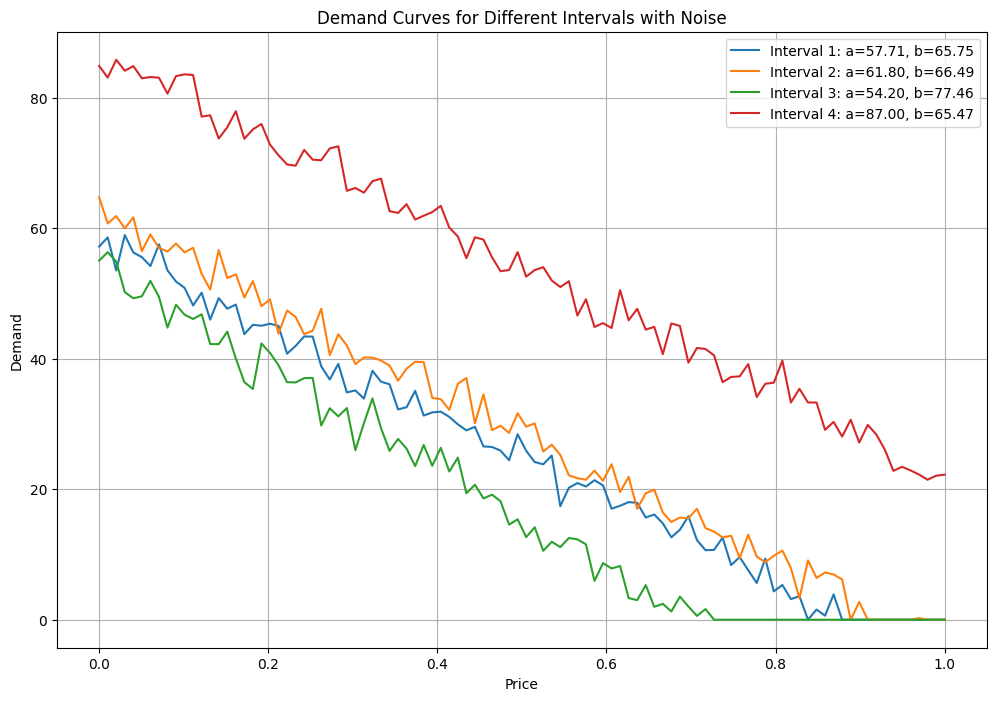

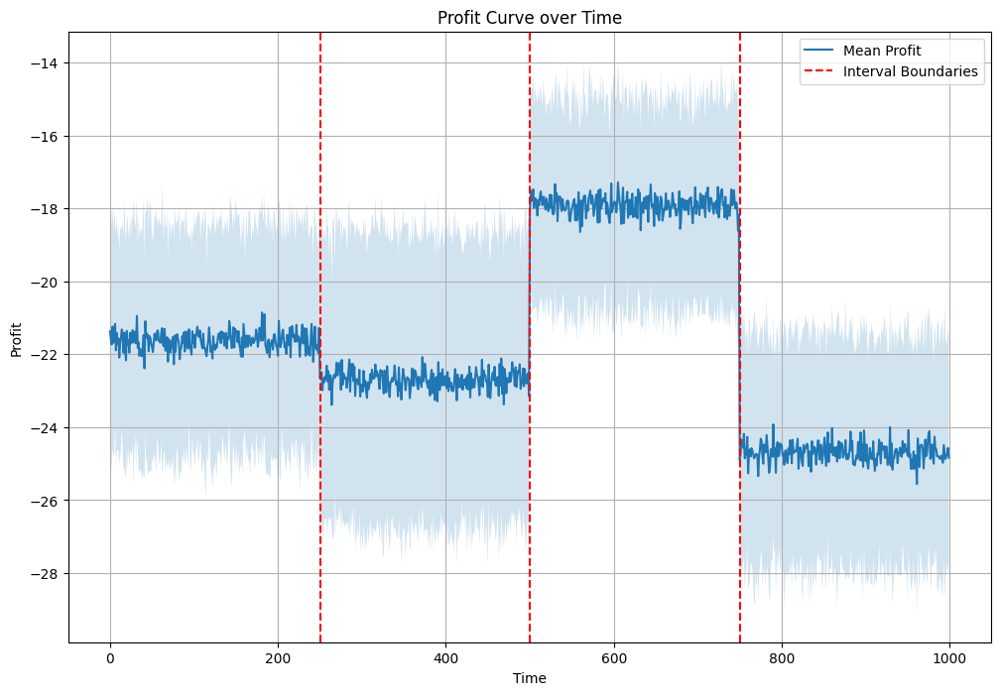

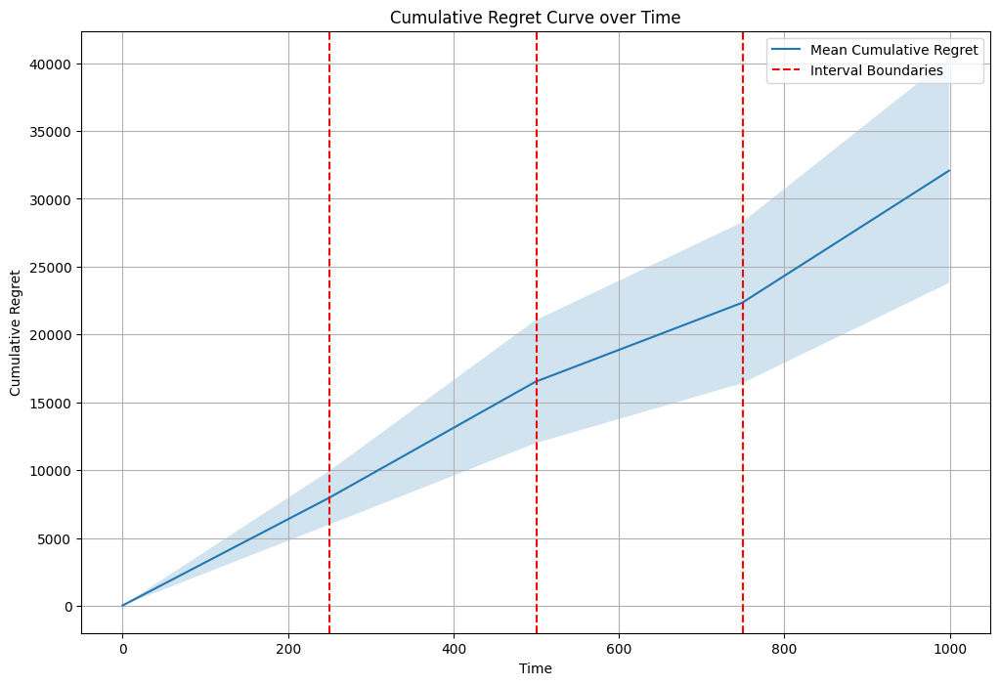

In [ ]:
class NonStationaryPricing:
    def __init__(self, T, K, n, W, noise_std=5, cost=1):
        self.T = T
        self.K = K
        self.n = n
        self.W = W
        self.prices = np.linspace(0, 1, n)
        self.demand_params = self._generate_demand_params()
        self.rewards = np.zeros((T, n))
        self.counts = np.zeros((T, n))
        self.noise_std = noise_std  # Standard deviation of the Gaussian noise
        self.cost = cost  # Cost of producing each good
        self.profits = np.zeros(T)  # To store the profit at each time step
        self.regret = np.zeros(T)  # To store the regret at each time step

    def _generate_demand_params(self):
        # Generate different demand curve parameters for each interval
        a_k = np.random.uniform(50, 100, self.K)
        b_k = np.random.uniform(60, 80, self.K)
        return list(zip(a_k, b_k))

    def demand_curve(self, k, p):
        a_k, b_k = self.demand_params[k]
        demand = a_k - b_k * p
        noise = np.random.normal(0, self.noise_std)
        demand_with_noise = demand + noise
        return np.clip(demand_with_noise, 0, None)

    def get_interval(self, t):
        return t * self.K // self.T

    def simulate(self):
        for t in range(self.T):
            k = self.get_interval(t)
            for i, p in enumerate(self.prices):
                self.rewards[t, i] = self.demand_curve(k, p)
                self.counts[t, i] += 1

    def calculate_optimal_rewards(self):
        self.optimal_rewards = np.zeros(self.T)
        for t in range(self.T):
            k = self.get_interval(t)
            optimal_reward = -np.inf
            for p in self.prices:
                reward = (p - self.cost) * (self.demand_params[k][0] - self.demand_params[k][1] * p)
                if reward > optimal_reward:
                    optimal_reward = reward
            self.optimal_rewards[t] = optimal_reward

    def ucb1_sliding_window(self):
        total_reward = 0
        selected_prices = []
        for t in range(self.T):
            k = self.get_interval(t)
            ucb_values = np.zeros(self.n)
            for i, p in enumerate(self.prices):
                if t < self.W:
                    mu = np.mean(self.rewards[:t+1, i])
                    n_t = np.sum(self.counts[:t+1, i])
                else:
                    mu = np.mean(self.rewards[t-self.W+1:t+1, i])
                    n_t = np.sum(self.counts[t-self.W+1:t+1, i])
                ucb_values[i] = mu + np.sqrt(2 * np.log(t+1) / (n_t + 1))
            best_price_idx = np.argmax(ucb_values)
            selected_price = self.prices[best_price_idx]
            selected_prices.append(selected_price)
            reward = self.demand_curve(k, selected_price)
            profit = (selected_price - self.cost) * reward
            self.profits[t] = profit
            total_reward += reward
            self.rewards[t, best_price_idx] = reward
            self.counts[t, best_price_idx] += 1
            self.regret[t] = self.optimal_rewards[t] - profit
        return selected_prices, total_reward

T = 1000  # Time horizon
K = 4  # Number of intervals
assert T / K == T // K
n = 15  # Number of discrete prices
W = 100  # Sliding window size
noise_std = 2  # Reduced noise standard deviation
cost = 0.3  # Cost of producing each good

num_trials = 5

total_rewards = []
selected_prices_trials = []
profits_trials = []
regret_trials = []

for _ in range(num_trials):
    pricing = NonStationaryPricing(T, K, n, W, noise_std, cost)
    pricing.simulate()
    pricing.calculate_optimal_rewards()
    selected_prices, total_reward = pricing.ucb1_sliding_window()

    total_rewards.append(total_reward)
    selected_prices_trials.append(selected_prices)
    profits_trials.append(pricing.profits)
    regret_trials.append(pricing.regret)

mean_total_reward = np.mean(total_rewards)
std_total_reward = np.std(total_rewards)

mean_profits = np.mean(profits_trials, axis=0)
std_profits = np.std(profits_trials, axis=0)

mean_regret = np.mean(regret_trials, axis=0)
std_regret = np.std(regret_trials, axis=0)

print(f"Mean Total Reward: {mean_total_reward:.2f}")
print(f"Total Reward Std Dev: {std_total_reward:.2f}")

def plot_demand_curves(pricing):
    plt.figure(figsize=(12, 8))
    for k in range(pricing.K):
        a_k, b_k = pricing.demand_params[k]
        prices = np.linspace(0, 1, 100)
        demands = np.clip([a_k - b_k * p + np.random.normal(0, pricing.noise_std) for p in prices], 0, None)
        plt.plot(prices, demands, label=f'Interval {k + 1}: a={a_k:.2f}, b={b_k:.2f}')
    plt.xlabel('Price')
    plt.ylabel('Demand')
    plt.title('Demand Curves for Different Intervals with Noise')
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_profit_curve(mean_profits, std_profits, pricing):
    plt.figure(figsize=(12, 8))
    plt.plot(range(pricing.T), mean_profits, label='Mean Profit')
    plt.fill_between(range(pricing.T), mean_profits - std_profits, mean_profits + std_profits, alpha=0.2)
    plt.xlabel('Time')
    plt.ylabel('Profit')
    plt.title('Profit Curve over Time')
    for k in range(1, pricing.K):
        if k == 1:
            plt.axvline(x=k * pricing.T // pricing.K, color='r', linestyle='--', label='Interval Boundaries')
        else:
            plt.axvline(x=k * pricing.T // pricing.K, color='r', linestyle='--')
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_regret_curve(mean_regret, std_regret, pricing):
    cumulative_regret = np.cumsum(mean_regret)
    cumulative_regret_std = np.cumsum(std_regret)
    plt.figure(figsize=(12, 8))
    plt.plot(range(pricing.T), cumulative_regret, label='Mean Cumulative Regret')
    plt.fill_between(range(pricing.T), cumulative_regret - cumulative_regret_std, cumulative_regret + cumulative_regret_std, alpha=0.2)
    plt.xlabel('Time')
    plt.ylabel('Cumulative Regret')
    plt.title('Cumulative Regret Curve over Time')
    for k in range(1, pricing.K):
        if k == 1:
            plt.axvline(x=k * pricing.T // pricing.K, color='r', linestyle='--', label='Interval Boundaries')
        else:
            plt.axvline(x=k * pricing.T // pricing.K, color='r', linestyle='--')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot demand curves for the last trial
plot_demand_curves(pricing)

# Plot profit curve
plot_profit_curve(mean_profits, std_profits, pricing)

# Plot regret curve
plot_regret_curve(mean_regret, std_regret, pricing)

### CUSUM
Build a pricing strategy using the discretization of the prices p ∈ [0, 1] and CUSUM

Mean Total Reward: 73594.82
Total Reward Std Dev: 6380.19


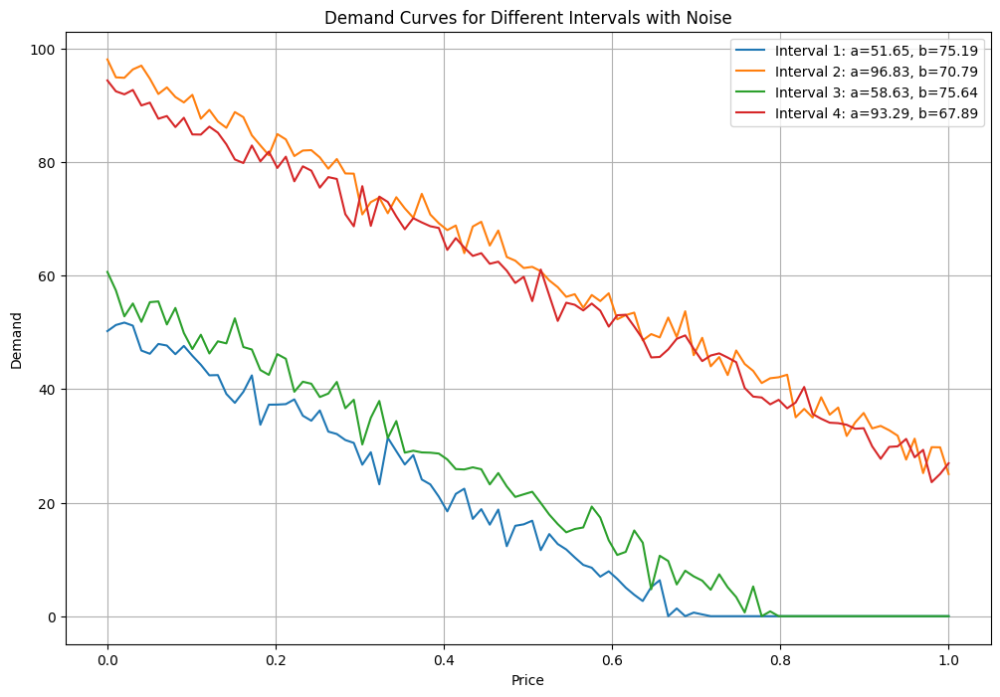

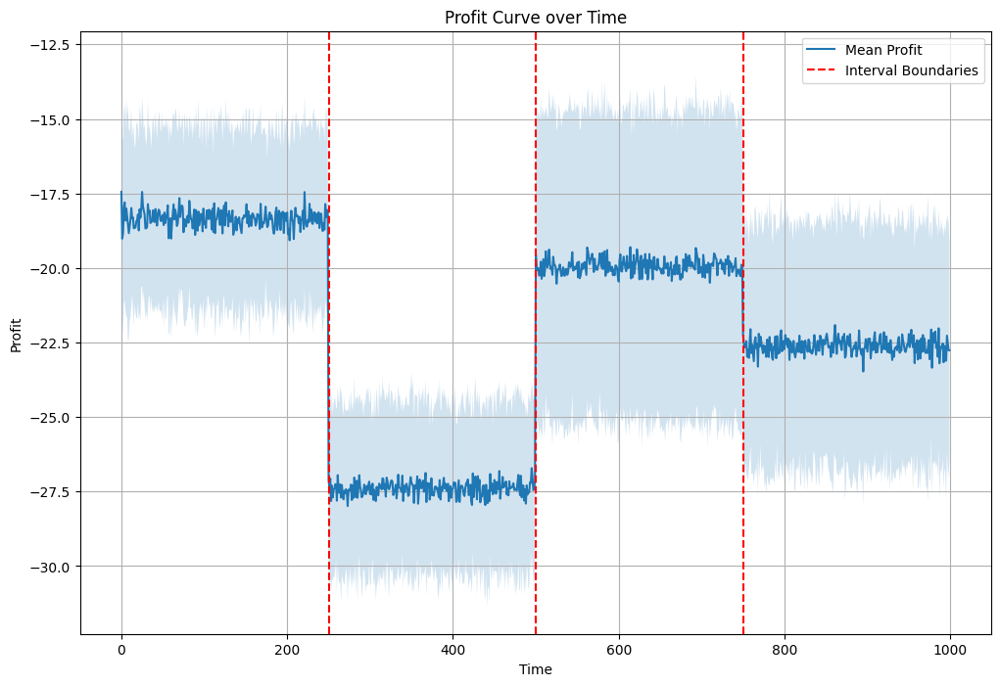

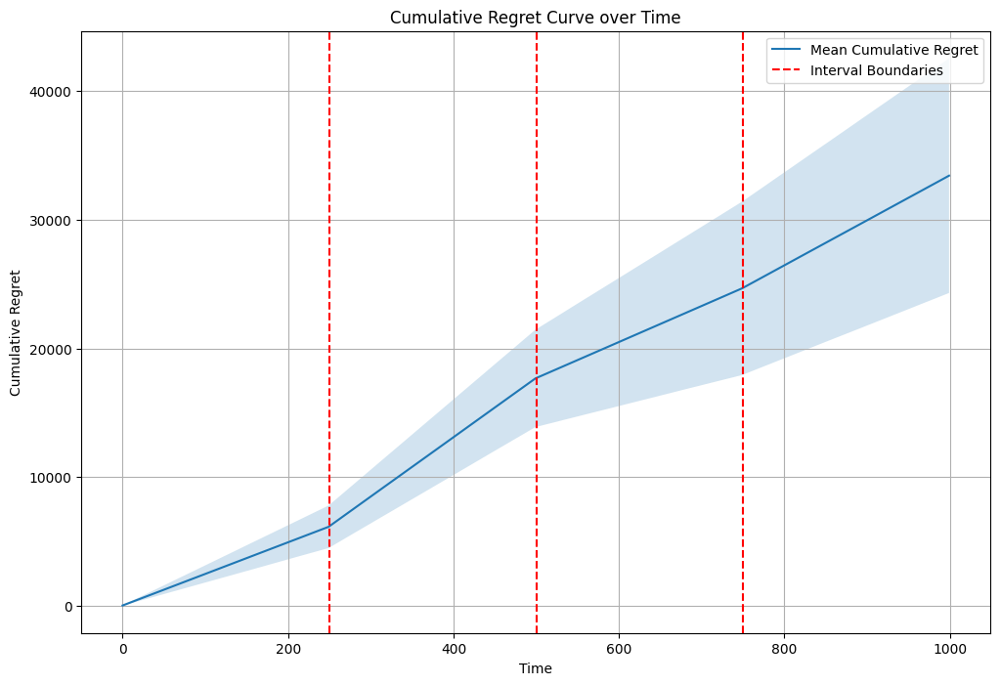

In [ ]:
class NonStationaryPricing:
    def __init__(self, T, K, n, W, noise_std=5, cost=1, M=30, epsilon=0.05, h=10):
        """
        Initialize the NonStationaryPricing class.

        Parameters:
        - T: Time horizon
        - K: Number of intervals
        - n: Number of discrete prices
        - W: Sliding window size
        - noise_std: Standard deviation of the Gaussian noise
        - cost: Cost of producing each good
        - M: Number of samples for the estimation phase
        - epsilon: Threshold for detecting change
        - h: Threshold for CUSUM
        """
        self.T = T
        self.K = K
        self.n = n
        self.W = W
        self.prices = np.linspace(0, 1, n)  # Discretized prices
        self.demand_params = self._generate_demand_params()  # Demand parameters for each interval
        self.rewards = np.zeros((T, n))  # Rewards matrix
        self.counts = np.zeros((T, n))  # Counts of each price being chosen
        self.noise_std = noise_std  # Standard deviation of the Gaussian noise
        self.cost = cost  # Cost of producing each good
        self.profits = np.zeros(T)  # To store the profit at each time step
        self.regret = np.zeros(T)  # To store the regret at each time step
        self.M = M  # Number of samples for the estimation phase
        self.epsilon = epsilon  # Threshold for detecting change
        self.h = h  # Threshold for CUSUM

    def _generate_demand_params(self):
        """
        Generate different demand curve parameters for each interval.
        Returns:
        - List of tuples containing (a_k, b_k) for each interval
        """
        a_k = np.random.uniform(50, 100, self.K)  # Demand curve intercepts
        b_k = np.random.uniform(60, 80, self.K)  # Demand curve slopes
        return list(zip(a_k, b_k))


    def demand_curve(self, k, p):
        """
        Calculate the demand for a given price in a given interval.

        Parameters:
        - k: Interval index
        - p: Price

        Returns:
        - Demand with added Gaussian noise
        """
        a_k, b_k = self.demand_params[k]
        demand = a_k - b_k * p
        noise = np.random.normal(0, self.noise_std)
        demand_with_noise = demand + noise
        return np.clip(demand_with_noise, 0, None)

    def get_interval(self, t):
        """
        Determine the interval for a given time step.

        Parameters:
        - t: Time step

        Returns:
        - Interval index
        """
        return t * self.K // self.T

    def simulate(self):
        """
        Simulate the environment to generate rewards for each price at each time step.
        """
        for t in range(self.T):
            k = self.get_interval(t)
            for i, p in enumerate(self.prices):
                self.rewards[t, i] = self.demand_curve(k, p)
                self.counts[t, i] += 1

    def calculate_optimal_rewards(self):
        """
        Calculate the optimal rewards for each time step.
        """
        self.optimal_rewards = np.zeros(self.T)
        for t in range(self.T):
            k = self.get_interval(t)
            optimal_reward = -np.inf
            for p in self.prices:
                reward = (p - self.cost) * (self.demand_params[k][0] - self.demand_params[k][1] * p)
                if reward > optimal_reward:
                    optimal_reward = reward
            self.optimal_rewards[t] = optimal_reward

    def cusum_pricing(self):
        """
        Implement the CUSUM algorithm combined with UCB1 for pricing.

        Returns:
        - selected_prices: List of prices selected at each time step
        - total_reward: Total reward accumulated
        """
        total_reward = 0
        selected_prices = []
        # CUSUM variables
        g_pos = np.zeros(self.n)
        g_neg = np.zeros(self.n)
        tau = np.zeros(self.n)
        mu_hat = np.zeros(self.n)
        W = self.W  # Initial window size
        for t in range(self.T):
            k = self.get_interval(t)
            ucb_values = np.zeros(self.n)
            for i, p in enumerate(self.prices):
                if t < W:
                    mu = np.mean(self.rewards[:t+1, i])
                    n_t = np.sum(self.counts[:t+1, i])
                else:
                    mu = np.mean(self.rewards[t-W+1:t+1, i])
                    n_t = np.sum(self.counts[t-W+1:t+1, i])

                if t > self.M:
                    reward = self.rewards[t, i]
                    s_pos = reward - mu_hat[i] - self.epsilon
                    s_neg = -reward + mu_hat[i] - self.epsilon
                    g_pos[i] = max(0, g_pos[i] + s_pos)
                    g_neg[i] = max(0, g_neg[i] + s_neg)
                    if g_pos[i] > self.h or g_neg[i] > self.h:
                        tau[i] = t
                        g_pos[i] = 0
                        g_neg[i] = 0
                        mu_hat[i] = np.mean(self.rewards[t-self.M:t, i])
                        W = min(max(W // 2, 10), self.W)  # Dynamically adjust the window size

                ucb_values[i] = mu + np.sqrt(2 * np.log(t+1) / (n_t + 1))
            best_price_idx = np.argmax(ucb_values)
            selected_price = self.prices[best_price_idx]
            selected_prices.append(selected_price)
            reward = self.demand_curve(k, selected_price)
            profit = (selected_price - self.cost) * reward
            self.profits[t] = profit
            total_reward += reward
            self.rewards[t, best_price_idx] = reward
            self.counts[t, best_price_idx] += 1
            self.regret[t] = self.optimal_rewards[t] - profit
        return selected_prices, total_reward

T = 1000  # Time horizon
K = 4  # Number of intervals
assert T / K == T // K
n = 15  # Number of discrete prices
W = 100  # Sliding window size
noise_std = 2  # Reduced noise standard deviation
cost = 0.3  # Cost of producing each good
M = 30  # Number of samples for estimation phase
epsilon = 0.05  # Threshold for detecting change
h = 10  # Threshold for CUSUM

num_trials = 5

total_rewards = []
selected_prices_trials = []
profits_trials = []
regret_trials = []

for _ in range(num_trials):
    pricing = NonStationaryPricing(T, K, n, W, noise_std, cost, M, epsilon, h)
    pricing.simulate()
    pricing.calculate_optimal_rewards()
    selected_prices, total_reward = pricing.cusum_pricing()

    total_rewards.append(total_reward)
    selected_prices_trials.append(selected_prices)
    profits_trials.append(pricing.profits)
    regret_trials.append(pricing.regret)

mean_total_reward = np.mean(total_rewards)
std_total_reward = np.std(total_rewards)

mean_profits = np.mean(profits_trials, axis=0)
std_profits = np.std(profits_trials, axis=0)

mean_regret = np.mean(regret_trials, axis=0)
std_regret = np.std(regret_trials, axis=0)

print(f"Mean Total Reward: {mean_total_reward:.2f}")
print(f"Total Reward Std Dev: {std_total_reward:.2f}")

def plot_demand_curves(pricing):
    """
    Plot the demand curves for different intervals.
    """
    plt.figure(figsize=(12, 8))
    for k in range(pricing.K):
        a_k, b_k = pricing.demand_params[k]
        prices = np.linspace(0, 1, 100)
        demands = np.clip([a_k - b_k * p + np.random.normal(0, pricing.noise_std) for p in prices], 0, None)
        plt.plot(prices, demands, label=f'Interval {k+1}: a={a_k:.2f}, b={b_k:.2f}')
    plt.xlabel('Price')
    plt.ylabel('Demand')
    plt.title('Demand Curves for Different Intervals with Noise')
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_profit_curve(mean_profits, std_profits, pricing):
    """
    Plot the profit curve over time.
    """
    plt.figure(figsize=(12, 8))
    plt.plot(range(pricing.T), mean_profits, label='Mean Profit')
    plt.fill_between(range(pricing.T), mean_profits - std_profits, mean_profits + std_profits, alpha=0.2)
    plt.xlabel('Time')
    plt.ylabel('Profit')
    plt.title('Profit Curve over Time')
    for k in range(1, pricing.K):
        if k == 1:
            plt.axvline(x=k * pricing.T // pricing.K, color='r', linestyle='--', label='Interval Boundaries')
        else:
            plt.axvline(x=k * pricing.T // pricing.K, color='r', linestyle='--')
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_regret_curve(mean_regret, std_regret, pricing):
    """
    Plot the cumulative regret curve over time.
    """
    cumulative_regret = np.cumsum(mean_regret)
    cumulative_regret_std = np.cumsum(std_regret)
    plt.figure(figsize=(12, 8))
    plt.plot(range(pricing.T), cumulative_regret, label='Mean Cumulative Regret')
    plt.fill_between(range(pricing.T), cumulative_regret - cumulative_regret_std, cumulative_regret + cumulative_regret_std, alpha=0.2)
    plt.xlabel('Time')
    plt.ylabel('Cumulative Regret')
    plt.title('Cumulative Regret Curve over Time')
    for k in range(1, pricing.K):
        if k == 1:
            plt.axvline(x=k * pricing.T // pricing.K, color='r', linestyle='--', label='Interval Boundaries')
        else:
            plt.axvline(x=k * pricing.T // pricing.K, color='r', linestyle='--')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot demand curves for the last trial
plot_demand_curves(pricing)

# Plot profit curve
plot_profit_curve(mean_profits, std_profits, pricing)

# Plot regret curve
plot_regret_curve(mean_regret, std_regret, pricing)

# Two-Item Stochastic Pricing Environment (Bonus Point)

In [2]:
import warnings
import numpy as np
import matplotlib.pyplot as plt
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, ConstantKernel as C, Matern
from sklearn.exceptions import ConvergenceWarning

# Suppress convergence warnings
warnings.filterwarnings('ignore', category=UserWarning)
warnings.filterwarnings('ignore', category=ConvergenceWarning)

In [3]:
# Parameters
discretization = 20
n_trials = 5
T = 350

# Demand curve for two products
def demand_curve(p1, p2):
    base_demand_p1 = max(45 - 30 * p1 + 10*p2 - 12*p1*p2, 0)
    base_demand_p2 = max(28 - 25 * p2 + 8*p1 - 10*p1*p2, 0)
    noise_p1 = np.random.normal(0, 1)
    noise_p2 = np.random.normal(0, 1)
    return max(base_demand_p1 + noise_p1, 0), max(base_demand_p2 + noise_p2, 0)

def demand_curve_wo_noise(p1, p2):
    base_demand_p1 = max(45 - 30 * p1 + 10*p2 - 12*p1*p2, 0)
    base_demand_p2 = max(28 - 25 * p2 + 8*p1 - 10*p1*p2, 0)
    return max(base_demand_p1, 0), max(base_demand_p2, 0)

# Profit calculation
def calculate_profit(p1, p2, demand1, demand2):
    return p1 * demand1 + p2 * demand2

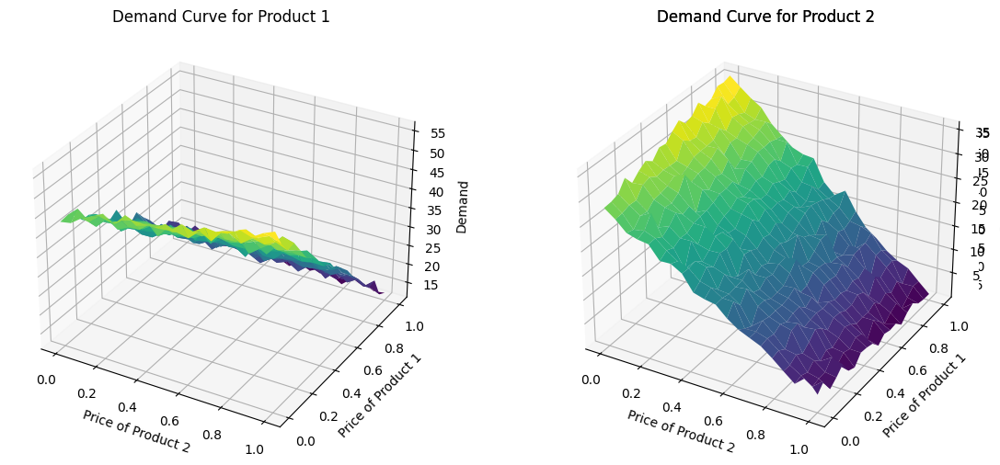

In [4]:
# Define the price ranges
p1_range = np.linspace(0, 1, discretization)
p2_range = np.linspace(0, 1, discretization)

def plot_demand_curve():

    # Initialize arrays to store the demands
    D1 = np.zeros((len(p1_range), len(p2_range)))
    D2 = np.zeros((len(p1_range), len(p2_range)))

    # Calculate the demand for each combination of prices
    for i, p1 in enumerate(p1_range):
        for j, p2 in enumerate(p2_range):
            D1[i, j], D2[i, j] = demand_curve(p1, p2)

    # Plot the demand curves
    fig = plt.figure(figsize=(14, 6))

    # Plot demand for product 1
    ax1 = fig.add_subplot(121, projection='3d')
    P1, P2 = np.meshgrid(p1_range, p2_range)
    ax1.plot_surface(P1, P2, D1, cmap='viridis')
    ax1.set_title('Demand Curve for Product 1')
    ax1.set_xlabel('Price of Product 2')
    ax1.set_ylabel('Price of Product 1')
    ax1.set_zlabel('Demand')

    # Plot demand for product 1 (better plot)
    ax3 = fig.add_subplot(122, projection='3d')
    ax3.plot_surface(P2, P1, D1, cmap='viridis')
    ax3.set_title('Demand Curve for Product 2')
    ax3.set_xlabel('Price of Product 1')
    ax3.set_ylabel('Price of Product 2')
    ax3.set_zlabel('Demand')

    # Plot demand for product 2
    ax2 = fig.add_subplot(122, projection='3d')
    ax2.plot_surface(P1, P2, D2, cmap='viridis')
    ax2.set_title('Demand Curve for Product 2')
    ax2.set_xlabel('Price of Product 2')
    ax2.set_ylabel('Price of Product 1')
    ax2.set_zlabel('Demand')

    plt.show()

# Call the function to plot the effective demand curves
plot_demand_curve()

In [5]:
class GPUCB_Agent:
    def __init__(self, kernel, alpha=1e-2, beta=2.0):
        self.gp1 = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, alpha=alpha)
        self.gp2 = GaussianProcessRegressor(kernel=kernel, n_restarts_optimizer=10, alpha=alpha)
        self.beta = beta
        self.X = np.empty((0, 2))
        self.y1 = np.empty((0,))
        self.y2 = np.empty((0,))

    def update(self, x, y1, y2):
        self.X = np.vstack((self.X, x))
        self.y1 = np.append(self.y1, y1)
        self.y2 = np.append(self.y2, y2)
        self.gp1.fit(self.X, self.y1)
        self.gp2.fit(self.X, self.y2)

    def select_arm(self):
        p1_range = np.linspace(0, 1, discretization)
        p2_range = np.linspace(0, 1, discretization)
        P1, P2 = np.meshgrid(p1_range, p2_range)
        X_candidates = np.c_[P1.ravel(), P2.ravel()]

        y1_pred, sigma1 = self.gp1.predict(X_candidates, return_std=True)
        y2_pred, sigma2 = self.gp2.predict(X_candidates, return_std=True)

        ucb1 = y1_pred + self.beta * sigma1
        ucb2 = y2_pred + self.beta * sigma2

        max_index = np.argmax(ucb1 + ucb2)
        return X_candidates[max_index]

# Initialize the agent
kernel = C(1.0, (1e-4, 1e3)) * RBF(1.0, (1e-4, 1e3)) + Matern(length_scale=1.0, nu=1.5)


In [6]:
# let's compute the clairvoyant

P = np.zeros((len(p1_range), len(p2_range)))

# Initialize arrays to store the demands
D1 = np.zeros((len(p1_range), len(p2_range)))
D2 = np.zeros((len(p1_range), len(p2_range)))

# Calculate the demand for each combination of prices
for i, p1 in enumerate(p1_range):
    for j, p2 in enumerate(p2_range):
        D1[i, j], D2[i, j] = demand_curve_wo_noise(p1, p2)
        P[i, j] = D1[i, j]*p1 + D2[i, j]*p2

# Find the highest value in the profit matrix
highest_value = np.max(P)
coordinates = np.unravel_index(np.argmax(P), P.shape)

print(f"Highest value: {highest_value} at coordinates: {coordinates[0]/discretization, coordinates[1]/discretization}")


expected_clairvoyant_rewards = np.repeat(highest_value, T)

Highest value: 26.19186470330952 at coordinates: (0.7, 0.5)


0 Round 1: p1=0.00, p2=0.00, profit=0.00, regret=26.19
0 Round 2: p1=1.00, p2=1.00, profit=11.57, regret=14.62
0 Round 3: p1=1.00, p2=0.95, profit=15.84, regret=10.35
0 Round 4: p1=0.68, p2=0.68, profit=24.12, regret=2.07
0 Round 5: p1=1.00, p2=0.21, profit=20.62, regret=5.57
0 Round 6: p1=0.79, p2=0.47, profit=25.60, regret=0.59
0 Round 7: p1=1.00, p2=0.53, profit=22.02, regret=4.17
0 Round 8: p1=0.68, p2=0.00, profit=17.08, regret=9.11
0 Round 9: p1=0.16, p2=1.00, profit=11.31, regret=14.88
0 Round 10: p1=0.63, p2=0.47, profit=25.71, regret=0.48
0 Round 11: p1=0.74, p2=0.47, profit=24.98, regret=1.21
0 Round 12: p1=0.68, p2=0.47, profit=25.54, regret=0.65
0 Round 13: p1=0.74, p2=0.58, profit=26.65, regret=-0.46
0 Round 14: p1=0.63, p2=0.58, profit=25.98, regret=0.22
0 Round 15: p1=0.74, p2=0.53, profit=25.88, regret=0.32
0 Round 16: p1=0.68, p2=0.53, profit=26.30, regret=-0.11
0 Round 17: p1=0.79, p2=0.53, profit=26.29, regret=-0.10
0 Round 18: p1=0.68, p2=0.58, profit=24.77, regret=

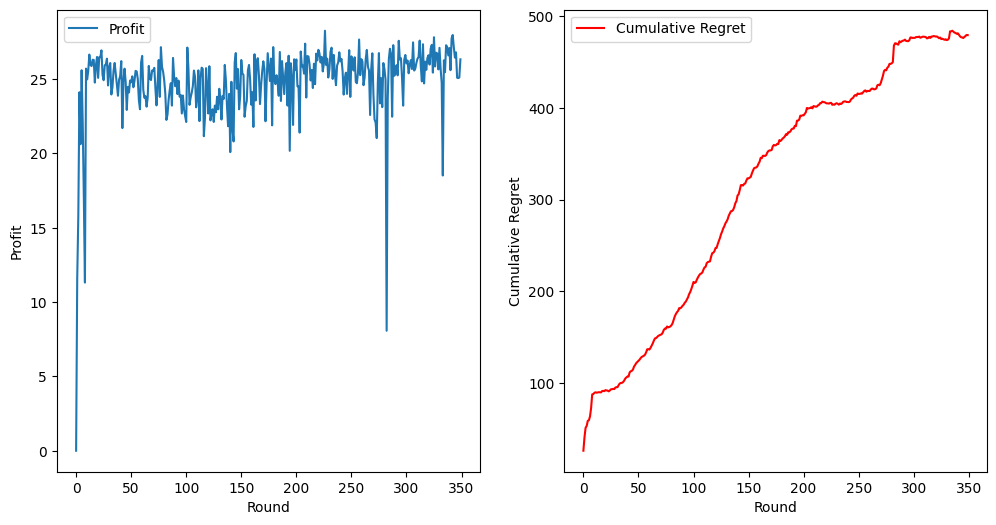

1 Round 1: p1=0.00, p2=0.00, profit=0.00, regret=26.19
1 Round 2: p1=1.00, p2=1.00, profit=15.97, regret=10.22
1 Round 3: p1=1.00, p2=0.95, profit=13.73, regret=12.47
1 Round 4: p1=0.89, p2=1.00, profit=19.26, regret=6.93
1 Round 5: p1=0.68, p2=1.00, profit=20.86, regret=5.34
1 Round 6: p1=0.16, p2=1.00, profit=10.83, regret=15.36
1 Round 7: p1=0.42, p2=0.63, profit=22.23, regret=3.96
1 Round 8: p1=0.58, p2=0.26, profit=22.00, regret=4.20
1 Round 9: p1=1.00, p2=0.00, profit=14.45, regret=11.74
1 Round 10: p1=0.74, p2=0.53, profit=26.66, regret=-0.47
1 Round 11: p1=0.68, p2=0.63, profit=27.01, regret=-0.82
1 Round 12: p1=0.68, p2=0.47, profit=24.65, regret=1.54
1 Round 13: p1=0.84, p2=0.53, profit=24.79, regret=1.41
1 Round 14: p1=0.74, p2=0.58, profit=25.67, regret=0.53
1 Round 15: p1=0.84, p2=0.26, profit=23.59, regret=2.60
1 Round 16: p1=0.68, p2=0.58, profit=25.43, regret=0.76
1 Round 17: p1=0.68, p2=0.74, profit=25.37, regret=0.83
1 Round 18: p1=0.79, p2=0.42, profit=26.63, regret=

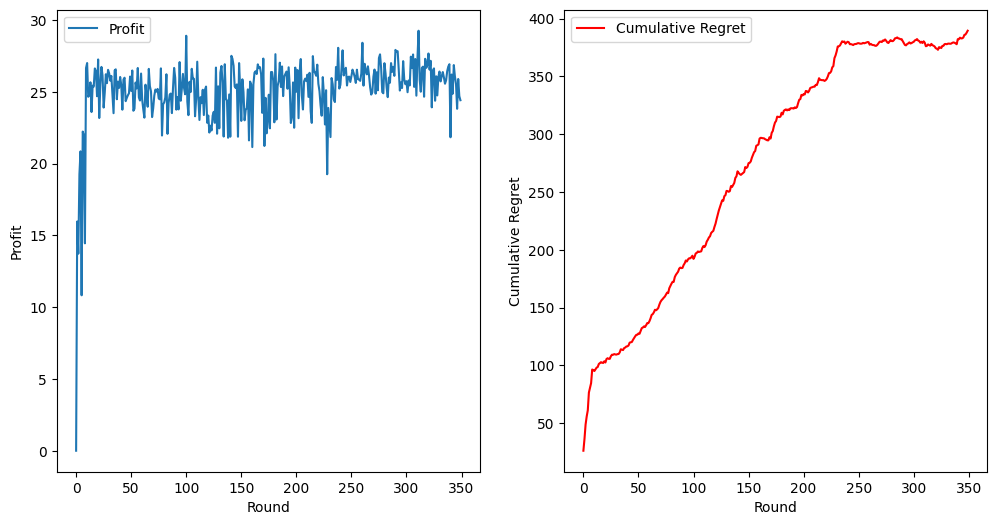

2 Round 1: p1=0.00, p2=0.00, profit=0.00, regret=26.19
2 Round 2: p1=1.00, p2=1.00, profit=18.21, regret=7.98
2 Round 3: p1=1.00, p2=0.95, profit=18.07, regret=8.12
2 Round 4: p1=0.37, p2=1.00, profit=16.84, regret=9.35
2 Round 5: p1=1.00, p2=0.26, profit=22.78, regret=3.41
2 Round 6: p1=1.00, p2=0.00, profit=13.54, regret=12.66
2 Round 7: p1=0.89, p2=0.37, profit=23.83, regret=2.36
2 Round 8: p1=1.00, p2=0.47, profit=23.03, regret=3.17
2 Round 9: p1=0.79, p2=0.58, profit=26.09, regret=0.11
2 Round 10: p1=0.63, p2=0.53, profit=25.71, regret=0.48
2 Round 11: p1=0.68, p2=0.74, profit=24.11, regret=2.08
2 Round 12: p1=0.74, p2=0.53, profit=26.86, regret=-0.66
2 Round 13: p1=0.74, p2=0.58, profit=24.70, regret=1.49
2 Round 14: p1=0.79, p2=0.53, profit=26.03, regret=0.16
2 Round 15: p1=0.74, p2=0.42, profit=26.71, regret=-0.52
2 Round 16: p1=0.84, p2=0.47, profit=24.36, regret=1.83
2 Round 17: p1=0.74, p2=0.47, profit=28.37, regret=-2.18
2 Round 18: p1=0.68, p2=0.47, profit=25.79, regret=0.

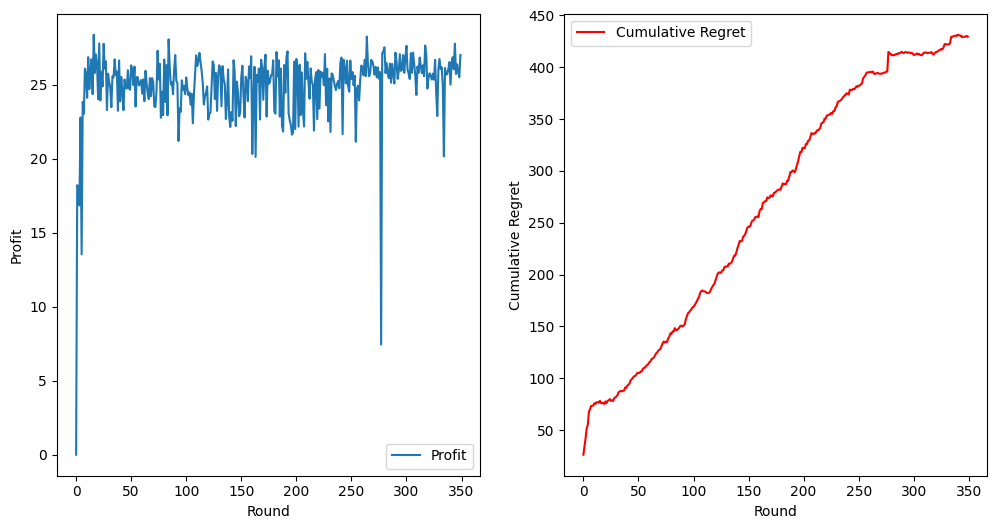

3 Round 1: p1=0.00, p2=0.00, profit=0.00, regret=26.19
3 Round 2: p1=1.00, p2=1.00, profit=12.43, regret=13.76
3 Round 3: p1=1.00, p2=0.00, profit=13.92, regret=12.27
3 Round 4: p1=1.00, p2=0.47, profit=25.72, regret=0.48
3 Round 5: p1=1.00, p2=0.42, profit=25.23, regret=0.96
3 Round 6: p1=0.79, p2=0.47, profit=26.65, regret=-0.46
3 Round 7: p1=0.47, p2=0.74, profit=22.84, regret=3.35
3 Round 8: p1=0.00, p2=1.00, profit=1.78, regret=24.41
3 Round 9: p1=0.53, p2=0.42, profit=25.53, regret=0.66
3 Round 10: p1=0.74, p2=0.53, profit=25.84, regret=0.35
3 Round 11: p1=0.74, p2=0.32, profit=23.78, regret=2.41
3 Round 12: p1=0.37, p2=0.53, profit=22.36, regret=3.83
3 Round 13: p1=0.89, p2=0.53, profit=26.21, regret=-0.02
3 Round 14: p1=0.58, p2=0.53, profit=24.94, regret=1.26
3 Round 15: p1=0.79, p2=0.63, profit=25.80, regret=0.39
3 Round 16: p1=0.89, p2=0.42, profit=24.37, regret=1.83
3 Round 17: p1=0.68, p2=0.47, profit=25.21, regret=0.98
3 Round 18: p1=1.00, p2=0.58, profit=23.29, regret=2.

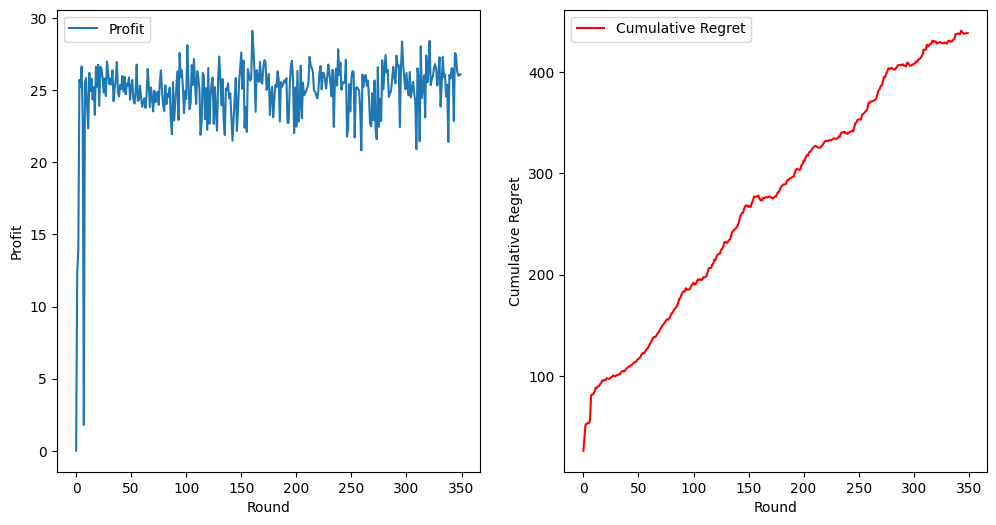

4 Round 1: p1=0.00, p2=0.00, profit=0.00, regret=26.19
4 Round 2: p1=1.00, p2=1.00, profit=13.99, regret=12.20
4 Round 3: p1=1.00, p2=0.95, profit=17.53, regret=8.66
4 Round 4: p1=0.37, p2=1.00, profit=16.00, regret=10.19
4 Round 5: p1=0.00, p2=1.00, profit=2.83, regret=23.36
4 Round 6: p1=0.58, p2=0.68, profit=25.22, regret=0.97
4 Round 7: p1=0.68, p2=1.00, profit=18.78, regret=7.41
4 Round 8: p1=0.89, p2=0.00, profit=17.26, regret=8.93
4 Round 9: p1=0.63, p2=0.00, profit=15.85, regret=10.34
4 Round 10: p1=0.79, p2=0.32, profit=23.87, regret=2.32
4 Round 11: p1=0.63, p2=0.89, profit=21.13, regret=5.07
4 Round 12: p1=0.79, p2=0.58, profit=25.22, regret=0.98
4 Round 13: p1=0.58, p2=0.47, profit=25.86, regret=0.34
4 Round 14: p1=0.68, p2=0.53, profit=25.63, regret=0.56
4 Round 15: p1=0.63, p2=1.00, profit=19.92, regret=6.27
4 Round 16: p1=0.74, p2=0.53, profit=25.26, regret=0.93
4 Round 17: p1=0.68, p2=0.63, profit=25.56, regret=0.63
4 Round 18: p1=0.21, p2=0.53, profit=17.67, regret=8.5

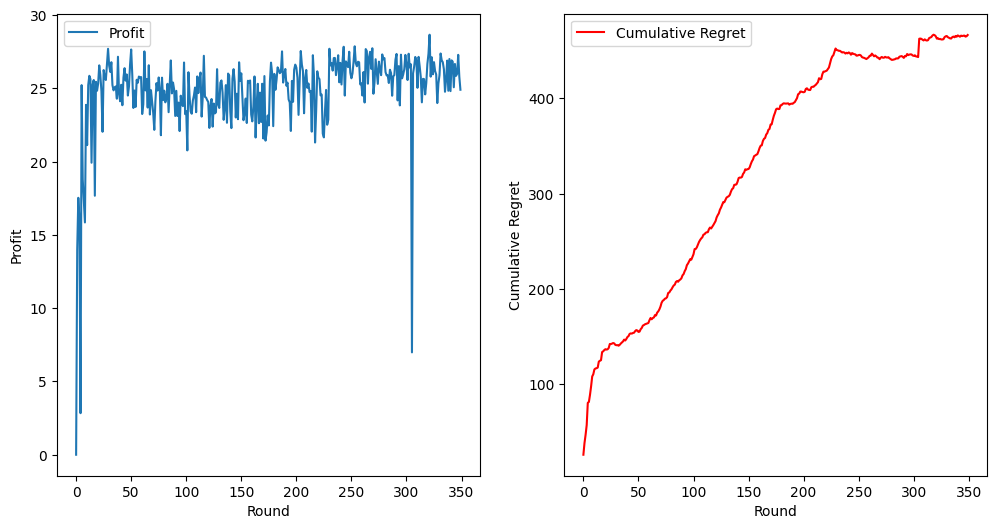

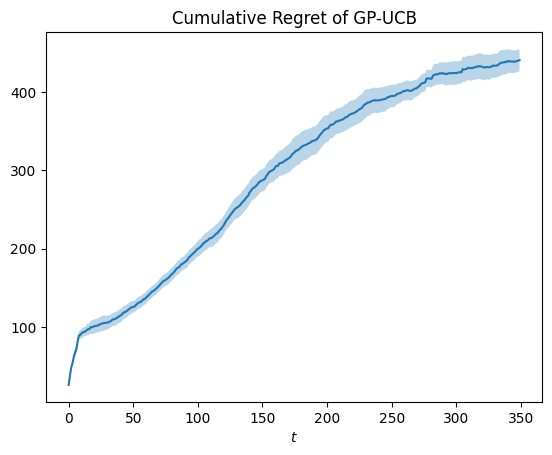

In [7]:
regrets = []

for trial in range(n_trials):

  agent = GPUCB_Agent(kernel)
  agent_rewards = np.array([])

  for t in range(T):
      # Select prices
      p1, p2 = agent.select_arm()

      # Observe demands
      demand1, demand2 = demand_curve(p1, p2)
      profit1, profit2 = p1 * demand1, p2 * demand2

      # Update agent
      agent.update([p1, p2], profit1, profit2)

      # Calculate profit and regret
      agent_rewards = np.append(agent_rewards, profit1 + profit2)

      print(f"{trial} Round {t+1}: p1={p1:.2f}, p2={p2:.2f}, profit={(profit1 + profit2):.2f}, regret={(highest_value - profit1 - profit2):.2f}")

  expected_clairvoyant_rewards = np.repeat(highest_value, T)
  cumulative_regret = np.cumsum(expected_clairvoyant_rewards-agent_rewards)

  # Plot results
  plt.figure(figsize=(12, 6))
  plt.subplot(1, 2, 1)
  plt.plot(agent_rewards, label='Profit')
  plt.xlabel('Round')
  plt.ylabel('Profit')
  plt.legend()

  plt.subplot(1, 2, 2)
  plt.plot(cumulative_regret, label='Cumulative Regret', color='r')
  plt.xlabel('Round')
  plt.ylabel('Cumulative Regret')
  plt.legend()

  plt.show()

  regrets.append(cumulative_regret)

regret_avg = np.mean(regrets, axis=0)
regret_std = np.std(regrets, axis=0)

plt.figure()
plt.plot(regret_avg)
plt.fill_between(range(T),
                 regret_avg - regret_std/np.sqrt(n_trials),
                 regret_avg + regret_std/np.sqrt(n_trials),
                 alpha=0.3,
                 label='Uncertainty')
plt.title('Cumulative Regret of GP-UCB')
plt.xlabel('$t$')
plt.show()


# Requirement 4: Compare different bidding algorithms

In [ ]:
simulation_params = {
    'n_auction_trials': 5,
    'seed': 42
}

In [ ]:
auction_params = {
      'budget': 300,
      'T': 1_000,
      'n_sp': 2, #number of multiplicative pacing agents
      'n_hedge': 2, #number of hedge pacing strategy agents
      'n_ucb': 2, #number of ucb like agents
      'valuations': [0.7,0.5,0.7,0.5,0.7,0.5],
      'n_bids': 10,
      'K_clairvoyant': 50,
      'n_slots': 2
  }

### Agents definition

In [ ]:
def sigmoid(x):
    return 1 / (1 + np.exp(-x))

In [ ]:
class HedgeAgent(Agent):
  def __init__(self, K, learning_rate):
    self.K = K
    self.learning_rate = learning_rate
    self.weights = np.ones(K) # weights used to determine arm probabilities
    self.x_t = np.ones(K)/K # probability distribution of arms (initially uniform)
    self.a_t = None # chosen actions
    self.t = 0 # time index

  def pull_arm(self):
    self.x_t = self.weights/sum(self.weights)
    self.a_t = np.random.choice(np.arange(self.K), p=self.x_t)
    return self.a_t

  def update(self, l_t):
    for i in range(self.K):
      self.weights[i] *= np.exp(-self.learning_rate*l_t[i])
    self.t += 1

In [ ]:
class FFMultiplicativePacingHedgeAgent(BiddingAgent):
  def __init__(self, bids_set, budget, T, eta):
    """
    Bidding agent operating through a first-price multiplicative pacing strategy.

    Parameters:
    - bids_set: set of discretised available bids.
    - budget: advertising campaign budget.
    - T: number of rounds.
    - eta: learning rate used to update lambdas.
    """
    self.lmbd_hist = []
    self.bids_set = bids_set
    self.K = len(bids_set)
    self.T = T
    self.hedge = HedgeAgent(self.K,
                          np.sqrt(np.log(self.K)/(self.K * T))) # from theory, eta = np.sqrt(np.log(self.K)/KT)
    self.budget = budget
    self.eta = eta
    self.rho = self.budget/self.T
    self.lmbd = 1
    self.t = 0
    self.L_sum = np.zeros(self.K)

  def bid(self):
    bid = self.bids_set[self.hedge.pull_arm()]
    if self.budget < bid:
        bid = self.budget
    return bid

  def update(self, f_t, c_t, my_bid, rewards_full_feedback, costs_full_feedback):
    L = rewards_full_feedback - self.lmbd*(costs_full_feedback-self.rho)
    range_L = 2+(1-self.rho)/self.rho
    self.hedge.update((2-L)/range_L) # hedge needs losses in [0,1]
    # update lagrangian multiplier
    self.lmbd = np.clip(self.lmbd-self.eta*(self.rho-c_t),
                        a_min=0, a_max=1/self.rho)
    # update budget
    self.budget -= c_t

  def get_arm_probabilities(self):
    return self.hedge.x_t

In [ ]:
class SPMultiplicativePacingAgent(BiddingAgent):
  def __init__(self, value, budget, T, eta):
    """
    Bidding agent operating through a second-price multiplicative pacing strategy.

    Parameters:
    - valuation: valuation of item used to compute income.
    - budget: advertising campaign budget.
    - T: number of rounds.
    - eta: learning rate used to update lambdas.
    """
    self.value = value
    self.budget = budget
    self.eta = eta
    self.T = T
    self.rho = self.budget/self.T
    self.lmbd = 1
    self.t = 0
    self.lmbd_hist = []

  def bid(self):
    if self.budget < 1:
        return 0
    return self.value/(self.lmbd+1)

  def update(self, f_t, c_t, m_t, rewards_full_feedback=None, costs_full_feedback=None):
    self.lmbd = np.clip(self.lmbd-self.eta*(self.rho-c_t),
                        a_min=0, a_max=1/self.rho)
    self.lmbd_hist.append(self.lmbd)
    self.budget -= c_t

  def get_arm_probabilities(self):
    return None

In [ ]:
class UCBLikeAgent(Agent):
  """
  UCB-like algorith for MAB generalised auctions.

  Parameters:
  - K: number of arms (bids).
  - T: number of rounds.
  - range: term affecting exploration, higher is more explorative.
  """
  def __init__(self, K, T, range=1):
    self.K = K
    self.T = T
    self.range = range
    self.a_t = None
    self.average_profit = np.zeros(self.K)
    self.average_cost = np.zeros(self.K)
    self.profit_ucbs = np.zeros(self.K)
    self.cost_ucbs = np.zeros(self.K)
    self.N_pulls = np.zeros(self.K)
    self.arm_probabilities = np.zeros(self.K)
    self.t = 0

  def pull_arm(self, rho):
    if self.t < self.K:
      self.a_t = self.t
    else:
      # use t instead of T to make it "anytime" (also, in practice, performs better)
      self.profit_ucbs = self.average_profit + self.range*np.sqrt(2*np.log(self.T)/self.N_pulls)
      self.cost_ucbs = self.average_cost - self.range*np.sqrt(2*np.log(self.T)/self.N_pulls)

      ## Linear Program OPT_t
      c = -self.profit_ucbs
      A_ub = [self.cost_ucbs]
      b_ub = [rho]
      A_eq = [np.ones(self.K)]
      b_eq = [1]
      res = optimize.linprog(c, A_ub=A_ub, b_ub=b_ub, A_eq=A_eq, b_eq=b_eq, bounds=(0,1))
      gamma = res.x

      # print(self.cost_ucbs)
      # print(f"{self.cost_ucbs@gamma} < {rho}")

      self.arm_probabilities = gamma

      # Bid from the discrete probability distribution
      bid_index = np.random.choice(self.K, p=gamma)
      self.a_t = bid_index

    return self.a_t

  def update(self, f_t, c_t):
    self.N_pulls[self.a_t] += 1
    self.average_profit[self.a_t] += (f_t - self.average_profit[self.a_t])/self.N_pulls[self.a_t] # online average update
    self.average_cost[self.a_t] += (c_t - self.average_cost[self.a_t])/self.N_pulls[self.a_t] # online average update

    self.t += 1

In [ ]:
class FFMultiplicativePacingUCBLikeAgent(BiddingAgent):
  def __init__(self, bids_set, budget, T, eta):
    """
    Bidding agent operating through a first-price multiplicative pacing strategy.

    Parameters:
    - bids_set: set of discretised available bids.
    - valuation: valuation of item used to compute income.
    - budget: advertising campaign budget.
    - T: number of rounds.
    - eta: learning rate used to update lambdas.
    """
    self.lmbd_hist = []
    self.bids_set = bids_set
    self.K = len(bids_set)
    self.T = T
    self.ucb = UCBLikeAgent(self.K, self.T, range=0.01)
    self.budget = budget
    self.eta = eta
    self.rho = self.budget/self.T
    self.lmbd = 1
    self.t = 0

  def bid(self):
    bid = self.bids_set[self.ucb.pull_arm(self.rho)]
    if self.budget < bid:
        bid = self.budget
    return bid

  def update(self, f_t, c_t, my_bid, rewards_full_feedback=None, costs_full_feedback=None):
    # update ucb
    self.ucb.update(f_t, c_t)
    # update budget
    self.budget -= c_t

  def get_arm_probabilities(self):
    return self.ucb.arm_probabilities # + self.ucb.range*np.sqrt(2*np.log(self.ucb.T)/self.ucb.N_pulls)


### Auction

In [ ]:
class GeneralizedFirstPriceAuction(Auction):
    def __init__(self, ctrs, nSlots):
        self.ctrs = ctrs
        self.n_slots = nSlots

    def get_winners(self, bids):
        adv_values = self.ctrs * bids
        adv_ranking = np.argsort(adv_values)[::-1]
        winners = adv_ranking[:self.n_slots]                       # We can not have more winners than the # of available slots
        return winners, adv_values[winners]

    def get_payments_per_click(self, winners, values, bids):
        payments = bids[winners]
        return payments.round(2)

In [ ]:
# calculate maxBids. dimensions time x n_agents. each i,j is the max over the row excluding column j
# if n_slots=1 we need the max, if n_slots=2 we need the seconds largest, and so on
def max_excluding_columns(arr, n_slots):
    # Initialize the result matrix with the same shape as the input array
    result = np.zeros_like(arr)

    # Iterate over each row
    for i in range(arr.shape[0]):
        # Iterate over each column
        for j in range(arr.shape[1]):
            # Exclude the current column
            excluded_arr = np.delete(arr[i], j)
            # Sort the remaining elements in descending order
            sorted_arr = np.sort(excluded_arr)[::-1]
            # Get the n-th largest value, considering 1-based index for n_slots
            if n_slots <= len(sorted_arr):
                nth_largest_val = sorted_arr[n_slots - 1]
            else:
                nth_largest_val = sorted_arr[-1]  # If n_slots is out of range, take the smallest
            # Assign the n-th largest value to the result matrix
            result[i, j] = nth_largest_val

    return result

In [ ]:
def Auction_trial(auction_params, seed):

  # Unpack parameters
  budget = auction_params['budget']
  T = auction_params['T']
  valuations = auction_params['valuations']
  K = auction_params['n_bids']
  n_sp = auction_params['n_sp']
  n_hedge = auction_params['n_hedge']
  n_ucb = auction_params['n_ucb']
  k_clairvoyant = auction_params['K_clairvoyant']
  n_slots = auction_params['n_slots']

  np.random.seed(seed)

  auction = GeneralizedFirstPriceAuction(np.ones(n_sp+n_hedge+n_ucb), n_slots)

  bids_set = np.linspace(0, 1, K)

  agents = [] #set of agents
  j = 0 #used to set valuations
  agent_names = []
  for i in range(n_sp):
    agent = SPMultiplicativePacingAgent(value=valuations[j],
                                        budget=budget,
                                        T=T,
                                        eta=50/np.sqrt(T))
    agents.append(agent)
    agent_names.append('Mult Pacing ' + str(i+1) + " v:" + str(valuations[j]))
    j += 1
  for i in range(n_hedge):
    agent = FFMultiplicativePacingHedgeAgent(bids_set = bids_set,
                                        budget=budget,
                                        T=T,
                                        eta=1/np.sqrt(T))
    agents.append(agent)
    agent_names.append('Hedge ' + str(i+1) + " v:" + str(valuations[j]))
    j += 1
  for i in range(n_ucb):
    agent = FFMultiplicativePacingUCBLikeAgent(bids_set = bids_set,
                                      budget=budget,
                                      T=T,
                                      eta=1/np.sqrt(T))
    agents.append(agent)
    agent_names.append('UCB like ' + str(i+1) + " v:" + str(valuations[j]))
    j += 1

  reward_history = []
  payment_history = []
  bid_history = []
  for u in range(T):
      # get bids from agents
      bids = [agent.bid() for agent in agents]
      winners, _ = auction.get_winners(bids)
      rewards_full_feedback = np.zeros((len(agents), len(bids_set)))
      costs_full_feedback = np.zeros(((len(agents), len(bids_set))))
      min_winnig_bid = min([bids[i] for i in winners])
      for i in range(len(agents)):
        for j, elem in enumerate(bids_set):
          rewards_full_feedback[i, j] = (valuations[i] - elem) * (elem > min_winnig_bid)
          costs_full_feedback[i, j] = elem * (elem > min_winnig_bid)

      # calculate payments and rewards
      rewards = [0 for x in range(len(agents))]
      payments = [0 for x in range(len(agents))]
      for i in winners:
        rewards[i] = valuations[i] - bids[i]
        payments[i] = bids[i]

      # update agents
      for i in range(len(agents)):
        agents[i].update(rewards[i], payments[i], bids[i], rewards_full_feedback[i], costs_full_feedback[i])

      # log results
      reward_history.append(rewards)
      payment_history.append(payments)
      bid_history.append(bids)

  reward_history = np.array(reward_history)
  payment_history = np.array(payment_history)
  bid_history = np.array(bid_history)

  # calculate clayrvoyant
  clairvoyant_bids_set = np.linspace(0, 1, k_clairvoyant)
  n_agents = bid_history.shape[1]
  time = bid_history.shape[0]
  n_bids = clairvoyant_bids_set.shape[0]
  rho = budget / time

  max_bids = max_excluding_columns(bid_history, n_slots) # maximum bid excluding agent (dimensions: time x n_agents)
  win_probabilities = np.zeros((n_agents, n_bids))
  for i in range(n_agents):
    for j, b in enumerate(clairvoyant_bids_set):
      win_probabilities[i, j] = sum(b > max_bids[:,i]) / time

  expected_clairvoyant_utilities = np.zeros((n_agents, time))
  expected_clairvoyant_bids = np.zeros((n_agents, time))
  for i in range(n_agents):
    ## Linear Program
    c = -(valuations[i] - clairvoyant_bids_set) * win_probabilities[i]
    A_ub = [clairvoyant_bids_set * win_probabilities[i]]
    b_ub = [rho]
    A_eq = [np.ones(len(clairvoyant_bids_set))]
    b_eq = [1]
    res = optimize.linprog(c, A_ub=A_ub, b_ub=b_ub, A_eq=A_eq, b_eq=b_eq, bounds=(0, 1))
    gamma = res.x
    expected_clairvoyant_utilities[i] = [-res.fun for u in range(time)]
    expected_clairvoyant_bids[i] = [sum(clairvoyant_bids_set*gamma*win_probabilities[i]) for u in range(time)]

  return reward_history, payment_history, bid_history, expected_clairvoyant_utilities, expected_clairvoyant_bids, agent_names

### Execution

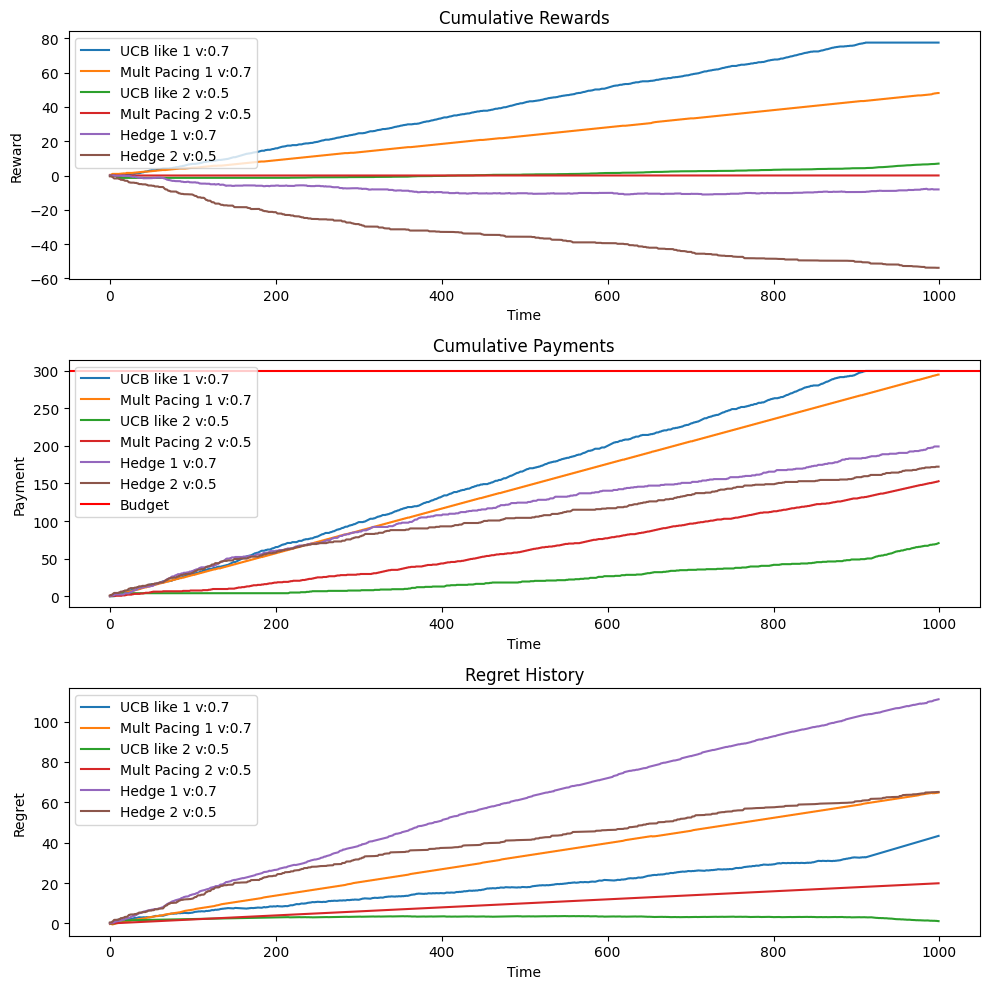

<Figure size 640x480 with 0 Axes>

In [ ]:
reward_history, payment_history, bid_history, expected_clairvoyant_utilities, expected_clairvoyant_bids, agent_names = Auction_trial(auction_params, simulation_params['seed'])
regret = expected_clairvoyant_utilities.T - reward_history
cumulative_regret = np.cumsum(regret, axis=0)
cumulative_payment = np.cumsum(payment_history, axis=0)
cumulative_rewards = np.cumsum(reward_history, axis=0)

sorted_indices_rewards = np.argsort(cumulative_rewards[-1,:])[::-1]
# Create subplots
fig, axs = plt.subplots(3, 1, figsize=(10, 10))

# Plot rewards
for i in sorted_indices_rewards:
    axs[0].plot(cumulative_rewards[:, i], label=agent_names[i])
axs[0].set_title('Cumulative Rewards')
axs[0].set_xlabel('Time')
axs[0].set_ylabel('Reward')
axs[0].legend()

# Plot Payment History
for i in sorted_indices_rewards:
    axs[1].plot(cumulative_payment[:, i], label=agent_names[i])
axs[1].set_title('Cumulative Payments')
axs[1].set_xlabel('Time')
axs[1].set_ylabel('Payment')
axs[1].axhline(auction_params['budget'], color='red', label='Budget')
axs[1].legend()

# Plot Regret History
for i in sorted_indices_rewards:
    axs[2].plot(cumulative_regret[:, i], label=agent_names[i])
axs[2].set_title('Regret History')
axs[2].set_xlabel('Time')
axs[2].set_ylabel('Regret')
axs[2].legend()

# Adjust layout
plt.tight_layout()
plt.show()

In [ ]:
plt.savefig('filename.png', dpi=300)

<Figure size 640x480 with 0 Axes>